# 07. Búsqueda visual por raza y validación externa con Tsinghua Dogs
## Objetivo

En los análisis anteriores se estudió la capacidad predictiva de las características estructuradas, textuales y visuales disponibles en PetFinder para identificar perros con riesgo de adopción lenta. En este notebook se amplía el análisis visual mediante un conjunto de datos externo específicamente diseñado para el reconocimiento fino de razas caninas: **Tsinghua Dogs**.

El objetivo de este análisis no es utilizar Tsinghua Dogs para predecir directamente la velocidad de adopción, ya que este conjunto de datos no contiene información sobre procesos de adopción. Su utilidad dentro de *Invisible Dogs* se centra en estudiar y aprovechar la representación visual de los perros.

En particular, se persiguen los siguientes objetivos:

1. **Evaluar la capacidad de representaciones visuales preentrenadas para capturar información asociada a la raza y apariencia del perro.**
2. **Construir representaciones prototipo de las diferentes razas** a partir de múltiples fotografías de Tsinghua Dogs.
3. **Evaluar la recuperación de perros visualmente similares** mediante técnicas de similitud entre embeddings.
4. **Analizar la transferencia de estas representaciones hacia PetFinder**, comprobando si los prototipos construidos sobre un conjunto externo permiten recuperar perros con características visuales similares.
5. **Evaluar la robustez de las representaciones ante el cambio de dominio entre Tsinghua Dogs y PetFinder**, comprobando su utilidad cuando las fotografías proceden de otra fuente, con condiciones de captura y distribución diferentes.
6. **Preparar los artefactos necesarios para una futura funcionalidad de búsqueda visual dentro de la aplicación Invisible Dogs**, donde un usuario pueda seleccionar una raza o apariencia de referencia y recuperar perros disponibles para adopción ordenados por similitud visual.

La similitud visual se tratará como un criterio de búsqueda independiente del riesgo de adopción lenta estimado por *Invisible Dogs*. De esta forma, el sistema podrá identificar perros que se ajusten visualmente a las preferencias del adoptante y, simultáneamente, informar sobre aquellos animales que presentan mayor riesgo de permanecer durante más tiempo esperando una adopción.

### Fuentes y referencias metodológicas

El análisis utiliza la versión de **Tsinghua Dogs** distribuida en Hugging Face y toma como referencia el trabajo científico original del conjunto de datos. Para la extracción de representaciones se emplean los modelos preentrenados **CLIP ViT-B/32** y **DINOv2-small**.

Las referencias completas y los enlaces utilizados se recogen al final del notebook. La versión de Hugging Face se utiliza como fuente práctica de los archivos Parquet, mientras que el artículo original de Tsinghua Dogs constituye la referencia científica del conjunto de datos.

## 1. Definición de rutas

Se definen las rutas utilizadas durante el análisis manteniendo la misma estructura general empleada en los notebooks anteriores.

Las rutas internas del proyecto se resuelven de forma relativa a la raíz de *Invisible Dogs*. La ubicación de Tsinghua Dogs puede indicarse mediante la variable de entorno `TSINGHUA_DATA_DIR`; si no está definida, se buscan ubicaciones locales habituales. De forma análoga, `INVISIBLE_DOGS_PROJECT_ROOT` permite indicar explícitamente la raíz del proyecto cuando no pueda inferirse desde el directorio de trabajo.

Los datos de Tsinghua Dogs se mantienen separados de PetFinder y se utiliza un directorio específico de resultados para guardar representaciones visuales, prototipos de raza, índices y demás artefactos generados durante este notebook.

Los cálculos computacionalmente costosos se almacenan para permitir su reutilización en ejecuciones posteriores. Por defecto, `RECALCULAR_ARTEFACTOS = False`.

In [1]:
from pathlib import Path
import os
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image


pd.set_option(
    "display.max_columns",
    None
)

pd.set_option(
    "display.max_rows",
    150
)

pd.set_option(
    "display.width",
    180
)


RANDOM_STATE = 42

np.random.seed(
    RANDOM_STATE
)

random.seed(
    RANDOM_STATE
)


print(
    "Entorno inicializado correctamente."
)

Entorno inicializado correctamente.


In [2]:
# Definición reproducible de rutas del proyecto y de Tsinghua Dogs

# ---------------------------------------------------------
# Localización de la raíz del proyecto
# ---------------------------------------------------------

project_env_path = os.getenv(
    "INVISIBLE_DOGS_PROJECT_ROOT"
)

candidatos_proyecto = []

if project_env_path:
    candidatos_proyecto.append(
        Path(project_env_path).expanduser()
    )

current_path = Path.cwd()

candidatos_proyecto.extend([
    current_path,
    *current_path.parents
])

# Ruta histórica utilizada en el proyecto, mantenida únicamente
# como último recurso para facilitar la reproducibilidad local.
candidatos_proyecto.append(
    Path(r"G:\Mi unidad\TFM\invisible-dogs-tfm")
)

project_path = next(
    (
        ruta
        for ruta in candidatos_proyecto
        if (ruta / "data").exists()
        and (
            (ruta / "notebooks").exists()
            or (ruta / "outputs").exists()
        )
    ),
    None
)

if project_path is None:
    raise FileNotFoundError(
        "No se ha podido localizar la raíz del proyecto Invisible Dogs. "
        "Ejecute el notebook desde la raíz o desde la carpeta notebooks, "
        "o defina la variable de entorno INVISIBLE_DOGS_PROJECT_ROOT."
    )

project_path = project_path.resolve()

data_path = project_path / "data"
processed_data_path = data_path / "processed"
outputs_path = project_path / "outputs"
tsinghua_outputs_path = outputs_path / "tsinghua_visual"

tsinghua_outputs_path.mkdir(
    parents=True,
    exist_ok=True
)


# ---------------------------------------------------------
# Localización de Tsinghua Dogs
# ---------------------------------------------------------

tsinghua_env_path = os.getenv(
    "TSINGHUA_DATA_DIR"
)

candidatos_tsinghua = []

if tsinghua_env_path:
    candidatos_tsinghua.append(
        Path(tsinghua_env_path).expanduser()
    )

candidatos_tsinghua.extend([
    data_path / "raw_tsinghua",
    (
        Path.home()
        / "OneDrive"
        / "Escritorio"
        / "Master Data Science"
        / "0. TEMARIO"
        / "_TFM"
        / "Invisible Dogs"
        / "4. Tsinghua Dogs"
    )
])


tsinghua_local_path = None
archivos_parquet_tsinghua = []

for ruta in candidatos_tsinghua:

    if not ruta.exists():
        continue

    parquets = sorted(
        ruta.rglob("*.parquet")
    )

    if len(parquets) > 0:
        tsinghua_local_path = ruta
        archivos_parquet_tsinghua = parquets
        break


if tsinghua_local_path is None:
    raise FileNotFoundError(
        "No se han localizado los archivos Parquet de Tsinghua Dogs. "
        "Coloque el dataset bajo data/raw_tsinghua o defina "
        "TSINGHUA_DATA_DIR apuntando a la carpeta descargada."
    )


# ---------------------------------------------------------
# Configuración general de artefactos
# ---------------------------------------------------------

RECALCULAR_ARTEFACTOS = False

# Evita barras de progreso y mensajes no esenciales de Hugging Face.
os.environ.setdefault(
    "HF_HUB_DISABLE_PROGRESS_BARS",
    "1"
)


print("Ruta del proyecto:")
print(project_path)

print("\nDatos procesados:")
print(processed_data_path)

print("\nResultados de Tsinghua:")
print(tsinghua_outputs_path)

print("\nRuta de Tsinghua Dogs:")
print(tsinghua_local_path)

print("\nArchivos Parquet encontrados:")
print(len(archivos_parquet_tsinghua))

print("\nRecalcular artefactos pesados:")
print(RECALCULAR_ARTEFACTOS)

Ruta del proyecto:
G:\Mi unidad\TFM\invisible-dogs-tfm

Datos procesados:
G:\Mi unidad\TFM\invisible-dogs-tfm\data\processed

Resultados de Tsinghua:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\tsinghua_visual

Ruta de Tsinghua Dogs:
C:\Users\isaa-\OneDrive\Escritorio\Master Data Science\0. TEMARIO\_TFM\Invisible Dogs\4. Tsinghua Dogs

Archivos Parquet encontrados:
7

Recalcular artefactos pesados:
False


## 2. Carga y documentación de Tsinghua Dogs

Tsinghua Dogs fue desarrollado como un conjunto de datos para clasificación fina de razas caninas. El conjunto original contiene más de 70.000 fotografías correspondientes a 130 razas y presenta una elevada variabilidad visual dentro de una misma raza.

Para el presente análisis se utiliza la versión disponible en Hugging Face, que proporciona las fotografías junto con la etiqueta correspondiente a la raza.

Antes de realizar cualquier transformación se inspeccionan los archivos disponibles y la estructura de los conjuntos proporcionados, con el objetivo de comprobar que los datos descargados coinciden con la estructura esperada.

In [3]:
# Inventario de archivos Parquet de Tsinghua Dogs

archivos_tsinghua = sorted(
    tsinghua_local_path.rglob(
        "*.parquet"
    )
)


if len(archivos_tsinghua) == 0:

    raise FileNotFoundError(
        "No se han encontrado archivos "
        "Parquet de Tsinghua Dogs."
    )


inventario_tsinghua = pd.DataFrame({
    "archivo": [
        archivo.name
        for archivo
        in archivos_tsinghua
    ],

    "ruta": [
        str(archivo)
        for archivo
        in archivos_tsinghua
    ],

    "tamano_mb": [
        archivo.stat().st_size
        / 1024**2
        for archivo
        in archivos_tsinghua
    ]
})


print(
    "Número de archivos Parquet:"
)

print(
    len(
        inventario_tsinghua
    )
)


print(
    "\nTamaño total:"
)

print(
    f"{inventario_tsinghua['tamano_mb'].sum():.2f} MB"
)


print(
    "\nArchivos disponibles:"
)

display(
    inventario_tsinghua
    .round({
        "tamano_mb": 2
    })
)

Número de archivos Parquet:
7

Tamaño total:
2538.98 MB

Archivos disponibles:


,archivo,ruta,tamano_mb
0,train-00000-of-00006.parquet,C:\Users\isaa-\OneDrive\Escritorio\Master Data...,374.59
1,train-00001-of-00006.parquet,C:\Users\isaa-\OneDrive\Escritorio\Master Data...,341.99
2,train-00002-of-00006.parquet,C:\Users\isaa-\OneDrive\Escritorio\Master Data...,442.60
3,train-00003-of-00006.parquet,C:\Users\isaa-\OneDrive\Escritorio\Master Data...,381.29
4,train-00004-of-00006.parquet,C:\Users\isaa-\OneDrive\Escritorio\Master Data...,413.21
5,train-00005-of-00006.parquet,C:\Users\isaa-\OneDrive\Escritorio\Master Data...,398.22
6,validation-00000-of-00001.parquet,C:\Users\isaa-\OneDrive\Escritorio\Master Data...,187.07


In [4]:
# Dependencias necesarias para la lectura de los archivos Parquet

try:
    import pyarrow
    import pyarrow as pa
    import pyarrow.parquet as pq
except ModuleNotFoundError as exc:
    raise ModuleNotFoundError(
        "PyArrow no está disponible en el entorno actual. "
        "Instálelo en el entorno invisible-dogs-dl antes de ejecutar "
        "el notebook; las dependencias no se instalan desde el propio análisis."
    ) from exc

print(
    "PyArrow:",
    pyarrow.__version__
)

PyArrow: 25.0.1


In [5]:
# Inspección de la estructura de los archivos Parquet

import pyarrow.parquet as pq


resumen_parquet = []


for archivo in archivos_tsinghua:

    parquet_file = pq.ParquetFile(
        archivo
    )

    metadata = parquet_file.metadata

    resumen_parquet.append({
        "archivo": archivo.name,
        "n_filas": metadata.num_rows,
        "n_columnas": metadata.num_columns,
        "n_row_groups": metadata.num_row_groups
    })


resumen_parquet_df = pd.DataFrame(
    resumen_parquet
)


print(
    "Estructura de los archivos:"
)

display(
    resumen_parquet_df
)


print(
    "\nNúmero total de observaciones:"
)

print(
    resumen_parquet_df[
        "n_filas"
    ].sum()
)


print(
    "\nEsquema del primer archivo:"
)

primer_parquet = pq.ParquetFile(
    archivos_tsinghua[0]
)

print(
    primer_parquet.schema
)

Estructura de los archivos:


,archivo,n_filas,n_columnas,n_row_groups
0,train-00000-of-00006.parquet,10872,3,109
1,train-00001-of-00006.parquet,10872,3,109
2,train-00002-of-00006.parquet,10871,3,109
3,train-00003-of-00006.parquet,10871,3,109
4,train-00004-of-00006.parquet,10871,3,109
5,train-00005-of-00006.parquet,10871,3,109
6,validation-00000-of-00001.parquet,5200,3,52



Número total de observaciones:
70428

Esquema del primer archivo:
required group field_id=-1 schema {
  optional group field_id=-1 image {
    optional binary field_id=-1 bytes;
    optional binary field_id=-1 path (String);
  }
  optional int64 field_id=-1 label;
}



### 2.1. Estructura y particiones del conjunto de datos

La versión descargada de Tsinghua Dogs se encuentra distribuida en seis archivos correspondientes al conjunto de entrenamiento y un archivo correspondiente al conjunto de validación.

La inspección de los metadatos permite comprobar la presencia de **70.428 fotografías**, coincidiendo con el tamaño documentado del conjunto de datos. De ellas, **65.228 pertenecen al conjunto de entrenamiento y 5.200 al conjunto de validación**.

Cada observación contiene una fotografía y una etiqueta numérica asociada a la raza. La fotografía se almacena dentro del archivo Parquet mediante una estructura que incluye los bytes de la imagen y, cuando está disponible, su ruta de origen.

Antes de acceder al contenido de las fotografías se analizarán exclusivamente las etiquetas, reduciendo así el consumo de memoria y permitiendo estudiar la distribución de las razas sin cargar simultáneamente los datos visuales.

In [6]:
# Identificación de archivos de entrenamiento y validación

import pyarrow as pa
import pyarrow.parquet as pq


archivos_train_tsinghua = [
    archivo
    for archivo in archivos_tsinghua
    if archivo.name.startswith("train-")
]

archivos_valid_tsinghua = [
    archivo
    for archivo in archivos_tsinghua
    if archivo.name.startswith("validation-")
]


print(
    "Archivos de entrenamiento:",
    len(archivos_train_tsinghua)
)

print(
    "Archivos de validación:",
    len(archivos_valid_tsinghua)
)


# ---------------------------------------------------------
# Función para leer exclusivamente la etiqueta
# ---------------------------------------------------------

schema_labels_tsinghua = pa.schema([
    pa.field(
        "label",
        pa.int64()
    )
])


def cargar_labels_parquet(archivo):

    tabla = pq.read_table(
        archivo,
        columns=["label"],
        schema=schema_labels_tsinghua,
        arrow_extensions_enabled=False
    )

    return tabla.to_pandas()


# ---------------------------------------------------------
# Carga exclusiva de las etiquetas
# ---------------------------------------------------------

labels_train_tsinghua = pd.concat(
    [
        cargar_labels_parquet(
            archivo
        )
        for archivo
        in archivos_train_tsinghua
    ],
    ignore_index=True
)


labels_valid_tsinghua = pd.concat(
    [
        cargar_labels_parquet(
            archivo
        )
        for archivo
        in archivos_valid_tsinghua
    ],
    ignore_index=True
)


# ---------------------------------------------------------
# Comprobaciones
# ---------------------------------------------------------

print(
    "\nObservaciones de entrenamiento:"
)

print(
    len(labels_train_tsinghua)
)


print(
    "\nObservaciones de validación:"
)

print(
    len(labels_valid_tsinghua)
)


print(
    "\nEtiquetas distintas en train:"
)

print(
    labels_train_tsinghua[
        "label"
    ].nunique()
)


print(
    "\nEtiquetas distintas en validation:"
)

print(
    labels_valid_tsinghua[
        "label"
    ].nunique()
)


print(
    "\nRango de etiquetas:"
)

print(
    "Train:",
    labels_train_tsinghua[
        "label"
    ].min(),
    "-",
    labels_train_tsinghua[
        "label"
    ].max()
)

print(
    "Validation:",
    labels_valid_tsinghua[
        "label"
    ].min(),
    "-",
    labels_valid_tsinghua[
        "label"
    ].max()
)

Archivos de entrenamiento: 6
Archivos de validación: 1

Observaciones de entrenamiento:
65228

Observaciones de validación:
5200

Etiquetas distintas en train:
130

Etiquetas distintas en validation:
130

Rango de etiquetas:
Train: 0 - 129
Validation: 0 - 129


In [7]:
# Distribución de imágenes por etiqueta

distribucion_train = (
    labels_train_tsinghua[
        "label"
    ]
    .value_counts()
    .sort_index()
)


distribucion_valid = (
    labels_valid_tsinghua[
        "label"
    ]
    .value_counts()
    .sort_index()
)


resumen_distribucion = pd.DataFrame({
    "n_train": distribucion_train,
    "n_valid": distribucion_valid
})


print(
    "Resumen de imágenes por raza:"
)

display(
    resumen_distribucion
    .describe()
    .round(2)
)


print(
    "\nImágenes por raza en entrenamiento:"
)

print(
    "Mínimo:",
    distribucion_train.min()
)

print(
    "Máximo:",
    distribucion_train.max()
)

print(
    "Media:",
    round(
        distribucion_train.mean(),
        2
    )
)

print(
    "Mediana:",
    round(
        distribucion_train.median(),
        2
    )
)


print(
    "\nImágenes por raza en validación:"
)

print(
    "Mínimo:",
    distribucion_valid.min()
)

print(
    "Máximo:",
    distribucion_valid.max()
)

print(
    "Media:",
    round(
        distribucion_valid.mean(),
        2
    )
)


print(
    "\n¿Validation tiene el mismo número "
    "de imágenes para todas las razas?"
)

print(
    distribucion_valid.nunique() == 1
)

Resumen de imágenes por raza:


,n_train,n_valid
count,130.00,130.0
mean,501.75,40.0
std,1005.70,0.0
min,160.00,40.0
25%,171.00,40.0
50%,185.00,40.0
75%,212.00,40.0
max,7409.00,40.0



Imágenes por raza en entrenamiento:
Mínimo: 160
Máximo: 7409
Media: 501.75
Mediana: 185.0

Imágenes por raza en validación:
Mínimo: 40
Máximo: 40
Media: 40.0

¿Validation tiene el mismo número de imágenes para todas las razas?
True


### 2.2. Distribución de las razas entre entrenamiento y validación

El conjunto de entrenamiento presenta una distribución notablemente desigual entre las diferentes razas. Aunque todas ellas cuentan con al menos 160 fotografías, algunas categorías contienen varios miles de observaciones, alcanzándose un máximo de 7.409 imágenes para una única raza.

Por el contrario, el conjunto de validación presenta una estructura completamente equilibrada: cada una de las 130 razas está representada mediante exactamente 40 fotografías, dando lugar a un total de 5.200 imágenes.

Esta estructura resulta especialmente adecuada para la evaluación posterior de las representaciones visuales. El conjunto de validación se mantendrá independiente durante la construcción de los prototipos de raza y permitirá comparar el comportamiento del método bajo el mismo número de observaciones para todas las categorías.

Dado el desequilibrio existente en entrenamiento, posteriormente se construirá un subconjunto equilibrado para la generación de los prototipos visuales. De esta forma se evitará que la disponibilidad desigual de fotografías entre razas condicione el análisis y se reducirá al mismo tiempo el coste computacional asociado a la extracción de embeddings.

In [8]:
# Recuperación de los nombres de raza desde
# los metadatos de Hugging Face

import json
import re


metadata_arrow = (
    primer_parquet
    .schema_arrow
    .metadata
)


if (
    metadata_arrow is None
    or b"huggingface" not in metadata_arrow
):

    raise ValueError(
        "No se han encontrado los metadatos "
        "de Hugging Face en el archivo Parquet."
    )


metadata_huggingface = json.loads(
    metadata_arrow[
        b"huggingface"
    ].decode(
        "utf-8"
    )
)


features_huggingface = (
    metadata_huggingface
    .get(
        "info",
        {}
    )
    .get(
        "features",
        {}
    )
)


label_metadata = (
    features_huggingface
    .get(
        "label",
        {}
    )
)


nombres_razas_originales = (
    label_metadata
    .get(
        "names"
    )
)


if nombres_razas_originales is None:

    raise ValueError(
        "No se ha podido recuperar la lista "
        "de nombres asociada a 'label'."
    )


print(
    "Número de razas recuperadas:"
)

print(
    len(
        nombres_razas_originales
    )
)


print(
    "\nPrimeras etiquetas originales:"
)

for i, nombre in enumerate(
    nombres_razas_originales[:10]
):

    print(
        f"{i}: {nombre}"
    )

Número de razas recuperadas:
130

Primeras etiquetas originales:
0: 1043-n000001-Shiba_Dog
1: 1121-n000002-French_bulldog
2: 1160-n000003-Siberian_husky
3: 1324-n000004-malamute
4: 1936-n000005-Pomeranian
5: 200-n000008-Airedale
6: 200-n000010-miniature_poodle
7: 200-n000012-affenpinscher
8: 201-n000024-schipperke
9: 202-n000020-Australian_terrier


In [9]:
# Construcción del diccionario label -> raza

def limpiar_nombre_raza(
    nombre
):

    nombre_limpio = re.sub(
        r"^\d+-n\d+-",
        "",
        str(nombre)
    )

    nombre_limpio = (
        nombre_limpio
        .replace(
            "_",
            " "
        )
        .strip()
    )

    return nombre_limpio


razas_tsinghua_df = pd.DataFrame({
    "label": np.arange(
        len(
            nombres_razas_originales
        )
    ),

    "raza_original": (
        nombres_razas_originales
    )
})


razas_tsinghua_df[
    "raza"
] = (
    razas_tsinghua_df[
        "raza_original"
    ]
    .apply(
        limpiar_nombre_raza
    )
)


# ---------------------------------------------------------
# Comprobaciones
# ---------------------------------------------------------

print(
    "Número de etiquetas:"
)

print(
    len(
        razas_tsinghua_df
    )
)


print(
    "\nNúmero de razas distintas:"
)

print(
    razas_tsinghua_df[
        "raza"
    ].nunique()
)


print(
    "\nPrimeras razas:"
)

display(
    razas_tsinghua_df
    .head(
        15
    )
)


print(
    "\nÚltimas razas:"
)

display(
    razas_tsinghua_df
    .tail(
        10
    )
)

Número de etiquetas:
130

Número de razas distintas:
130

Primeras razas:


,label,raza_original,raza
0,0,1043-n000001-Shiba_Dog,Shiba Dog
1,1,1121-n000002-French_bulldog,French bulldog
2,2,1160-n000003-Siberian_husky,Siberian husky
3,3,1324-n000004-malamute,malamute
4,4,1936-n000005-Pomeranian,Pomeranian
5,5,200-n000008-Airedale,Airedale
6,6,200-n000010-miniature_poodle,miniature poodle
7,7,200-n000012-affenpinscher,affenpinscher
8,8,201-n000024-schipperke,schipperke
9,9,202-n000020-Australian_terrier,Australian terrier



Últimas razas:


,label,raza_original,raza
120,120,340-n000120-Yorkshire_terrier,Yorkshire terrier
121,121,3580-n000122-Labrador_retriever,Labrador retriever
122,122,361-n000123-Shih_Tzu,Shih Tzu
123,123,420-n000124-Chihuahua,Chihuahua
124,124,480-n000125-Pekinese,Pekinese
125,125,5355-n000126-golden_retriever,golden retriever
126,126,561-n000127-miniature_pinscher,miniature pinscher
127,127,7449-n000128-teddy,teddy
128,128,798-n000130-pug,pug
129,129,806-n000129-papillon,papillon


In [10]:
# Algunas razas de interés para comprobar
# la nomenclatura del dataset

razas_interes = (
    razas_tsinghua_df[
        razas_tsinghua_df[
            "raza"
        ]
        .str.contains(
            "Labrador|Shiba|Beagle|Husky|Retriever",
            case=False,
            regex=True
        )
    ]
)


display(
    razas_interes
)

,label,raza_original,raza
0,0,1043-n000001-Shiba_Dog,Shiba Dog
2,2,1160-n000003-Siberian_husky,Siberian husky
11,11,202-n000028-curly_coated_retriever,curly coated retriever
22,22,206-n000047-flat_coated_retriever,flat coated retriever
48,48,215-n000075-Chesapeake_Bay_retriever,Chesapeake Bay retriever
111,111,276-n000113-beagle,beagle
121,121,3580-n000122-Labrador_retriever,Labrador retriever
125,125,5355-n000126-golden_retriever,golden retriever


In [11]:
# Estandarización de nombres de raza para visualización

razas_tsinghua_df[
    "raza_display"
] = (
    razas_tsinghua_df[
        "raza"
    ]
    .str.strip()
    .str.title()
)


print(
    "Ejemplos de nombres estandarizados:"
)

display(
    razas_tsinghua_df[
        [
            "label",
            "raza_original",
            "raza",
            "raza_display"
        ]
    ]
    .head(
        15
    )
)


print(
    "\nRazas de interés:"
)

display(
    razas_tsinghua_df[
        razas_tsinghua_df[
            "raza_display"
        ]
        .str.contains(
            "Labrador|Shiba|Beagle|Husky|Retriever",
            case=False,
            regex=True
        )
    ][
        [
            "label",
            "raza_display"
        ]
    ]
)

Ejemplos de nombres estandarizados:


,label,raza_original,raza,raza_display
0,0,1043-n000001-Shiba_Dog,Shiba Dog,Shiba Dog
1,1,1121-n000002-French_bulldog,French bulldog,French Bulldog
2,2,1160-n000003-Siberian_husky,Siberian husky,Siberian Husky
3,3,1324-n000004-malamute,malamute,Malamute
4,4,1936-n000005-Pomeranian,Pomeranian,Pomeranian
5,5,200-n000008-Airedale,Airedale,Airedale
6,6,200-n000010-miniature_poodle,miniature poodle,Miniature Poodle
7,7,200-n000012-affenpinscher,affenpinscher,Affenpinscher
8,8,201-n000024-schipperke,schipperke,Schipperke
9,9,202-n000020-Australian_terrier,Australian terrier,Australian Terrier



Razas de interés:


,label,raza_display
0,0,Shiba Dog
2,2,Siberian Husky
11,11,Curly Coated Retriever
22,22,Flat Coated Retriever
48,48,Chesapeake Bay Retriever
111,111,Beagle
121,121,Labrador Retriever
125,125,Golden Retriever


In [12]:
# Distribución de imágenes por raza con nombres

distribucion_razas_tsinghua = (
    razas_tsinghua_df
    .merge(
        resumen_distribucion
        .reset_index()
        .rename(
            columns={
                "index": "label"
            }
        ),
        on="label",
        how="left",
        validate="one_to_one"
    )
)


distribucion_razas_tsinghua[
    "n_total"
] = (
    distribucion_razas_tsinghua[
        "n_train"
    ]
    + distribucion_razas_tsinghua[
        "n_valid"
    ]
)


print(
    "Número de razas:"
)

print(
    len(
        distribucion_razas_tsinghua
    )
)


print(
    "\nRazas con mayor número "
    "de fotografías de entrenamiento:"
)

display(
    distribucion_razas_tsinghua[
        [
            "label",
            "raza_display",
            "n_train",
            "n_valid",
            "n_total"
        ]
    ]
    .sort_values(
        "n_train",
        ascending=False
    )
    .head(
        15
    )
)


print(
    "\nRazas con menor número "
    "de fotografías de entrenamiento:"
)

display(
    distribucion_razas_tsinghua[
        [
            "label",
            "raza_display",
            "n_train",
            "n_valid",
            "n_total"
        ]
    ]
    .sort_values(
        "n_train",
        ascending=True
    )
    .head(
        15
    )
)

Número de razas:
130

Razas con mayor número de fotografías de entrenamiento:


,label,raza_display,n_train,n_valid,n_total
127,127,Teddy,7409,40,7449
125,125,Golden Retriever,5315,40,5355
121,121,Labrador Retriever,3540,40,3580
119,119,Chinese Rural Dog,3296,40,3336
115,115,Bichon Frise,3043,40,3083
114,114,Toy Poodle,2885,40,2925
113,113,Cardigan,2869,40,2909
108,108,Border Collie,2554,40,2594
92,92,Miniature Schnauzer,2302,40,2342
58,58,Samoyed,2152,40,2192



Razas con menor número de fotografías de entrenamiento:


,label,raza_display,n_train,n_valid,n_total
6,6,Miniature Poodle,160,40,200
7,7,Affenpinscher,160,40,200
5,5,Airedale,160,40,200
8,8,Schipperke,161,40,201
11,11,Curly Coated Retriever,162,40,202
10,10,Welsh Springer Spaniel,162,40,202
9,9,Australian Terrier,162,40,202
12,12,Staffordshire Bullterrier,163,40,203
14,14,Tibetan Terrier,163,40,203
13,13,Norwich Terrier,163,40,203


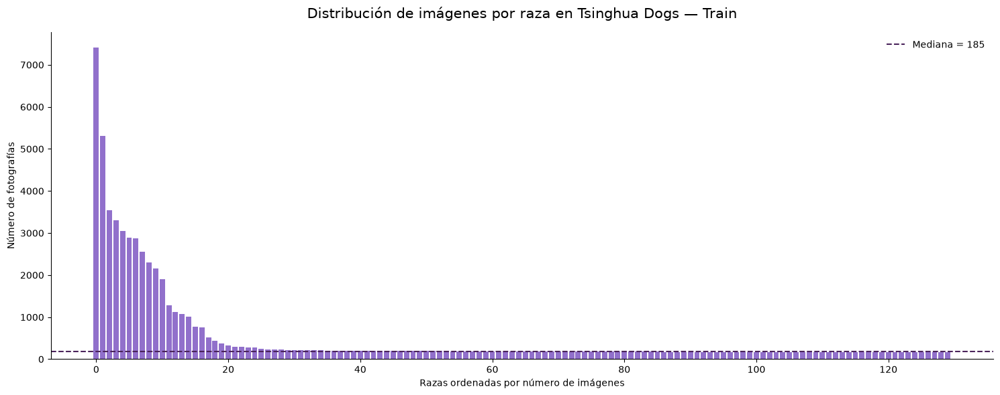

In [13]:
# Distribución del número de imágenes por raza en entrenamiento

distribucion_plot = (
    distribucion_razas_tsinghua
    .sort_values(
        "n_train",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)


fig, ax = plt.subplots(
    figsize=(15, 6)
)


ax.bar(
    np.arange(
        len(
            distribucion_plot
        )
    ),
    distribucion_plot[
        "n_train"
    ],
    color="#7E57C2",
    alpha=0.85
)


ax.axhline(
    distribucion_plot[
        "n_train"
    ].median(),
    color="#4A235A",
    linestyle="--",
    linewidth=1.5,
    label=(
        "Mediana = "
        f"{distribucion_plot['n_train'].median():.0f}"
    )
)


ax.set_title(
    "Distribución de imágenes por raza "
    "en Tsinghua Dogs — Train",
    fontsize=15,
    pad=15
)


ax.set_xlabel(
    "Razas ordenadas por número de imágenes"
)

ax.set_ylabel(
    "Número de fotografías"
)


ax.legend(
    frameon=False
)


ax.spines[
    "top"
].set_visible(
    False
)

ax.spines[
    "right"
].set_visible(
    False
)


plt.tight_layout()

plt.show()

### 2.3. Desequilibrio del conjunto de entrenamiento

La distribución del conjunto de entrenamiento evidencia una marcada concentración de fotografías en un número reducido de razas. Mientras que algunas categorías disponen de varios miles de imágenes, una gran parte de las razas se sitúa próxima al mínimo disponible, con una mediana de 185 fotografías.

Entre las categorías más representadas destacan Yorkshire Terrier, Golden Retriever y Labrador Retriever, con 7.409, 5.315 y 3.540 fotografías de entrenamiento, respectivamente.

Este desequilibrio justifica que la construcción posterior de los prototipos visuales por raza no se realice utilizando directamente todas las observaciones disponibles. Se empleará una estrategia equilibrada en la que cada raza contribuya con el mismo número de fotografías, evitando que las categorías con mayor representación condicionen de forma desproporcionada el espacio visual.

El conjunto de validación, por el contrario, mantiene exactamente 40 fotografías por cada una de las 130 razas, proporcionando una referencia equilibrada para evaluar posteriormente la capacidad de recuperación y discriminación de las representaciones visuales.

## 3. Exploración visual de Tsinghua Dogs

Antes de extraer representaciones mediante modelos preentrenados, se realiza una inspección visual del conjunto de datos.

Para esta exploración se utiliza inicialmente el conjunto de validación. Además de presentar un tamaño considerablemente menor que el conjunto de entrenamiento, contiene exactamente 40 fotografías de cada una de las 130 razas, por lo que permite observar de forma equilibrada la diversidad visual del dataset.

Esta revisión tiene como objetivo comprobar la calidad y variabilidad de las fotografías, identificar diferencias de pose, fondo, encuadre y condiciones de captura, y disponer de ejemplos representativos de algunas de las razas que posteriormente podrán emplearse en la funcionalidad de búsqueda visual de *Invisible Dogs*.

In [14]:
# Carga del conjunto de validación con imágenes

schema_tsinghua_visual = pa.schema([
    pa.field(
        "image",
        pa.struct([
            pa.field(
                "bytes",
                pa.binary()
            ),
            pa.field(
                "path",
                pa.string()
            )
        ])
    ),
    pa.field(
        "label",
        pa.int64()
    )
])


archivo_validacion_tsinghua = (
    archivos_valid_tsinghua[0]
)


tabla_valid_tsinghua = pq.read_table(
    archivo_validacion_tsinghua,
    columns=[
        "image",
        "label"
    ],
    schema=schema_tsinghua_visual,
    arrow_extensions_enabled=False
)


print(
    "Fotografías cargadas:"
)

print(
    tabla_valid_tsinghua.num_rows
)


print(
    "\nColumnas:"
)

print(
    tabla_valid_tsinghua.column_names
)


print(
    "\nTamaño aproximado en memoria:"
)

print(
    f"{tabla_valid_tsinghua.nbytes / 1024**2:.2f} MB"
)

Fotografías cargadas:
5200

Columnas:
['image', 'label']

Tamaño aproximado en memoria:
187.17 MB


In [15]:
# Función para recuperar una fotografía desde la tabla Arrow

from io import BytesIO


def obtener_imagen_tsinghua(
    tabla,
    indice
):

    registro_imagen = (
        tabla[
            "image"
        ][
            indice
        ]
        .as_py()
    )


    bytes_imagen = (
        registro_imagen.get(
            "bytes"
        )
    )


    ruta_imagen = (
        registro_imagen.get(
            "path"
        )
    )


    if bytes_imagen is not None:

        imagen = Image.open(
            BytesIO(
                bytes_imagen
            )
        )

        return imagen.convert(
            "RGB"
        )


    if ruta_imagen is not None:

        ruta = Path(
            ruta_imagen
        )

        if ruta.exists():

            return Image.open(
                ruta
            ).convert(
                "RGB"
            )


    raise ValueError(
        f"No se ha podido recuperar la imagen "
        f"del índice {indice}."
    )

Etiqueta: 0
Raza: Shiba Dog
Dimensiones: (540, 540)


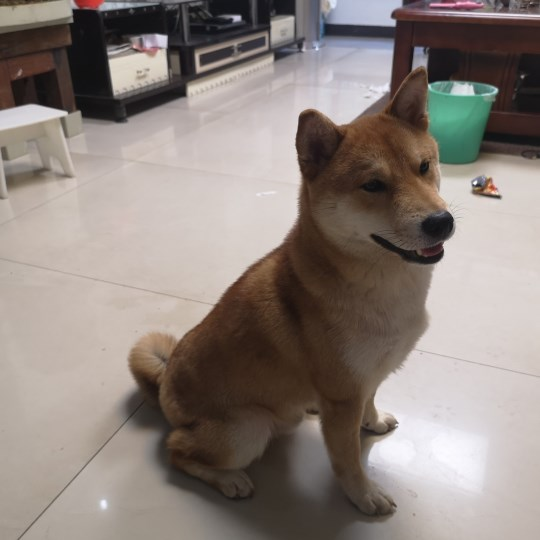

In [16]:
# Comprobación de una fotografía

indice_ejemplo = 0


imagen_ejemplo = obtener_imagen_tsinghua(
    tabla_valid_tsinghua,
    indice_ejemplo
)


label_ejemplo = int(
    tabla_valid_tsinghua[
        "label"
    ][
        indice_ejemplo
    ]
    .as_py()
)


raza_ejemplo = (
    razas_tsinghua_df
    .loc[
        razas_tsinghua_df[
            "label"
        ] == label_ejemplo,
        "raza_display"
    ]
    .iloc[0]
)


print(
    "Etiqueta:",
    label_ejemplo
)

print(
    "Raza:",
    raza_ejemplo
)

print(
    "Dimensiones:",
    imagen_ejemplo.size
)


display(
    imagen_ejemplo
)

### 3.1. Inspección de diferentes razas

Se visualiza una selección de fotografías pertenecientes a diferentes razas con el objetivo de comprobar la diversidad visual presente en Tsinghua Dogs.

Se incluyen razas con características morfológicas diferentes y algunas especialmente relevantes para la futura funcionalidad de búsqueda visual de *Invisible Dogs*, como Labrador Retriever, Golden Retriever, Shiba Dog o Beagle.

Para cada raza se muestran distintas fotografías del conjunto de validación. Esto permite observar la variabilidad existente dentro de una misma categoría en términos de postura, encuadre, iluminación y fondo, aspecto especialmente relevante para la posterior construcción de representaciones visuales prototipo.

In [17]:
# Preparación de etiquetas del conjunto de validación

labels_valid_array = np.array(
    tabla_valid_tsinghua[
        "label"
    ].to_pylist(),
    dtype=np.int64
)


# Diccionario nombre de raza -> label

raza_a_label_tsinghua = dict(
    zip(
        razas_tsinghua_df[
            "raza_display"
        ],
        razas_tsinghua_df[
            "label"
        ]
    )
)


# Razas seleccionadas para la inspección visual

razas_ejemplo = [
    "Shiba Dog",
    "Labrador Retriever",
    "Golden Retriever",
    "Beagle",
    "Siberian Husky",
    "French Bulldog",
    "Border Collie",
    "Pug"
]


print(
    "Razas seleccionadas:"
)

for raza in razas_ejemplo:

    print(
        f"- {raza}: "
        f"label {raza_a_label_tsinghua.get(raza)}"
    )

Razas seleccionadas:
- Shiba Dog: label 0
- Labrador Retriever: label 121
- Golden Retriever: label 125
- Beagle: label 111
- Siberian Husky: label 2
- French Bulldog: label 1
- Border Collie: label 108
- Pug: label 128


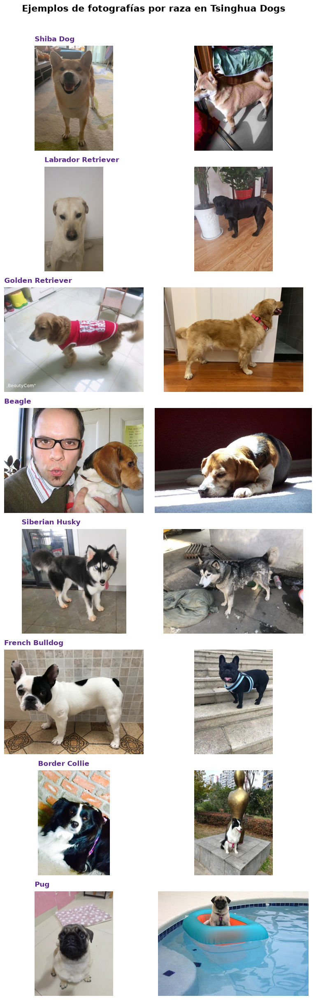

In [18]:
# Visualización de ejemplos de diferentes razas

rng_visual = np.random.default_rng(
    RANDOM_STATE
)


n_imagenes_por_raza = 2


fig, axes = plt.subplots(
    nrows=len(razas_ejemplo),
    ncols=n_imagenes_por_raza,
    figsize=(8, 24)
)


for fila, raza in enumerate(
    razas_ejemplo
):

    label_raza = (
        raza_a_label_tsinghua[
            raza
        ]
    )


    indices_raza = np.where(
        labels_valid_array
        == label_raza
    )[0]


    indices_seleccionados = (
        rng_visual.choice(
            indices_raza,
            size=n_imagenes_por_raza,
            replace=False
        )
    )


    for columna, indice in enumerate(
        indices_seleccionados
    ):

        imagen = obtener_imagen_tsinghua(
            tabla_valid_tsinghua,
            int(indice)
        )


        ax = axes[
            fila,
            columna
        ]


        ax.imshow(
            imagen
        )


        ax.axis(
            "off"
        )


        if columna == 0:

            ax.set_title(
                raza,
                fontsize=12,
                fontweight="bold",
                color="#5B2A86",
                loc="left",
                pad=8
            )


plt.suptitle(
    "Ejemplos de fotografías por raza en Tsinghua Dogs",
    fontsize=16,
    fontweight="bold",
    y=1.01
)


plt.tight_layout()

plt.show()

La inspección visual confirma que las fotografías de Tsinghua Dogs presentan una elevada diversidad incluso dentro de una misma raza. Los perros aparecen en diferentes posiciones, escalas y orientaciones, así como en escenarios interiores y exteriores y bajo distintas condiciones de iluminación.

También se observa cierta heterogeneidad en la composición de las fotografías. Algunas imágenes incluyen personas, elementos de fondo destacados o marcas gráficas, lo que evidencia que una única fotografía no constituye necesariamente una representación visual adecuada de una raza.

Esta variabilidad resulta especialmente relevante para el objetivo del presente análisis. La construcción de una representación de raza a partir de múltiples fotografías permite reducir la dependencia respecto a las características particulares de una única imagen y obtener una referencia visual más robusta para la posterior recuperación de perros similares.

De cara a la futura aplicación *Invisible Dogs*, las fotografías utilizadas como referencia visual de cada raza no se seleccionarán únicamente de forma manual. Una vez obtenidos los embeddings, se identificarán imágenes próximas al prototipo visual de cada raza y, entre ellas, podrán priorizarse aquellas con una composición más adecuada para su presentación al usuario.

## 4. Construcción de un conjunto de entrenamiento equilibrado

El conjunto de entrenamiento original presenta una marcada desigualdad en el número de fotografías disponibles para cada raza. Esta característica puede afectar a análisis globales del espacio de embeddings y supone además un incremento innecesario del coste computacional.

Dado que todas las razas disponen de al menos 160 fotografías de entrenamiento, se construye un subconjunto equilibrado seleccionando aleatoriamente **160 imágenes por raza**. De esta forma se obtiene un conjunto de **20.800 fotografías**, manteniendo la representación de las 130 categorías.

La selección se realiza de forma reproducible utilizando la semilla establecida para el proyecto.

El conjunto de validación no se modifica. Sus 5.200 fotografías —40 por cada raza— se mantendrán completamente independientes y se utilizarán posteriormente para evaluar la capacidad de los prototipos visuales construidos exclusivamente a partir de entrenamiento.

In [19]:
# Construcción del índice de fotografías de entrenamiento

indices_train_tsinghua = []


for archivo in archivos_train_tsinghua:

    labels_archivo = cargar_labels_parquet(
        archivo
    )

    indice_archivo = pd.DataFrame({
        "archivo": archivo.name,
        "indice_local": np.arange(
            len(labels_archivo),
            dtype=np.int64
        ),
        "label": labels_archivo[
            "label"
        ].astype(
            np.int64
        )
    })

    indices_train_tsinghua.append(
        indice_archivo
    )


indice_train_tsinghua_df = pd.concat(
    indices_train_tsinghua,
    ignore_index=True
)


indice_train_tsinghua_df = (
    indice_train_tsinghua_df
    .merge(
        razas_tsinghua_df[
            [
                "label",
                "raza_display"
            ]
        ],
        on="label",
        how="left",
        validate="many_to_one"
    )
)


print(
    "Fotografías indexadas:"
)

print(
    len(
        indice_train_tsinghua_df
    )
)


print(
    "\nRazas:"
)

print(
    indice_train_tsinghua_df[
        "label"
    ].nunique()
)


print(
    "\nPrimeras filas:"
)

display(
    indice_train_tsinghua_df
    .head()
)

Fotografías indexadas:
65228

Razas:
130

Primeras filas:


,archivo,indice_local,label,raza_display
0,train-00000-of-00006.parquet,0,0,Shiba Dog
1,train-00000-of-00006.parquet,1,0,Shiba Dog
2,train-00000-of-00006.parquet,2,0,Shiba Dog
3,train-00000-of-00006.parquet,3,0,Shiba Dog
4,train-00000-of-00006.parquet,4,0,Shiba Dog


In [20]:
# Selección equilibrada de fotografías de entrenamiento

N_TRAIN_POR_RAZA = 160


train_balanceado_tsinghua_df = (
    indice_train_tsinghua_df
    .groupby(
        "label",
        group_keys=False
    )
    .sample(
        n=N_TRAIN_POR_RAZA,
        random_state=RANDOM_STATE
    )
    .sort_values(
        [
            "label",
            "archivo",
            "indice_local"
        ]
    )
    .reset_index(
        drop=True
    )
)


print(
    "Fotografías seleccionadas:"
)

print(
    len(
        train_balanceado_tsinghua_df
    )
)


print(
    "\nNúmero de razas:"
)

print(
    train_balanceado_tsinghua_df[
        "label"
    ].nunique()
)


conteo_balanceado = (
    train_balanceado_tsinghua_df[
        "label"
    ]
    .value_counts()
)


print(
    "\nMínimo de imágenes por raza:"
)

print(
    conteo_balanceado.min()
)


print(
    "\nMáximo de imágenes por raza:"
)

print(
    conteo_balanceado.max()
)


print(
    "\n¿Todas las razas tienen "
    "la misma representación?"
)

print(
    conteo_balanceado.nunique() == 1
)

Fotografías seleccionadas:
20800

Número de razas:
130

Mínimo de imágenes por raza:
160

Máximo de imágenes por raza:
160

¿Todas las razas tienen la misma representación?
True


In [21]:
# Construcción del índice del conjunto de validación

indice_valid_tsinghua_df = pd.DataFrame({
    "archivo": (
        archivo_validacion_tsinghua.name
    ),

    "indice_local": np.arange(
        tabla_valid_tsinghua.num_rows,
        dtype=np.int64
    ),

    "label": labels_valid_array
})


indice_valid_tsinghua_df = (
    indice_valid_tsinghua_df
    .merge(
        razas_tsinghua_df[
            [
                "label",
                "raza_display"
            ]
        ],
        on="label",
        how="left",
        validate="many_to_one"
    )
)


print(
    "Fotografías de validación indexadas:"
)

print(
    len(
        indice_valid_tsinghua_df
    )
)


print(
    "\nNúmero de razas:"
)

print(
    indice_valid_tsinghua_df[
        "label"
    ].nunique()
)


conteo_valid_index = (
    indice_valid_tsinghua_df[
        "label"
    ]
    .value_counts()
)


print(
    "\nMínimo de imágenes por raza:"
)

print(
    conteo_valid_index.min()
)


print(
    "\nMáximo de imágenes por raza:"
)

print(
    conteo_valid_index.max()
)


print(
    "\n¿Validation está equilibrado?"
)

print(
    conteo_valid_index.nunique() == 1
)


print(
    "\nPrimeras filas:"
)

display(
    indice_valid_tsinghua_df
    .head()
)

Fotografías de validación indexadas:
5200

Número de razas:
130

Mínimo de imágenes por raza:
40

Máximo de imágenes por raza:
40

¿Validation está equilibrado?
True

Primeras filas:


,archivo,indice_local,label,raza_display
0,validation-00000-of-00001.parquet,0,0,Shiba Dog
1,validation-00000-of-00001.parquet,1,0,Shiba Dog
2,validation-00000-of-00001.parquet,2,0,Shiba Dog
3,validation-00000-of-00001.parquet,3,0,Shiba Dog
4,validation-00000-of-00001.parquet,4,0,Shiba Dog


In [22]:
# Comprobación de independencia entre las particiones

archivos_train_utilizados = set(
    train_balanceado_tsinghua_df[
        "archivo"
    ].unique()
)


archivos_valid_utilizados = set(
    indice_valid_tsinghua_df[
        "archivo"
    ].unique()
)


solapamiento_archivos = (
    archivos_train_utilizados
    .intersection(
        archivos_valid_utilizados
    )
)


print(
    "Archivos utilizados en train:"
)

print(
    len(
        archivos_train_utilizados
    )
)


print(
    "\nArchivos utilizados en validation:"
)

print(
    len(
        archivos_valid_utilizados
    )
)


print(
    "\nArchivos compartidos entre "
    "train y validation:"
)

print(
    len(
        solapamiento_archivos
    )
)


print(
    "\nSeparación correcta:"
)

print(
    len(
        solapamiento_archivos
    ) == 0
)


print(
    "\nFotografías destinadas "
    "a construir prototipos:"
)

print(
    len(
        train_balanceado_tsinghua_df
    )
)


print(
    "\nFotografías reservadas "
    "para evaluación:"
)

print(
    len(
        indice_valid_tsinghua_df
    )
)

Archivos utilizados en train:
6

Archivos utilizados en validation:
1

Archivos compartidos entre train y validation:
0

Separación correcta:
True

Fotografías destinadas a construir prototipos:
20800

Fotografías reservadas para evaluación:
5200


### 4.1. Separación entre construcción y evaluación

La selección equilibrada de entrenamiento contiene 20.800 fotografías, correspondientes a 160 imágenes de cada una de las 130 razas. Estas observaciones se utilizarán exclusivamente para construir las representaciones prototipo de cada categoría.

Por otra parte, las 5.200 fotografías del conjunto de validación permanecen completamente independientes y conservan una distribución equilibrada de 40 imágenes por raza.

Esta separación permite evaluar posteriormente si una fotografía no utilizada durante la construcción de los prototipos se sitúa próxima a la representación correspondiente a su verdadera raza. De esta forma, la evaluación de la búsqueda visual se realiza sobre observaciones independientes y no sobre las mismas imágenes empleadas para definir las referencias de cada categoría.

In [23]:
# Guardado reproducible de los índices de entrenamiento y validación

train_balanceado_index_path = (
    tsinghua_outputs_path
    / "tsinghua_train_balanceado_index.csv"
)

valid_index_path = (
    tsinghua_outputs_path
    / "tsinghua_validation_index.csv"
)


train_balanceado_tsinghua_df.to_csv(
    train_balanceado_index_path,
    index=False,
    encoding="utf-8-sig"
)

indice_valid_tsinghua_df.to_csv(
    valid_index_path,
    index=False,
    encoding="utf-8-sig"
)


print("Índice equilibrado de entrenamiento guardado en:")
print(train_balanceado_index_path)

print("\nÍndice de validación guardado en:")
print(valid_index_path)

print("\nTamaños:")
print(
    "Train:",
    f"{train_balanceado_index_path.stat().st_size / 1024**2:.2f} MB"
)
print(
    "Validation:",
    f"{valid_index_path.stat().st_size / 1024**2:.2f} MB"
)

Índice equilibrado de entrenamiento guardado en:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\tsinghua_visual\tsinghua_train_balanceado_index.csv

Índice de validación guardado en:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\tsinghua_visual\tsinghua_validation_index.csv

Tamaños:
Train: 1.04 MB
Validation: 0.28 MB


In [24]:
# Función común para validar y reutilizar cachés de embeddings

def cargar_cache_embeddings_si_valida(
    ruta_cache,
    indice_esperado,
    dimension_esperada,
    modelo_esperado,
    nombre_cache
):
    """Carga una caché solo si coincide exactamente con el índice actual."""

    if RECALCULAR_ARTEFACTOS or not ruta_cache.exists():
        return None

    claves_obligatorias = {
        "embeddings",
        "label",
        "indice_local",
        "archivo",
        "model_name"
    }

    try:
        with np.load(
            ruta_cache,
            allow_pickle=False
        ) as datos:

            claves_disponibles = set(
                datos.files
            )

            if not claves_obligatorias.issubset(
                claves_disponibles
            ):
                faltantes = sorted(
                    claves_obligatorias
                    - claves_disponibles
                )
                raise ValueError(
                    f"faltan claves: {faltantes}"
                )

            embeddings = (
                datos["embeddings"]
                .astype(np.float32)
            )

            labels = (
                datos["label"]
                .astype(np.int64)
            )

            indices_locales = (
                datos["indice_local"]
                .astype(np.int64)
            )

            archivos = (
                datos["archivo"]
                .astype(str)
            )

            modelo_cache = str(
                np.asarray(
                    datos["model_name"]
                ).reshape(-1)[0]
            )

        labels_esperados = (
            indice_esperado["label"]
            .to_numpy(dtype=np.int64)
        )

        indices_esperados = (
            indice_esperado["indice_local"]
            .to_numpy(dtype=np.int64)
        )

        archivos_esperados = (
            indice_esperado["archivo"]
            .astype(str)
            .to_numpy()
        )

        comprobaciones = [
            (
                embeddings.ndim == 2
                and embeddings.shape == (
                    len(indice_esperado),
                    dimension_esperada
                ),
                "forma de embeddings"
            ),
            (
                np.array_equal(
                    labels,
                    labels_esperados
                ),
                "labels"
            ),
            (
                np.array_equal(
                    indices_locales,
                    indices_esperados
                ),
                "índices locales"
            ),
            (
                np.array_equal(
                    archivos,
                    archivos_esperados
                ),
                "archivos"
            ),
            (
                modelo_cache
                == str(modelo_esperado),
                "modelo preentrenado"
            )
        ]

        incompatibilidades = [
            nombre
            for condicion, nombre
            in comprobaciones
            if not condicion
        ]

        if len(incompatibilidades) > 0:
            raise ValueError(
                "no coinciden: "
                + ", ".join(
                    incompatibilidades
                )
            )

        print(
            f"Caché validada: {nombre_cache}."
        )

        return {
            "embeddings": embeddings,
            "label": labels,
            "indice_local": indices_locales,
            "archivo": archivos,
            "model_name": modelo_cache
        }

    except Exception as exc:
        print(
            f"La caché '{nombre_cache}' no es compatible "
            f"con el índice actual ({exc})."
        )
        print(
            "Se recalcularán los embeddings."
        )
        return None

## 5. Representaciones visuales con CLIP

Para representar visualmente las fotografías se utiliza inicialmente **CLIP**, un modelo preentrenado capaz de proyectar imágenes en un espacio vectorial donde fotografías con contenido semánticamente relacionado tienden a presentar representaciones próximas.

Este enfoque resulta especialmente adecuado para la futura funcionalidad de búsqueda de *Invisible Dogs*, ya que permite comparar fotografías mediante similitud entre embeddings sin necesidad de entrenar desde cero un clasificador específico para cada raza.

Antes de realizar la extracción completa se comprueba el dispositivo de cálculo disponible y se realiza una prueba sobre un subconjunto reducido de fotografías. Esta evaluación permite seleccionar un tamaño de lote adecuado antes de procesar el conjunto completo.

In [25]:
# Carga de CLIP

import torch

from transformers import (
    CLIPImageProcessor,
    CLIPVisionModelWithProjection
)
from transformers.utils import logging as hf_logging


device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)


CLIP_MODEL_NAME = (
    "openai/clip-vit-base-patch32"
)


dtype_clip = (
    torch.float16
    if device.type == "cuda"
    else torch.float32
)


# Se silencian únicamente los mensajes de carga de Transformers
# que no afectan al análisis (por ejemplo, pesos del encoder de texto
# no utilizados por CLIPVisionModelWithProjection).
verbosity_hf_original = hf_logging.get_verbosity()
hf_logging.set_verbosity_error()

try:
    processor_clip = (
        CLIPImageProcessor
        .from_pretrained(
            CLIP_MODEL_NAME
        )
    )

    modelo_clip = (
        CLIPVisionModelWithProjection
        .from_pretrained(
            CLIP_MODEL_NAME
        )
        .to(
            device=device,
            dtype=dtype_clip
        )
    )
finally:
    hf_logging.set_verbosity(
        verbosity_hf_original
    )


modelo_clip.eval()


print("Dispositivo:")
print(device)

if device.type == "cuda":
    print("\nGPU:")
    print(
        torch.cuda.get_device_name(0)
    )

print("\nModelo CLIP:")
print(CLIP_MODEL_NAME)

print("\nTipo numérico:")
print(dtype_clip)

c:\Users\isaa-\venvs\invisible-dogs-dl\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Dispositivo:
cuda

GPU:
NVIDIA GeForce GTX 1650

Modelo CLIP:
openai/clip-vit-base-patch32

Tipo numérico:
torch.float16


In [26]:
# Selección de fotografías para la prueba de velocidad

N_BENCHMARK_CLIP = 100


rng_benchmark_clip = (
    np.random.default_rng(
        RANDOM_STATE
    )
)


indices_benchmark_clip = (
    rng_benchmark_clip.choice(
        tabla_valid_tsinghua.num_rows,
        size=N_BENCHMARK_CLIP,
        replace=False
    )
)


imagenes_benchmark_clip = [
    obtener_imagen_tsinghua(
        tabla_valid_tsinghua,
        int(indice)
    )
    for indice
    in indices_benchmark_clip
]


print(
    "Fotografías preparadas:"
)

print(
    len(
        imagenes_benchmark_clip
    )
)


print(
    "\nEjemplo de dimensiones:"
)

print(
    imagenes_benchmark_clip[
        0
    ].size
)

Fotografías preparadas:
100

Ejemplo de dimensiones:
(500, 375)


In [27]:
# Función para extraer embeddings CLIP

def extraer_embeddings_clip(
    imagenes,
    batch_size=32
):

    embeddings_batches = []


    for inicio in range(
        0,
        len(imagenes),
        batch_size
    ):

        batch_imagenes = (
            imagenes[
                inicio:
                inicio + batch_size
            ]
        )


        inputs = processor_clip(
            images=batch_imagenes,
            return_tensors="pt"
        )


        pixel_values = (
            inputs[
                "pixel_values"
            ]
            .to(
                device=device,
                dtype=dtype_clip
            )
        )


        with torch.inference_mode():

            outputs = modelo_clip(
                pixel_values=pixel_values
            )


            embeddings = (
                outputs.image_embeds
            )


            embeddings = torch.nn.functional.normalize(
                embeddings,
                p=2,
                dim=1
            )


        embeddings_batches.append(
            embeddings
            .float()
            .cpu()
            .numpy()
        )


    return np.vstack(
        embeddings_batches
    )

In [28]:
# Benchmark de diferentes tamaños de lote

import time


batch_sizes_clip = [
    1,
    4,
    8,
    16,
    32
]


resultados_benchmark_clip = []


# Warm-up de GPU

if device.type == "cuda":

    _ = extraer_embeddings_clip(
        imagenes_benchmark_clip[
            :8
        ],
        batch_size=8
    )

    torch.cuda.synchronize()


for batch_size in batch_sizes_clip:

    if device.type == "cuda":

        torch.cuda.empty_cache()
        torch.cuda.synchronize()


    inicio = time.perf_counter()


    embeddings_prueba = (
        extraer_embeddings_clip(
            imagenes_benchmark_clip,
            batch_size=batch_size
        )
    )


    if device.type == "cuda":

        torch.cuda.synchronize()


    tiempo = (
        time.perf_counter()
        - inicio
    )


    resultados_benchmark_clip.append({
        "batch_size": batch_size,
        "tiempo_segundos": tiempo,
        "imagenes_segundo": (
            N_BENCHMARK_CLIP
            / tiempo
        )
    })


benchmark_clip_df = pd.DataFrame(
    resultados_benchmark_clip
)


print(
    "Benchmark CLIP:"
)

display(
    benchmark_clip_df
    .round({
        "tiempo_segundos": 3,
        "imagenes_segundo": 2
    })
)


print(
    "\nDimensión del embedding:"
)

print(
    embeddings_prueba.shape[
        1
    ]
)

Benchmark CLIP:


,batch_size,tiempo_segundos,imagenes_segundo
0,1,4.342,23.03
1,4,3.998,25.01
2,8,3.585,27.89
3,16,3.120,32.06
4,32,3.084,32.43



Dimensión del embedding:
512


In [29]:
# Comprobaciones básicas de los embeddings

normas_clip = np.linalg.norm(
    embeddings_prueba,
    axis=1
)


print(
    "Forma:"
)

print(
    embeddings_prueba.shape
)


print(
    "\n¿Contiene NaN?:"
)

print(
    np.isnan(
        embeddings_prueba
    ).any()
)


print(
    "\n¿Contiene infinitos?:"
)

print(
    np.isinf(
        embeddings_prueba
    ).any()
)


print(
    "\nNorma media:"
)

print(
    round(
        float(
            normas_clip.mean()
        ),
        4
    )
)


print(
    "\nNorma mínima:"
)

print(
    round(
        float(
            normas_clip.min()
        ),
        4
    )
)


print(
    "\nNorma máxima:"
)

print(
    round(
        float(
            normas_clip.max()
        ),
        4
    )
)

Forma:
(100, 512)

¿Contiene NaN?:
False

¿Contiene infinitos?:
False

Norma media:
1.0

Norma mínima:
0.9995

Norma máxima:
1.0005


### 5.1. Selección del tamaño de lote

La prueba de rendimiento confirma el correcto funcionamiento de CLIP sobre GPU y la generación de embeddings de 512 dimensiones normalizados mediante norma L2.

Entre los tamaños de lote evaluados, los valores de 16 y 32 presentan el mayor rendimiento, alcanzando aproximadamente 32 fotografías procesadas por segundo. Dado que el tamaño de lote 32 proporciona el mejor resultado sin generar problemas de memoria, se adopta este valor para la extracción completa.

Las representaciones obtenidas no presentan valores ausentes ni infinitos y mantienen una norma próxima a uno, permitiendo utilizar posteriormente el producto escalar entre embeddings como medida de similitud coseno.

In [30]:
# Configuración de la extracción completa de CLIP

BATCH_SIZE_CLIP = 32


clip_train_embeddings_path = (
    tsinghua_outputs_path
    / "tsinghua_clip_train_embeddings.npz"
)


clip_valid_embeddings_path = (
    tsinghua_outputs_path
    / "tsinghua_clip_validation_embeddings.npz"
)


DIMENSION_CLIP = int(
    embeddings_prueba.shape[1]
)


print(
    "Batch seleccionado:"
)

print(
    BATCH_SIZE_CLIP
)


print(
    "\nDimensión CLIP:"
)

print(
    DIMENSION_CLIP
)


print(
    "\nEmbeddings de entrenamiento:"
)

print(
    clip_train_embeddings_path
)


print(
    "\nEmbeddings de validación:"
)

print(
    clip_valid_embeddings_path
)

Batch seleccionado:
32

Dimensión CLIP:
512

Embeddings de entrenamiento:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\tsinghua_visual\tsinghua_clip_train_embeddings.npz

Embeddings de validación:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\tsinghua_visual\tsinghua_clip_validation_embeddings.npz


In [31]:
# Extracción por lotes desde una tabla Arrow

def extraer_clip_desde_tabla(
    tabla,
    indices,
    batch_size=32,
    mostrar_progreso=True
):

    indices = np.asarray(
        indices,
        dtype=np.int64
    )


    embeddings_salida = np.empty(
        (
            len(indices),
            DIMENSION_CLIP
        ),
        dtype=np.float32
    )


    for inicio in range(
        0,
        len(indices),
        batch_size
    ):

        fin = min(
            inicio + batch_size,
            len(indices)
        )


        indices_batch = (
            indices[
                inicio:fin
            ]
        )


        imagenes_batch = [
            obtener_imagen_tsinghua(
                tabla,
                int(indice)
            )
            for indice
            in indices_batch
        ]


        embeddings_batch = (
            extraer_embeddings_clip(
                imagenes_batch,
                batch_size=batch_size
            )
        )


        embeddings_salida[
            inicio:fin
        ] = embeddings_batch


        del imagenes_batch
        del embeddings_batch


        if (
            mostrar_progreso
            and (
                fin % 1000 == 0
                or fin == len(indices)
            )
        ):

            print(
                f"Procesadas: "
                f"{fin}/{len(indices)}"
            )


    return embeddings_salida

In [32]:
# Extracción de embeddings CLIP del train equilibrado

import gc


cache_clip_train = cargar_cache_embeddings_si_valida(
    ruta_cache=clip_train_embeddings_path,
    indice_esperado=train_balanceado_tsinghua_df,
    dimension_esperada=DIMENSION_CLIP,
    modelo_esperado=CLIP_MODEL_NAME,
    nombre_cache="CLIP train"
)


if cache_clip_train is not None:

    embeddings_clip_train = (
        cache_clip_train["embeddings"]
    )

    labels_clip_train = (
        cache_clip_train["label"]
    )

    indices_clip_train = (
        cache_clip_train["indice_local"]
    )

    archivos_clip_train = (
        cache_clip_train["archivo"]
    )

    print(
        "Embeddings CLIP de entrenamiento "
        "cargados desde archivo existente."
    )

else:

    embeddings_clip_train = np.empty(
        (
            len(train_balanceado_tsinghua_df),
            DIMENSION_CLIP
        ),
        dtype=np.float32
    )

    inicio_clip_train = time.perf_counter()

    for numero_archivo, archivo in enumerate(
        archivos_train_tsinghua,
        start=1
    ):

        seleccion_archivo = (
            train_balanceado_tsinghua_df[
                train_balanceado_tsinghua_df[
                    "archivo"
                ] == archivo.name
            ]
        )

        if len(seleccion_archivo) == 0:
            continue

        print(
            f"\nArchivo {numero_archivo}/"
            f"{len(archivos_train_tsinghua)}:"
        )
        print(archivo.name)
        print(
            "Fotografías seleccionadas:",
            len(seleccion_archivo)
        )

        tabla_archivo = pq.read_table(
            archivo,
            columns=["image", "label"],
            schema=schema_tsinghua_visual,
            arrow_extensions_enabled=False
        )

        posiciones_salida = (
            seleccion_archivo.index
            .to_numpy(dtype=np.int64)
        )

        indices_locales = (
            seleccion_archivo["indice_local"]
            .to_numpy(dtype=np.int64)
        )

        labels_esperados = (
            seleccion_archivo["label"]
            .to_numpy(dtype=np.int64)
        )

        labels_archivo = np.asarray(
            tabla_archivo["label"].to_pylist(),
            dtype=np.int64
        )

        if not np.array_equal(
            labels_archivo[indices_locales],
            labels_esperados
        ):
            raise ValueError(
                "Las etiquetas del índice no coinciden "
                f"con el archivo {archivo.name}."
            )

        embeddings_archivo = extraer_clip_desde_tabla(
            tabla=tabla_archivo,
            indices=indices_locales,
            batch_size=BATCH_SIZE_CLIP
        )

        embeddings_clip_train[
            posiciones_salida
        ] = embeddings_archivo

        del embeddings_archivo
        del labels_archivo
        del tabla_archivo

        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    tiempo_clip_train = (
        time.perf_counter()
        - inicio_clip_train
    )

    labels_clip_train = (
        train_balanceado_tsinghua_df["label"]
        .to_numpy(dtype=np.int64)
    )

    indices_clip_train = (
        train_balanceado_tsinghua_df["indice_local"]
        .to_numpy(dtype=np.int64)
    )

    archivos_clip_train = (
        train_balanceado_tsinghua_df["archivo"]
        .astype(str)
        .to_numpy()
    )

    np.savez_compressed(
        clip_train_embeddings_path,
        embeddings=embeddings_clip_train,
        label=labels_clip_train,
        indice_local=indices_clip_train,
        archivo=archivos_clip_train,
        model_name=np.asarray([CLIP_MODEL_NAME])
    )

    print(
        "\nExtracción CLIP de entrenamiento finalizada."
    )
    print("\nTiempo total:")
    print(
        f"{tiempo_clip_train / 60:.2f} minutos"
    )

La caché 'CLIP train' no es compatible con el índice actual (faltan claves: ['model_name']).
Se recalcularán los embeddings.

Archivo 1/6:
train-00000-of-00006.parquet
Fotografías seleccionadas: 5162
Procesadas: 4000/5162
Procesadas: 5162/5162

Archivo 2/6:
train-00001-of-00006.parquet
Fotografías seleccionadas: 7959
Procesadas: 4000/7959
Procesadas: 7959/7959

Archivo 3/6:
train-00002-of-00006.parquet
Fotografías seleccionadas: 4962
Procesadas: 4000/4962
Procesadas: 4962/4962

Archivo 4/6:
train-00003-of-00006.parquet
Fotografías seleccionadas: 1019
Procesadas: 1019/1019

Archivo 5/6:
train-00004-of-00006.parquet
Fotografías seleccionadas: 1018
Procesadas: 1018/1018

Archivo 6/6:
train-00005-of-00006.parquet
Fotografías seleccionadas: 680
Procesadas: 680/680

Extracción CLIP de entrenamiento finalizada.

Tiempo total:
11.01 minutos


In [33]:
# Validación de los embeddings CLIP de entrenamiento

normas_clip_train = np.linalg.norm(
    embeddings_clip_train,
    axis=1
)


print(
    "Forma:"
)

print(
    embeddings_clip_train.shape
)


print(
    "\n¿Contiene NaN?:"
)

print(
    np.isnan(
        embeddings_clip_train
    ).any()
)


print(
    "\n¿Contiene infinitos?:"
)

print(
    np.isinf(
        embeddings_clip_train
    ).any()
)


print(
    "\nNorma media:"
)

print(
    round(
        float(
            normas_clip_train.mean()
        ),
        4
    )
)


print(
    "\nNorma mínima:"
)

print(
    round(
        float(
            normas_clip_train.min()
        ),
        4
    )
)


print(
    "\nNorma máxima:"
)

print(
    round(
        float(
            normas_clip_train.max()
        ),
        4
    )
)


print(
    "\nTamaño del archivo:"
)

print(
    f"{clip_train_embeddings_path.stat().st_size / 1024**2:.2f} MB"
)

Forma:
(20800, 512)

¿Contiene NaN?:
False

¿Contiene infinitos?:
False

Norma media:
1.0

Norma mínima:
0.9995

Norma máxima:
1.0005

Tamaño del archivo:
24.08 MB


In [34]:
# Extracción de embeddings CLIP del conjunto de validación

cache_clip_valid = cargar_cache_embeddings_si_valida(
    ruta_cache=clip_valid_embeddings_path,
    indice_esperado=indice_valid_tsinghua_df,
    dimension_esperada=DIMENSION_CLIP,
    modelo_esperado=CLIP_MODEL_NAME,
    nombre_cache="CLIP validation"
)


if cache_clip_valid is not None:

    embeddings_clip_valid = (
        cache_clip_valid["embeddings"]
    )

    labels_clip_valid = (
        cache_clip_valid["label"]
    )

    print(
        "Embeddings CLIP de validación "
        "cargados desde archivo existente."
    )

else:

    inicio_clip_valid = time.perf_counter()

    embeddings_clip_valid = extraer_clip_desde_tabla(
        tabla=tabla_valid_tsinghua,
        indices=(
            indice_valid_tsinghua_df["indice_local"]
            .to_numpy(dtype=np.int64)
        ),
        batch_size=BATCH_SIZE_CLIP
    )

    tiempo_clip_valid = (
        time.perf_counter()
        - inicio_clip_valid
    )

    labels_clip_valid = (
        indice_valid_tsinghua_df["label"]
        .to_numpy(dtype=np.int64)
    )

    np.savez_compressed(
        clip_valid_embeddings_path,
        embeddings=embeddings_clip_valid,
        label=labels_clip_valid,
        indice_local=(
            indice_valid_tsinghua_df["indice_local"]
            .to_numpy(dtype=np.int64)
        ),
        archivo=(
            indice_valid_tsinghua_df["archivo"]
            .astype(str)
            .to_numpy()
        ),
        model_name=np.asarray([CLIP_MODEL_NAME])
    )

    print(
        "\nExtracción CLIP de validación finalizada."
    )
    print("\nTiempo total:")
    print(
        f"{tiempo_clip_valid / 60:.2f} minutos"
    )

La caché 'CLIP validation' no es compatible con el índice actual (faltan claves: ['model_name']).
Se recalcularán los embeddings.
Procesadas: 4000/5200
Procesadas: 5200/5200

Extracción CLIP de validación finalizada.

Tiempo total:
2.75 minutos


In [35]:
# Validación de los embeddings CLIP de validation

normas_clip_valid = np.linalg.norm(
    embeddings_clip_valid,
    axis=1
)


print(
    "Forma:"
)

print(
    embeddings_clip_valid.shape
)


print(
    "\n¿Contiene NaN?:"
)

print(
    np.isnan(
        embeddings_clip_valid
    ).any()
)


print(
    "\n¿Contiene infinitos?:"
)

print(
    np.isinf(
        embeddings_clip_valid
    ).any()
)


print(
    "\nNorma media:"
)

print(
    round(
        float(
            normas_clip_valid.mean()
        ),
        4
    )
)


print(
    "\nNorma mínima:"
)

print(
    round(
        float(
            normas_clip_valid.min()
        ),
        4
    )
)


print(
    "\nNorma máxima:"
)

print(
    round(
        float(
            normas_clip_valid.max()
        ),
        4
    )
)


print(
    "\nTamaño del archivo:"
)

print(
    f"{clip_valid_embeddings_path.stat().st_size / 1024**2:.2f} MB"
)

Forma:
(5200, 512)

¿Contiene NaN?:
False

¿Contiene infinitos?:
False

Norma media:
1.0

Norma mínima:
0.9995

Norma máxima:
1.0005

Tamaño del archivo:
6.02 MB


## 6. Construcción de prototipos visuales de raza

Una única fotografía puede representar una raza de forma poco robusta debido a factores como la postura del animal, el fondo, la iluminación, la orientación o el encuadre.

Por este motivo, la representación visual de cada raza se construye a partir del conjunto de fotografías de entrenamiento. Para cada una de las 130 categorías se calcula el vector medio de sus 160 embeddings CLIP y posteriormente se normaliza mediante norma L2.

El vector resultante constituye el **prototipo visual de la raza** y resume las características compartidas por múltiples fotografías en lugar de depender de una única imagen.

Estos prototipos se utilizarán posteriormente para comparar fotografías mediante similitud coseno y constituyen la base de la futura funcionalidad de búsqueda visual de *Invisible Dogs*.

In [36]:
# Construcción de prototipos visuales CLIP por raza

n_razas_tsinghua = (
    razas_tsinghua_df[
        "label"
    ].nunique()
)


prototipos_clip = np.zeros(
    (
        n_razas_tsinghua,
        DIMENSION_CLIP
    ),
    dtype=np.float32
)


for label in range(
    n_razas_tsinghua
):

    mascara_raza = (
        labels_clip_train
        == label
    )


    embeddings_raza = (
        embeddings_clip_train[
            mascara_raza
        ]
    )


    prototipo = (
        embeddings_raza.mean(
            axis=0
        )
    )


    norma_prototipo = (
        np.linalg.norm(
            prototipo
        )
    )


    if norma_prototipo == 0:

        raise ValueError(
            f"El prototipo de la raza "
            f"{label} tiene norma cero."
        )


    prototipos_clip[
        label
    ] = (
        prototipo
        / norma_prototipo
    )


# ---------------------------------------------------------
# Comprobaciones
# ---------------------------------------------------------

normas_prototipos_clip = (
    np.linalg.norm(
        prototipos_clip,
        axis=1
    )
)


print(
    "Forma de la matriz de prototipos:"
)

print(
    prototipos_clip.shape
)


print(
    "\nNúmero de prototipos:"
)

print(
    len(
        prototipos_clip
    )
)


print(
    "\nNorma media:"
)

print(
    round(
        float(
            normas_prototipos_clip.mean()
        ),
        4
    )
)


print(
    "\nNorma mínima:"
)

print(
    round(
        float(
            normas_prototipos_clip.min()
        ),
        4
    )
)


print(
    "\nNorma máxima:"
)

print(
    round(
        float(
            normas_prototipos_clip.max()
        ),
        4
    )
)

Forma de la matriz de prototipos:
(130, 512)

Número de prototipos:
130

Norma media:
1.0

Norma mínima:
1.0

Norma máxima:
1.0


In [37]:
# Guardado de prototipos visuales CLIP

clip_prototipos_path = (
    tsinghua_outputs_path
    / "tsinghua_clip_breed_prototypes.npz"
)


nombres_razas_clip = np.asarray(
    razas_tsinghua_df
    .sort_values(
        "label"
    )[
        "raza_display"
    ]
    .astype(str)
    .tolist(),
    dtype=str
)


np.savez_compressed(
    clip_prototipos_path,
    embeddings=prototipos_clip,
    label=np.arange(
        n_razas_tsinghua,
        dtype=np.int64
    ),
    raza=nombres_razas_clip
)


print(
    "Prototipos guardados en:"
)

print(
    clip_prototipos_path
)


print(
    "\nTamaño:"
)

print(
    f"{clip_prototipos_path.stat().st_size / 1024**2:.2f} MB"
)

Prototipos guardados en:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\tsinghua_visual\tsinghua_clip_breed_prototypes.npz

Tamaño:
0.24 MB


## 7. Evaluación de los prototipos visuales

La capacidad de los prototipos para representar cada raza se evalúa utilizando exclusivamente las 5.200 fotografías del conjunto de validación, que no participaron en su construcción.

Para cada fotografía se calcula la similitud coseno respecto a los 130 prototipos visuales. Dado que tanto las fotografías como los prototipos se encuentran normalizados, esta similitud puede obtenerse directamente mediante el producto escalar entre sus embeddings.

La evaluación considera distintos niveles de recuperación:

- **Top-1:** la raza correcta corresponde al prototipo con mayor similitud.
- **Top-5:** la raza correcta se encuentra entre los cinco prototipos más próximos.
- **Top-10:** la raza correcta se encuentra entre los diez prototipos más próximos.

Este planteamiento permite evaluar no solo la clasificación exacta de una fotografía, sino también si el espacio visual sitúa la raza verdadera entre las alternativas visualmente más próximas.

In [38]:
# Similitud coseno entre validation y prototipos

similitudes_clip_valid = (
    embeddings_clip_valid
    @ prototipos_clip.T
)


print(
    "Forma de la matriz de similitudes:"
)

print(
    similitudes_clip_valid.shape
)


print(
    "\nSimilitud mínima:"
)

print(
    round(
        float(
            similitudes_clip_valid.min()
        ),
        4
    )
)


print(
    "\nSimilitud máxima:"
)

print(
    round(
        float(
            similitudes_clip_valid.max()
        ),
        4
    )
)

Forma de la matriz de similitudes:
(5200, 130)

Similitud mínima:
0.3934

Similitud máxima:
0.9679


In [39]:
# Evaluación de recuperación por raza

ranking_clip_valid = np.argsort(
    similitudes_clip_valid,
    axis=1
)[:, ::-1]


pred_clip_top1 = (
    ranking_clip_valid[
        :,
        0
    ]
)


accuracy_top1_clip = np.mean(
    pred_clip_top1
    == labels_clip_valid
)


accuracy_top5_clip = np.mean([
    label_real
    in ranking_clip_valid[
        i,
        :5
    ]
    for i, label_real
    in enumerate(
        labels_clip_valid
    )
])


accuracy_top10_clip = np.mean([
    label_real
    in ranking_clip_valid[
        i,
        :10
    ]
    for i, label_real
    in enumerate(
        labels_clip_valid
    )
])


print(
    "Exactitud Top-1:"
)

print(
    f"{accuracy_top1_clip:.4f}"
)


print(
    "\nExactitud Top-5:"
)

print(
    f"{accuracy_top5_clip:.4f}"
)


print(
    "\nExactitud Top-10:"
)

print(
    f"{accuracy_top10_clip:.4f}"
)

Exactitud Top-1:
0.5846

Exactitud Top-5:
0.8794

Exactitud Top-10:
0.9360


In [40]:
# Posición de la raza correcta dentro del ranking

posiciones_raza_correcta = np.empty(
    len(
        labels_clip_valid
    ),
    dtype=np.int64
)


for i, label_real in enumerate(
    labels_clip_valid
):

    posiciones_raza_correcta[
        i
    ] = (
        np.where(
            ranking_clip_valid[
                i
            ]
            == label_real
        )[0][0]
        + 1
    )


mrr_clip = np.mean(
    1
    / posiciones_raza_correcta
)


print(
    "Posición mediana "
    "de la raza correcta:"
)

print(
    int(
        np.median(
            posiciones_raza_correcta
        )
    )
)


print(
    "\nPosición media:"
)

print(
    round(
        float(
            posiciones_raza_correcta.mean()
        ),
        2
    )
)


print(
    "\nMean Reciprocal Rank (MRR):"
)

print(
    round(
        float(
            mrr_clip
        ),
        4
    )
)

Posición mediana de la raza correcta:
1

Posición media:
3.26

Mean Reciprocal Rank (MRR):
0.7126


In [41]:
# Rendimiento Top-1 por raza

resultados_por_raza_clip = []


for label in range(
    n_razas_tsinghua
):

    mascara = (
        labels_clip_valid
        == label
    )


    accuracy_raza = np.mean(
        pred_clip_top1[
            mascara
        ]
        == label
    )


    top5_raza = np.mean([
        label
        in ranking_clip_valid[
            indice,
            :5
        ]
        for indice in np.where(
            mascara
        )[0]
    ])


    resultados_por_raza_clip.append({
        "label": label,
        "accuracy_top1": accuracy_raza,
        "accuracy_top5": top5_raza
    })


rendimiento_razas_clip_df = (
    pd.DataFrame(
        resultados_por_raza_clip
    )
    .merge(
        razas_tsinghua_df[
            [
                "label",
                "raza_display"
            ]
        ],
        on="label",
        how="left",
        validate="one_to_one"
    )
)


print(
    "Razas con mejor rendimiento Top-1:"
)

display(
    rendimiento_razas_clip_df
    .sort_values(
        "accuracy_top1",
        ascending=False
    )
    .head(
        15
    )
    .round(4)
)


print(
    "\nRazas con menor rendimiento Top-1:"
)

display(
    rendimiento_razas_clip_df
    .sort_values(
        "accuracy_top1",
        ascending=True
    )
    .head(
        15
    )
    .round(4)
)

Razas con mejor rendimiento Top-1:


,label,accuracy_top1,accuracy_top5,raza_display
125,125,0.950,1.000,Golden Retriever
38,38,0.950,0.975,African Hunting Dog
54,54,0.900,1.000,Norwegian Elkhound
31,31,0.875,1.000,Dhole
91,91,0.875,0.950,Chinese Crested Dog
66,66,0.850,0.975,Keeshond
19,19,0.850,0.875,Border Terrier
61,61,0.825,0.925,Mexican Hairless
81,81,0.825,0.950,Boston Bull
42,42,0.825,0.975,Bernese Mountain Dog



Razas con menor rendimiento Top-1:


,label,accuracy_top1,accuracy_top5,raza_display
129,129,0.125,0.650,Papillon
124,124,0.150,0.725,Pekinese
97,97,0.175,0.575,Toy Terrier
116,116,0.200,0.500,Standard Poodle
122,122,0.200,0.650,Shih Tzu
106,106,0.250,0.750,Old English Sheepdog
123,123,0.300,0.825,Chihuahua
126,126,0.300,0.800,Miniature Pinscher
76,76,0.325,0.700,Collie
49,49,0.325,0.750,Lakeland Terrier


### 7.1. Resultados de recuperación mediante prototipos CLIP

Los prototipos visuales construidos a partir de las fotografías de entrenamiento muestran una capacidad considerable para representar la apariencia de las diferentes razas.

Sobre las 5.200 fotografías independientes del conjunto de validación, la raza correcta ocupa la primera posición del ranking en el **58,46 %** de los casos. Al ampliar la recuperación a las cinco razas visualmente más próximas, la cobertura aumenta hasta el **87,94 %**, alcanzando el **93,60 %** dentro de las diez primeras posiciones.

La posición mediana de la raza verdadera es igual a 1 y la posición media se sitúa en 3,26, con un Mean Reciprocal Rank de 0,7126. Estos resultados indican que, incluso cuando la categoría correcta no constituye la primera alternativa, suele encontrarse en posiciones muy próximas dentro del espacio visual.

El rendimiento presenta diferencias entre razas. Algunas categorías con una apariencia particularmente característica, como Golden Retriever, Afghan Hunting Dog o Norwegian Elkhound, presentan una elevada recuperación en primera posición. Otras razas muestran una mayor confusión visual con categorías próximas, lo que resulta coherente con la naturaleza de una tarea de clasificación fina entre perros con características morfológicas similares.

Estos resultados son especialmente relevantes para la futura funcionalidad de búsqueda de *Invisible Dogs*. El objetivo de dicha funcionalidad no consiste en realizar una identificación rígida de raza, sino en recuperar perros visualmente similares a las preferencias indicadas por el adoptante. En este contexto, la elevada recuperación Top-5 y Top-10 sugiere que los prototipos CLIP proporcionan una base adecuada para construir rankings de similitud visual.

In [42]:
# Recuperación de perros visualmente similares a una raza

RAZA_BUSQUEDA = "Labrador Retriever"
N_RESULTADOS = 12


label_busqueda = (
    raza_a_label_tsinghua[
        RAZA_BUSQUEDA
    ]
)


prototipo_busqueda = (
    prototipos_clip[
        label_busqueda
    ]
)


# Similitud del prototipo con todas
# las fotografías de validation

similitud_busqueda = (
    embeddings_clip_valid
    @ prototipo_busqueda
)


ranking_busqueda = np.argsort(
    similitud_busqueda
)[::-1]


top_indices = (
    ranking_busqueda[
        :N_RESULTADOS
    ]
)


resultados_busqueda = pd.DataFrame({
    "posicion": np.arange(
        1,
        N_RESULTADOS + 1
    ),

    "indice_valid": top_indices,

    "label_real": labels_clip_valid[
        top_indices
    ],

    "similitud": similitud_busqueda[
        top_indices
    ]
})


resultados_busqueda = (
    resultados_busqueda
    .merge(
        razas_tsinghua_df[
            [
                "label",
                "raza_display"
            ]
        ],
        left_on="label_real",
        right_on="label",
        how="left",
        validate="many_to_one"
    )
    .drop(
        columns=[
            "label"
        ]
    )
)


print(
    f"Raza buscada: {RAZA_BUSQUEDA}"
)


print(
    "\nPerros visualmente más similares:"
)


display(
    resultados_busqueda
    .round({
        "similitud": 4
    })
)

Raza buscada: Labrador Retriever

Perros visualmente más similares:


,posicion,indice_valid,label_real,similitud,raza_display
0,1,4844,121,0.9335,Labrador Retriever
1,2,4767,119,0.9315,Chinese Rural Dog
2,3,4879,121,0.9254,Labrador Retriever
3,4,4878,121,0.9250,Labrador Retriever
4,5,4855,121,0.9214,Labrador Retriever
5,6,4865,121,0.9197,Labrador Retriever
6,7,5021,125,0.9161,Golden Retriever
7,8,4858,121,0.9135,Labrador Retriever
8,9,4877,121,0.9131,Labrador Retriever
9,10,4873,121,0.9118,Labrador Retriever


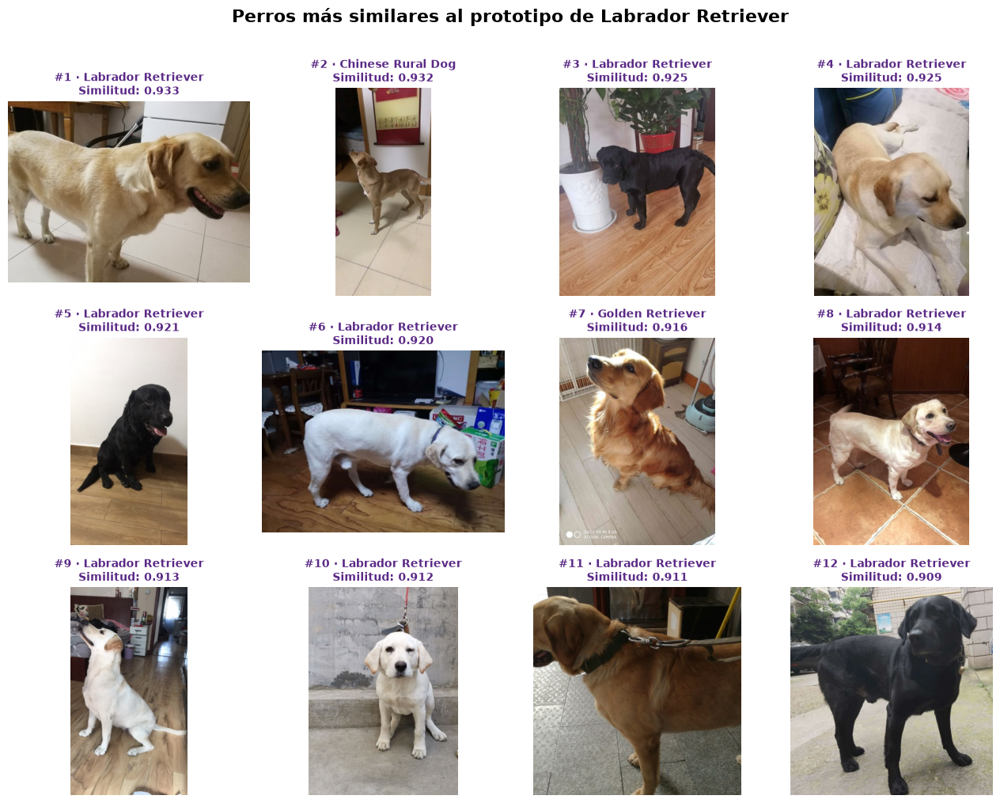

In [43]:
# Visualización del ranking de similitud visual

fig, axes = plt.subplots(
    3,
    4,
    figsize=(13, 10)
)


axes = axes.flatten()


for posicion, (
    ax,
    indice
) in enumerate(
    zip(
        axes,
        top_indices
    ),
    start=1
):

    imagen = obtener_imagen_tsinghua(
        tabla_valid_tsinghua,
        int(indice)
    )


    label_real = int(
        labels_clip_valid[
            indice
        ]
    )


    raza_real = (
        razas_tsinghua_df
        .loc[
            razas_tsinghua_df[
                "label"
            ] == label_real,
            "raza_display"
        ]
        .iloc[0]
    )


    similitud = float(
        similitud_busqueda[
            indice
        ]
    )


    ax.imshow(
        imagen
    )


    ax.set_title(
        f"#{posicion} · {raza_real}\n"
        f"Similitud: {similitud:.3f}",
        fontsize=10,
        color="#5B2A86",
        fontweight="bold"
    )


    ax.axis(
        "off"
    )


plt.suptitle(
    f"Perros más similares al prototipo "
    f"de {RAZA_BUSQUEDA}",
    fontsize=16,
    fontweight="bold",
    y=1.01
)


plt.tight_layout()

plt.show()

### 7.2. Ejemplo de recuperación visual por raza

Para aproximar el funcionamiento de la futura herramienta de búsqueda de *Invisible Dogs*, se utiliza el prototipo visual de Labrador Retriever como consulta y se ordenan las fotografías independientes de validación según su similitud coseno.

Entre las doce fotografías con mayor similitud, diez corresponden directamente a Labrador Retriever. Las dos restantes pertenecen a Golden Retriever y Chinese Rural Dog y presentan, no obstante, características visuales próximas a la apariencia buscada.

Este comportamiento resulta especialmente relevante para el objetivo de la futura aplicación. La búsqueda visual no pretende actuar únicamente como un filtro rígido basado en la etiqueta de raza, sino recuperar perros con una apariencia compatible con las preferencias del adoptante.

De esta forma, un animal registrado bajo otra categoría —o potencialmente un perro mestizo en un refugio real— podría aparecer entre los resultados cuando sus características visuales fueran similares a la raza seleccionada. Esta estrategia permite ampliar la búsqueda más allá de la correspondencia exacta de etiquetas y puede favorecer la visibilidad de animales que de otro modo quedarían excluidos por un filtro convencional de raza.

In [44]:
# Evaluación global del ranking generado por cada prototipo de raza

K_VALUES = [
    5,
    10,
    20,
    40
]


resultados_retrieval_clip = []


for label in range(
    n_razas_tsinghua
):

    # Prototipo de la raza utilizada como consulta
    prototipo = (
        prototipos_clip[
            label
        ]
    )


    # Similitud con todas las fotografías de validation
    similitudes_raza = (
        embeddings_clip_valid
        @ prototipo
    )


    ranking_raza = np.argsort(
        similitudes_raza
    )[::-1]


    resultado_raza = {
        "label": label
    }


    for k in K_VALUES:

        top_k = (
            ranking_raza[
                :k
            ]
        )


        precision_k = np.mean(
            labels_clip_valid[
                top_k
            ]
            == label
        )


        resultado_raza[
            f"precision_at_{k}"
        ] = (
            precision_k
        )


    resultados_retrieval_clip.append(
        resultado_raza
    )


retrieval_clip_df = (
    pd.DataFrame(
        resultados_retrieval_clip
    )
    .merge(
        razas_tsinghua_df[
            [
                "label",
                "raza_display"
            ]
        ],
        on="label",
        how="left",
        validate="one_to_one"
    )
)


print(
    "Precisión media del ranking "
    "entre las 130 razas:"
)


for k in K_VALUES:

    media_k = (
        retrieval_clip_df[
            f"precision_at_{k}"
        ]
        .mean()
    )

    print(
        f"Precision@{k}: "
        f"{media_k:.4f}"
    )

Precisión media del ranking entre las 130 razas:
Precision@5: 0.6462
Precision@10: 0.5600
Precision@20: 0.4442
Precision@40: 0.3283


In [45]:
# Razas con mejor y peor comportamiento en búsqueda visual

print(
    "Razas con mayor Precision@10:"
)

display(
    retrieval_clip_df[
        [
            "raza_display",
            "precision_at_5",
            "precision_at_10",
            "precision_at_20",
            "precision_at_40"
        ]
    ]
    .sort_values(
        "precision_at_10",
        ascending=False
    )
    .head(
        15
    )
    .round(4)
)


print(
    "\nRazas con menor Precision@10:"
)

display(
    retrieval_clip_df[
        [
            "raza_display",
            "precision_at_5",
            "precision_at_10",
            "precision_at_20",
            "precision_at_40"
        ]
    ]
    .sort_values(
        "precision_at_10",
        ascending=True
    )
    .head(
        15
    )
    .round(4)
)

Razas con mayor Precision@10:


,raza_display,precision_at_5,precision_at_10,precision_at_20,precision_at_40
54,Norwegian Elkhound,1.0,1.0,0.60,0.450
30,Brabancon Griffo,1.0,1.0,0.85,0.650
117,Komondor,1.0,1.0,0.85,0.525
91,Chinese Crested Dog,1.0,1.0,0.55,0.425
44,Leonberg,1.0,1.0,0.65,0.450
38,African Hunting Dog,1.0,1.0,0.85,0.625
75,Groenendael,1.0,1.0,0.70,0.500
66,Keeshond,1.0,1.0,0.90,0.650
85,Eskimo Dog,1.0,0.9,0.80,0.475
1,French Bulldog,1.0,0.9,0.70,0.475



Razas con menor Precision@10:


,raza_display,precision_at_5,precision_at_10,precision_at_20,precision_at_40
116,Standard Poodle,0.0,0.0,0.00,0.050
49,Lakeland Terrier,0.2,0.1,0.10,0.100
114,Toy Poodle,0.2,0.1,0.30,0.175
35,Vizsla,0.2,0.1,0.20,0.225
112,Cocker Spaniel,0.2,0.1,0.20,0.150
105,Japanese Spitzes,0.2,0.1,0.15,0.225
124,Pekinese,0.0,0.1,0.10,0.075
129,Papillon,0.2,0.1,0.15,0.100
97,Toy Terrier,0.2,0.2,0.10,0.150
122,Shih Tzu,0.2,0.2,0.15,0.100


### 7.3. Evaluación global de la búsqueda por prototipo

La evaluación mediante los 130 prototipos de raza permite analizar de forma más directa el comportamiento esperado de una futura herramienta de búsqueda visual.

Considerando las cinco fotografías más próximas al prototipo de cada raza, la precisión media alcanza el **64,62 %**. Para los diez primeros resultados se obtiene una precisión media del **56,00 %**, mientras que al ampliar el ranking a veinte y cuarenta fotografías la precisión disminuye hasta el **44,42 %** y el **32,83 %**, respectivamente.

La disminución progresiva de la precisión al aumentar el número de resultados recuperados es esperable, ya que las primeras posiciones concentran las fotografías visualmente más próximas al prototipo y, conforme se amplía el ranking, comienzan a incorporarse perros pertenecientes a razas con características morfológicas similares.

El comportamiento varía considerablemente entre categorías. Algunas razas visualmente diferenciadas presentan una recuperación muy elevada, llegando a alcanzar una Precision@10 igual a 1, mientras que otras categorías muestran una mayor confusión con razas próximas.

Estos resultados refuerzan el uso de CLIP como herramienta de **recuperación por similitud visual**, más que como clasificador rígido de raza. En el contexto de *Invisible Dogs*, esta característica resulta especialmente útil, ya que la futura herramienta pretende recuperar un conjunto reducido de perros visualmente compatibles con las preferencias del adoptante, incluyendo potencialmente animales mestizos o registrados bajo una categoría diferente.

## 8. Representaciones visuales con DINOv2

Con el objetivo de comprobar si una representación visual alternativa mejora la recuperación por raza, se incorpora **DINOv2** como segundo extractor de características.

A diferencia de CLIP, cuyo entrenamiento combina información visual y textual, DINOv2 aprende representaciones visuales autosupervisadas directamente a partir de imágenes. Esta diferencia resulta especialmente interesante en una tarea centrada en características morfológicas y apariencia, como la comparación entre razas de perro.

Para garantizar una comparación homogénea con CLIP, se utilizarán exactamente los mismos conjuntos de entrenamiento y validación, así como las mismas fotografías utilizadas durante la prueba inicial de rendimiento.

Antes de procesar las 26.000 fotografías seleccionadas, se realiza nuevamente una prueba de velocidad con distintos tamaños de lote para determinar una configuración adecuada al dispositivo disponible.

In [46]:
# Carga de DINOv2

from transformers import (
    AutoImageProcessor,
    AutoModel
)
from transformers.utils import logging as hf_logging


DINOV2_MODEL_NAME = (
    "facebook/dinov2-small"
)


dtype_dinov2 = (
    torch.float16
    if device.type == "cuda"
    else torch.float32
)


verbosity_hf_original = hf_logging.get_verbosity()
hf_logging.set_verbosity_error()

try:
    processor_dinov2 = (
        AutoImageProcessor
        .from_pretrained(
            DINOV2_MODEL_NAME
        )
    )

    modelo_dinov2 = (
        AutoModel
        .from_pretrained(
            DINOV2_MODEL_NAME
        )
        .to(
            device=device,
            dtype=dtype_dinov2
        )
    )
finally:
    hf_logging.set_verbosity(
        verbosity_hf_original
    )


modelo_dinov2.eval()


print("Dispositivo:")
print(device)

if device.type == "cuda":
    print("\nGPU:")
    print(
        torch.cuda.get_device_name(0)
    )

print("\nModelo DINOv2:")
print(DINOV2_MODEL_NAME)

print("\nTipo numérico:")
print(dtype_dinov2)

Dispositivo:
cuda

GPU:
NVIDIA GeForce GTX 1650

Modelo DINOv2:
facebook/dinov2-small

Tipo numérico:
torch.float16


In [47]:
# Función para extraer embeddings DINOv2

def extraer_embeddings_dinov2(
    imagenes,
    batch_size=32
):

    embeddings_batches = []


    for inicio in range(
        0,
        len(imagenes),
        batch_size
    ):

        batch_imagenes = (
            imagenes[
                inicio:
                inicio + batch_size
            ]
        )


        inputs = processor_dinov2(
            images=batch_imagenes,
            return_tensors="pt"
        )


        pixel_values = (
            inputs[
                "pixel_values"
            ]
            .to(
                device=device,
                dtype=dtype_dinov2
            )
        )


        with torch.inference_mode():

            outputs = modelo_dinov2(
                pixel_values=pixel_values
            )


            embeddings = (
                outputs
                .last_hidden_state[
                    :,
                    0,
                    :
                ]
            )


            embeddings = (
                torch.nn.functional.normalize(
                    embeddings,
                    p=2,
                    dim=1
                )
            )


        embeddings_batches.append(
            embeddings
            .float()
            .cpu()
            .numpy()
        )


    return np.vstack(
        embeddings_batches
    )

In [48]:
# Benchmark de diferentes tamaños de lote para DINOv2

batch_sizes_dinov2 = [
    1,
    4,
    8,
    16,
    32,
    64
]


resultados_benchmark_dinov2 = []


# Warm-up de GPU

if device.type == "cuda":

    _ = extraer_embeddings_dinov2(
        imagenes_benchmark_clip[
            :8
        ],
        batch_size=8
    )

    torch.cuda.synchronize()


for batch_size in batch_sizes_dinov2:

    if device.type == "cuda":

        torch.cuda.empty_cache()
        torch.cuda.synchronize()


    inicio = time.perf_counter()


    embeddings_prueba_dinov2 = (
        extraer_embeddings_dinov2(
            imagenes_benchmark_clip,
            batch_size=batch_size
        )
    )


    if device.type == "cuda":

        torch.cuda.synchronize()


    tiempo = (
        time.perf_counter()
        - inicio
    )


    resultados_benchmark_dinov2.append({
        "batch_size": batch_size,
        "tiempo_segundos": tiempo,
        "imagenes_segundo": (
            len(
                imagenes_benchmark_clip
            )
            / tiempo
        )
    })


benchmark_dinov2_df = pd.DataFrame(
    resultados_benchmark_dinov2
)


print(
    "Benchmark DINOv2:"
)


display(
    benchmark_dinov2_df
    .round({
        "tiempo_segundos": 3,
        "imagenes_segundo": 2
    })
)


print(
    "\nDimensión del embedding:"
)

print(
    embeddings_prueba_dinov2.shape[
        1
    ]
)

Benchmark DINOv2:


,batch_size,tiempo_segundos,imagenes_segundo
0,1,6.040,16.56
1,4,4.433,22.56
2,8,4.324,23.13
3,16,4.168,23.99
4,32,3.896,25.67
5,64,4.074,24.55



Dimensión del embedding:
384


In [49]:
# Comprobaciones básicas de los embeddings DINOv2

normas_dinov2 = np.linalg.norm(
    embeddings_prueba_dinov2,
    axis=1
)


print(
    "Forma:"
)

print(
    embeddings_prueba_dinov2.shape
)


print(
    "\n¿Contiene NaN?:"
)

print(
    np.isnan(
        embeddings_prueba_dinov2
    ).any()
)


print(
    "\n¿Contiene infinitos?:"
)

print(
    np.isinf(
        embeddings_prueba_dinov2
    ).any()
)


print(
    "\nNorma media:"
)

print(
    round(
        float(
            normas_dinov2.mean()
        ),
        4
    )
)


print(
    "\nNorma mínima:"
)

print(
    round(
        float(
            normas_dinov2.min()
        ),
        4
    )
)


print(
    "\nNorma máxima:"
)

print(
    round(
        float(
            normas_dinov2.max()
        ),
        4
    )
)

Forma:
(100, 384)

¿Contiene NaN?:
False

¿Contiene infinitos?:
False

Norma media:
1.0

Norma mínima:
0.9997

Norma máxima:
1.0003


### 8.1. Selección del tamaño de lote

La prueba de rendimiento confirma el correcto funcionamiento de DINOv2 sobre GPU y la generación de embeddings de 384 dimensiones normalizados mediante norma L2.

El rendimiento aumenta progresivamente con el tamaño de lote hasta alcanzar aproximadamente 26 fotografías por segundo con valores de 32 y 64. Dado que la diferencia entre ambos tamaños es mínima, se adopta un **batch size de 32**, proporcionando prácticamente el máximo rendimiento observado y manteniendo un mayor margen de memoria durante la extracción completa.

Los embeddings obtenidos no presentan valores ausentes ni infinitos y mantienen una norma próxima a uno, por lo que pueden compararse posteriormente mediante similitud coseno.

In [50]:
# Configuración de la extracción completa de DINOv2

BATCH_SIZE_DINOV2 = 32

DIMENSION_DINOV2 = int(
    embeddings_prueba_dinov2.shape[1]
)


dinov2_train_embeddings_path = (
    tsinghua_outputs_path
    / "tsinghua_dinov2_train_embeddings.npz"
)


dinov2_valid_embeddings_path = (
    tsinghua_outputs_path
    / "tsinghua_dinov2_validation_embeddings.npz"
)


dinov2_prototipos_path = (
    tsinghua_outputs_path
    / "tsinghua_dinov2_breed_prototypes.npz"
)


print("Batch seleccionado:")
print(BATCH_SIZE_DINOV2)

print("\nDimensión DINOv2:")
print(DIMENSION_DINOV2)

print("\nEmbeddings de entrenamiento:")
print(dinov2_train_embeddings_path)

print("\nEmbeddings de validación:")
print(dinov2_valid_embeddings_path)

Batch seleccionado:
32

Dimensión DINOv2:
384

Embeddings de entrenamiento:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\tsinghua_visual\tsinghua_dinov2_train_embeddings.npz

Embeddings de validación:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\tsinghua_visual\tsinghua_dinov2_validation_embeddings.npz


In [51]:
# Extracción DINOv2 por lotes desde una tabla Arrow

def extraer_dinov2_desde_tabla(
    tabla,
    indices,
    batch_size=32,
    mostrar_progreso=True
):

    indices = np.asarray(
        indices,
        dtype=np.int64
    )

    embeddings_salida = np.empty(
        (
            len(indices),
            DIMENSION_DINOV2
        ),
        dtype=np.float32
    )


    for inicio in range(
        0,
        len(indices),
        batch_size
    ):

        fin = min(
            inicio + batch_size,
            len(indices)
        )

        indices_batch = indices[
            inicio:fin
        ]

        imagenes_batch = [
            obtener_imagen_tsinghua(
                tabla,
                int(indice)
            )
            for indice
            in indices_batch
        ]

        embeddings_batch = (
            extraer_embeddings_dinov2(
                imagenes_batch,
                batch_size=batch_size
            )
        )

        embeddings_salida[
            inicio:fin
        ] = embeddings_batch

        del imagenes_batch
        del embeddings_batch


        if (
            mostrar_progreso
            and (
                fin % 1000 == 0
                or fin == len(indices)
            )
        ):

            print(
                f"Procesadas: "
                f"{fin}/{len(indices)}"
            )


    return embeddings_salida

In [52]:
# Extracción de embeddings DINOv2 del train equilibrado

import gc


cache_dinov2_train = cargar_cache_embeddings_si_valida(
    ruta_cache=dinov2_train_embeddings_path,
    indice_esperado=train_balanceado_tsinghua_df,
    dimension_esperada=DIMENSION_DINOV2,
    modelo_esperado=DINOV2_MODEL_NAME,
    nombre_cache="DINOv2 train"
)


if cache_dinov2_train is not None:

    embeddings_dinov2_train = (
        cache_dinov2_train["embeddings"]
    )

    labels_dinov2_train = (
        cache_dinov2_train["label"]
    )

    print(
        "Embeddings DINOv2 de entrenamiento "
        "cargados desde archivo existente."
    )

else:

    embeddings_dinov2_train = np.empty(
        (
            len(train_balanceado_tsinghua_df),
            DIMENSION_DINOV2
        ),
        dtype=np.float32
    )

    inicio_dinov2_train = time.perf_counter()

    for numero_archivo, archivo in enumerate(
        archivos_train_tsinghua,
        start=1
    ):

        seleccion_archivo = (
            train_balanceado_tsinghua_df[
                train_balanceado_tsinghua_df[
                    "archivo"
                ] == archivo.name
            ]
        )

        if len(seleccion_archivo) == 0:
            continue

        print(
            f"\nArchivo {numero_archivo}/"
            f"{len(archivos_train_tsinghua)}:"
        )
        print(archivo.name)
        print(
            "Fotografías seleccionadas:",
            len(seleccion_archivo)
        )

        tabla_archivo = pq.read_table(
            archivo,
            columns=["image", "label"],
            schema=schema_tsinghua_visual,
            arrow_extensions_enabled=False
        )

        posiciones_salida = (
            seleccion_archivo.index
            .to_numpy(dtype=np.int64)
        )

        indices_locales = (
            seleccion_archivo["indice_local"]
            .to_numpy(dtype=np.int64)
        )

        labels_esperados = (
            seleccion_archivo["label"]
            .to_numpy(dtype=np.int64)
        )

        labels_archivo = np.asarray(
            tabla_archivo["label"].to_pylist(),
            dtype=np.int64
        )

        if not np.array_equal(
            labels_archivo[indices_locales],
            labels_esperados
        ):
            raise ValueError(
                "Las etiquetas del índice no coinciden "
                f"con el archivo {archivo.name}."
            )

        embeddings_archivo = extraer_dinov2_desde_tabla(
            tabla=tabla_archivo,
            indices=indices_locales,
            batch_size=BATCH_SIZE_DINOV2
        )

        embeddings_dinov2_train[
            posiciones_salida
        ] = embeddings_archivo

        del embeddings_archivo
        del labels_archivo
        del tabla_archivo

        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    tiempo_dinov2_train = (
        time.perf_counter()
        - inicio_dinov2_train
    )

    labels_dinov2_train = (
        train_balanceado_tsinghua_df["label"]
        .to_numpy(dtype=np.int64)
    )

    np.savez_compressed(
        dinov2_train_embeddings_path,
        embeddings=embeddings_dinov2_train,
        label=labels_dinov2_train,
        indice_local=(
            train_balanceado_tsinghua_df["indice_local"]
            .to_numpy(dtype=np.int64)
        ),
        archivo=(
            train_balanceado_tsinghua_df["archivo"]
            .astype(str)
            .to_numpy()
        ),
        model_name=np.asarray([DINOV2_MODEL_NAME])
    )

    print(
        "\nExtracción DINOv2 de entrenamiento finalizada."
    )
    print("\nTiempo total:")
    print(
        f"{tiempo_dinov2_train / 60:.2f} minutos"
    )

La caché 'DINOv2 train' no es compatible con el índice actual (faltan claves: ['model_name']).
Se recalcularán los embeddings.

Archivo 1/6:
train-00000-of-00006.parquet
Fotografías seleccionadas: 5162
Procesadas: 4000/5162
Procesadas: 5162/5162

Archivo 2/6:
train-00001-of-00006.parquet
Fotografías seleccionadas: 7959
Procesadas: 4000/7959
Procesadas: 7959/7959

Archivo 3/6:
train-00002-of-00006.parquet
Fotografías seleccionadas: 4962
Procesadas: 4000/4962
Procesadas: 4962/4962

Archivo 4/6:
train-00003-of-00006.parquet
Fotografías seleccionadas: 1019
Procesadas: 1019/1019

Archivo 5/6:
train-00004-of-00006.parquet
Fotografías seleccionadas: 1018
Procesadas: 1018/1018

Archivo 6/6:
train-00005-of-00006.parquet
Fotografías seleccionadas: 680
Procesadas: 680/680

Extracción DINOv2 de entrenamiento finalizada.

Tiempo total:
13.77 minutos


In [53]:
# Validación de embeddings DINOv2 de entrenamiento

normas_dinov2_train = np.linalg.norm(
    embeddings_dinov2_train,
    axis=1
)


print("Forma:")
print(embeddings_dinov2_train.shape)

print("\n¿Contiene NaN?:")
print(
    np.isnan(
        embeddings_dinov2_train
    ).any()
)

print("\n¿Contiene infinitos?:")
print(
    np.isinf(
        embeddings_dinov2_train
    ).any()
)

print("\nNorma media:")
print(
    round(
        float(
            normas_dinov2_train.mean()
        ),
        4
    )
)

print("\nNorma mínima:")
print(
    round(
        float(
            normas_dinov2_train.min()
        ),
        4
    )
)

print("\nNorma máxima:")
print(
    round(
        float(
            normas_dinov2_train.max()
        ),
        4
    )
)

print("\nTamaño del archivo:")
print(
    f"{dinov2_train_embeddings_path.stat().st_size / 1024**2:.2f} MB"
)

Forma:
(20800, 384)

¿Contiene NaN?:
False

¿Contiene infinitos?:
False

Norma media:
1.0

Norma mínima:
0.9996

Norma máxima:
1.0004

Tamaño del archivo:
17.93 MB


In [54]:
# Extracción de embeddings DINOv2 del conjunto de validación

cache_dinov2_valid = cargar_cache_embeddings_si_valida(
    ruta_cache=dinov2_valid_embeddings_path,
    indice_esperado=indice_valid_tsinghua_df,
    dimension_esperada=DIMENSION_DINOV2,
    modelo_esperado=DINOV2_MODEL_NAME,
    nombre_cache="DINOv2 validation"
)


if cache_dinov2_valid is not None:

    embeddings_dinov2_valid = (
        cache_dinov2_valid["embeddings"]
    )

    labels_dinov2_valid = (
        cache_dinov2_valid["label"]
    )

    print(
        "Embeddings DINOv2 de validación "
        "cargados desde archivo existente."
    )

else:

    inicio_dinov2_valid = time.perf_counter()

    embeddings_dinov2_valid = extraer_dinov2_desde_tabla(
        tabla=tabla_valid_tsinghua,
        indices=(
            indice_valid_tsinghua_df["indice_local"]
            .to_numpy(dtype=np.int64)
        ),
        batch_size=BATCH_SIZE_DINOV2
    )

    tiempo_dinov2_valid = (
        time.perf_counter()
        - inicio_dinov2_valid
    )

    labels_dinov2_valid = (
        indice_valid_tsinghua_df["label"]
        .to_numpy(dtype=np.int64)
    )

    np.savez_compressed(
        dinov2_valid_embeddings_path,
        embeddings=embeddings_dinov2_valid,
        label=labels_dinov2_valid,
        indice_local=(
            indice_valid_tsinghua_df["indice_local"]
            .to_numpy(dtype=np.int64)
        ),
        archivo=(
            indice_valid_tsinghua_df["archivo"]
            .astype(str)
            .to_numpy()
        ),
        model_name=np.asarray([DINOV2_MODEL_NAME])
    )

    print(
        "\nExtracción DINOv2 de validación finalizada."
    )
    print("\nTiempo total:")
    print(
        f"{tiempo_dinov2_valid / 60:.2f} minutos"
    )

La caché 'DINOv2 validation' no es compatible con el índice actual (faltan claves: ['model_name']).
Se recalcularán los embeddings.
Procesadas: 4000/5200
Procesadas: 5200/5200

Extracción DINOv2 de validación finalizada.

Tiempo total:
3.44 minutos


In [55]:
# Validación de embeddings DINOv2 de validation

normas_dinov2_valid = np.linalg.norm(
    embeddings_dinov2_valid,
    axis=1
)


print("Forma:")
print(embeddings_dinov2_valid.shape)

print("\n¿Contiene NaN?:")
print(
    np.isnan(
        embeddings_dinov2_valid
    ).any()
)

print("\n¿Contiene infinitos?:")
print(
    np.isinf(
        embeddings_dinov2_valid
    ).any()
)

print("\nNorma media:")
print(
    round(
        float(
            normas_dinov2_valid.mean()
        ),
        4
    )
)

print("\nNorma mínima:")
print(
    round(
        float(
            normas_dinov2_valid.min()
        ),
        4
    )
)

print("\nNorma máxima:")
print(
    round(
        float(
            normas_dinov2_valid.max()
        ),
        4
    )
)

print("\nTamaño del archivo:")
print(
    f"{dinov2_valid_embeddings_path.stat().st_size / 1024**2:.2f} MB"
)

Forma:
(5200, 384)

¿Contiene NaN?:
False

¿Contiene infinitos?:
False

Norma media:
1.0

Norma mínima:
0.9996

Norma máxima:
1.0004

Tamaño del archivo:
4.48 MB


## 9. Construcción y evaluación de prototipos DINOv2

A partir de los embeddings DINOv2 obtenidos sobre el conjunto equilibrado de entrenamiento se construye una segunda colección de prototipos visuales de raza.

Al igual que en el análisis realizado con CLIP, cada prototipo se obtiene calculando el vector medio de las 160 fotografías disponibles para una raza y normalizando posteriormente la representación mediante norma L2.

Los prototipos resultantes se evalúan sobre las 5.200 fotografías independientes de validación. De esta forma, CLIP y DINOv2 se comparan utilizando exactamente las mismas imágenes, particiones y criterios de evaluación.

In [56]:
# Construcción de prototipos visuales DINOv2 por raza

prototipos_dinov2 = np.zeros(
    (
        n_razas_tsinghua,
        DIMENSION_DINOV2
    ),
    dtype=np.float32
)


for label in range(
    n_razas_tsinghua
):

    mascara_raza = (
        labels_dinov2_train
        == label
    )


    embeddings_raza = (
        embeddings_dinov2_train[
            mascara_raza
        ]
    )


    prototipo = (
        embeddings_raza.mean(
            axis=0
        )
    )


    norma_prototipo = np.linalg.norm(
        prototipo
    )


    if norma_prototipo == 0:

        raise ValueError(
            f"El prototipo de la raza "
            f"{label} tiene norma cero."
        )


    prototipos_dinov2[
        label
    ] = (
        prototipo
        / norma_prototipo
    )


# ---------------------------------------------------------
# Comprobaciones
# ---------------------------------------------------------

normas_prototipos_dinov2 = (
    np.linalg.norm(
        prototipos_dinov2,
        axis=1
    )
)


print(
    "Forma de la matriz de prototipos:"
)

print(
    prototipos_dinov2.shape
)


print(
    "\nNúmero de prototipos:"
)

print(
    len(
        prototipos_dinov2
    )
)


print(
    "\nNorma media:"
)

print(
    round(
        float(
            normas_prototipos_dinov2.mean()
        ),
        4
    )
)


print(
    "\nNorma mínima:"
)

print(
    round(
        float(
            normas_prototipos_dinov2.min()
        ),
        4
    )
)


print(
    "\nNorma máxima:"
)

print(
    round(
        float(
            normas_prototipos_dinov2.max()
        ),
        4
    )
)

Forma de la matriz de prototipos:
(130, 384)

Número de prototipos:
130

Norma media:
1.0

Norma mínima:
1.0

Norma máxima:
1.0


In [57]:
# Guardado de prototipos visuales DINOv2

np.savez_compressed(
    dinov2_prototipos_path,
    embeddings=prototipos_dinov2,
    label=np.arange(
        n_razas_tsinghua,
        dtype=np.int64
    ),
    raza=nombres_razas_clip
)


print(
    "Prototipos guardados en:"
)

print(
    dinov2_prototipos_path
)


print(
    "\nTamaño:"
)

print(
    f"{dinov2_prototipos_path.stat().st_size / 1024**2:.2f} MB"
)

Prototipos guardados en:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\tsinghua_visual\tsinghua_dinov2_breed_prototypes.npz

Tamaño:
0.18 MB


In [58]:
# Similitud coseno entre validation y prototipos DINOv2

similitudes_dinov2_valid = (
    embeddings_dinov2_valid
    @ prototipos_dinov2.T
)


print(
    "Forma de la matriz de similitudes:"
)

print(
    similitudes_dinov2_valid.shape
)


print(
    "\nSimilitud mínima:"
)

print(
    round(
        float(
            similitudes_dinov2_valid.min()
        ),
        4
    )
)


print(
    "\nSimilitud máxima:"
)

print(
    round(
        float(
            similitudes_dinov2_valid.max()
        ),
        4
    )
)

Forma de la matriz de similitudes:
(5200, 130)

Similitud mínima:
-0.3612

Similitud máxima:
0.9427


In [59]:
# Evaluación de recuperación DINOv2 por raza

ranking_dinov2_valid = np.argsort(
    similitudes_dinov2_valid,
    axis=1
)[:, ::-1]


pred_dinov2_top1 = (
    ranking_dinov2_valid[
        :,
        0
    ]
)


accuracy_top1_dinov2 = np.mean(
    pred_dinov2_top1
    == labels_dinov2_valid
)


accuracy_top5_dinov2 = np.mean([
    label_real
    in ranking_dinov2_valid[
        i,
        :5
    ]
    for i, label_real
    in enumerate(
        labels_dinov2_valid
    )
])


accuracy_top10_dinov2 = np.mean([
    label_real
    in ranking_dinov2_valid[
        i,
        :10
    ]
    for i, label_real
    in enumerate(
        labels_dinov2_valid
    )
])


print(
    "Exactitud Top-1:"
)

print(
    f"{accuracy_top1_dinov2:.4f}"
)


print(
    "\nExactitud Top-5:"
)

print(
    f"{accuracy_top5_dinov2:.4f}"
)


print(
    "\nExactitud Top-10:"
)

print(
    f"{accuracy_top10_dinov2:.4f}"
)

Exactitud Top-1:
0.7773

Exactitud Top-5:
0.9710

Exactitud Top-10:
0.9904


In [60]:
# Posición de la raza correcta en DINOv2

posiciones_raza_correcta_dinov2 = np.empty(
    len(
        labels_dinov2_valid
    ),
    dtype=np.int64
)


for i, label_real in enumerate(
    labels_dinov2_valid
):

    posiciones_raza_correcta_dinov2[
        i
    ] = (
        np.where(
            ranking_dinov2_valid[
                i
            ]
            == label_real
        )[0][0]
        + 1
    )


mrr_dinov2 = np.mean(
    1
    / posiciones_raza_correcta_dinov2
)


print(
    "Posición mediana "
    "de la raza correcta:"
)

print(
    int(
        np.median(
            posiciones_raza_correcta_dinov2
        )
    )
)


print(
    "\nPosición media:"
)

print(
    round(
        float(
            posiciones_raza_correcta_dinov2.mean()
        ),
        2
    )
)


print(
    "\nMean Reciprocal Rank (MRR):"
)

print(
    round(
        float(
            mrr_dinov2
        ),
        4
    )
)

Posición mediana de la raza correcta:
1

Posición media:
1.63

Mean Reciprocal Rank (MRR):
0.8622


In [61]:
# Evaluación global del ranking DINOv2
# generado por cada prototipo de raza

resultados_retrieval_dinov2 = []


for label in range(
    n_razas_tsinghua
):

    prototipo = (
        prototipos_dinov2[
            label
        ]
    )


    similitudes_raza = (
        embeddings_dinov2_valid
        @ prototipo
    )


    ranking_raza = np.argsort(
        similitudes_raza
    )[::-1]


    resultado_raza = {
        "label": label
    }


    for k in K_VALUES:

        top_k = (
            ranking_raza[
                :k
            ]
        )


        precision_k = np.mean(
            labels_dinov2_valid[
                top_k
            ]
            == label
        )


        resultado_raza[
            f"precision_at_{k}"
        ] = precision_k


    resultados_retrieval_dinov2.append(
        resultado_raza
    )


retrieval_dinov2_df = (
    pd.DataFrame(
        resultados_retrieval_dinov2
    )
    .merge(
        razas_tsinghua_df[
            [
                "label",
                "raza_display"
            ]
        ],
        on="label",
        how="left",
        validate="one_to_one"
    )
)


print(
    "Precisión media del ranking "
    "entre las 130 razas:"
)


for k in K_VALUES:

    media_k = (
        retrieval_dinov2_df[
            f"precision_at_{k}"
        ]
        .mean()
    )

    print(
        f"Precision@{k}: "
        f"{media_k:.4f}"
    )

Precisión media del ranking entre las 130 razas:
Precision@5: 0.8846
Precision@10: 0.8562
Precision@20: 0.7915
Precision@40: 0.6402


In [62]:
# Comparación global CLIP vs DINOv2

comparacion_modelos_visuales = pd.DataFrame({
    "Modelo": [
        "CLIP",
        "DINOv2"
    ],

    "Top-1": [
        accuracy_top1_clip,
        accuracy_top1_dinov2
    ],

    "Top-5": [
        accuracy_top5_clip,
        accuracy_top5_dinov2
    ],

    "Top-10": [
        accuracy_top10_clip,
        accuracy_top10_dinov2
    ],

    "MRR": [
        mrr_clip,
        mrr_dinov2
    ],

    "Precision@5": [
        retrieval_clip_df[
            "precision_at_5"
        ].mean(),

        retrieval_dinov2_df[
            "precision_at_5"
        ].mean()
    ],

    "Precision@10": [
        retrieval_clip_df[
            "precision_at_10"
        ].mean(),

        retrieval_dinov2_df[
            "precision_at_10"
        ].mean()
    ],

    "Precision@20": [
        retrieval_clip_df[
            "precision_at_20"
        ].mean(),

        retrieval_dinov2_df[
            "precision_at_20"
        ].mean()
    ],

    "Precision@40": [
        retrieval_clip_df[
            "precision_at_40"
        ].mean(),

        retrieval_dinov2_df[
            "precision_at_40"
        ].mean()
    ]
})


display(
    comparacion_modelos_visuales
    .set_index(
        "Modelo"
    )
    .round(4)
)

,Top-1,Top-5,Top-10,MRR,Precision@5,Precision@10,Precision@20,Precision@40
Modelo,,,,,,,,
CLIP,0.5846,0.8794,0.9360,0.7126,0.6462,0.5600,0.4442,0.3283
DINOv2,0.7773,0.9710,0.9904,0.8622,0.8846,0.8562,0.7915,0.6402


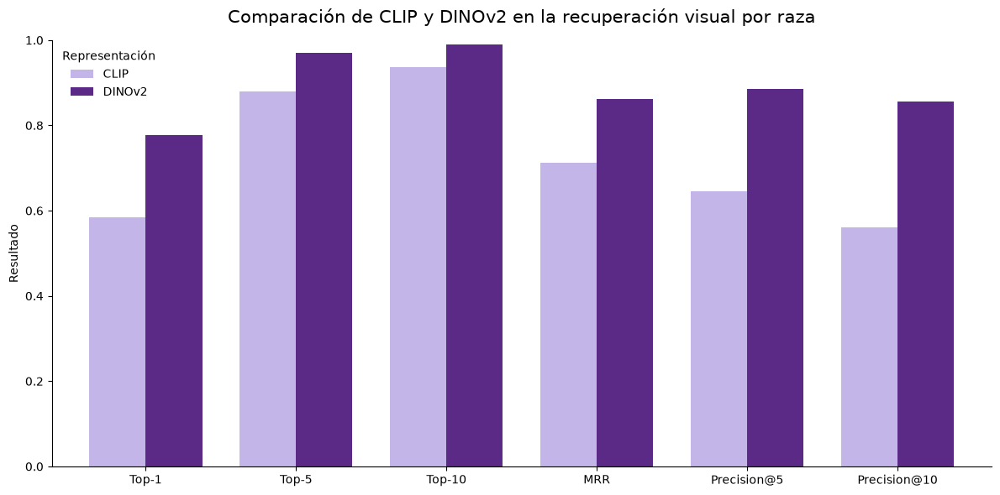

In [63]:
# Comparación visual CLIP vs DINOv2

metricas_plot = [
    "Top-1",
    "Top-5",
    "Top-10",
    "MRR",
    "Precision@5",
    "Precision@10"
]


datos_plot = (
    comparacion_modelos_visuales
    .set_index(
        "Modelo"
    )[
        metricas_plot
    ]
    .T
)


ax = datos_plot.plot(
    kind="bar",
    figsize=(12, 6),
    color=[
        "#C4B5E8",
        "#5B2A86"
    ],
    width=0.75
)


ax.set_title(
    "Comparación de CLIP y DINOv2 "
    "en la recuperación visual por raza",
    fontsize=15,
    pad=15
)


ax.set_xlabel(
    ""
)

ax.set_ylabel(
    "Resultado"
)


ax.set_ylim(
    0,
    1
)


ax.tick_params(
    axis="x",
    rotation=0
)


ax.legend(
    title="Representación",
    frameon=False
)


ax.spines[
    "top"
].set_visible(
    False
)

ax.spines[
    "right"
].set_visible(
    False
)


plt.tight_layout()

plt.show()

### 9.1. Comparación entre CLIP y DINOv2

La comparación realizada sobre las mismas particiones y fotografías muestra una ventaja consistente de DINOv2 frente a CLIP en todas las métricas consideradas.

DINOv2 alcanza una exactitud Top-1 del **77,73 %**, frente al 58,46 % obtenido por CLIP. La diferencia se mantiene al ampliar el número de alternativas consideradas: la raza verdadera aparece entre las cinco primeras posiciones en el **97,10 %** de las fotografías y entre las diez primeras en el **99,04 %**.

La mejora resulta todavía más relevante al analizar la tarea desde la perspectiva de recuperación visual. La Precision@5 aumenta del 64,62 % al **88,46 %**, mientras que la Precision@10 pasa del 56,00 % al **85,62 %**.

Estos resultados indican que DINOv2 genera un espacio visual especialmente adecuado para representar características morfológicas de los perros y discriminar entre razas con apariencias próximas. Este comportamiento es coherente con su aprendizaje autosupervisado exclusivamente visual y resulta especialmente favorable para el objetivo de búsqueda por apariencia planteado en *Invisible Dogs*.

En consecuencia, **DINOv2 se selecciona como representación visual principal para la funcionalidad de búsqueda por raza y similitud**, manteniéndose CLIP como referencia comparativa dentro del análisis.

In [64]:
# Comparación pareada del rendimiento por raza

from scipy.stats import wilcoxon


comparacion_razas = (
    retrieval_clip_df[
        [
            "label",
            "raza_display",
            "precision_at_10"
        ]
    ]
    .rename(
        columns={
            "precision_at_10":
            "precision_at_10_clip"
        }
    )
    .merge(
        retrieval_dinov2_df[
            [
                "label",
                "precision_at_10"
            ]
        ]
        .rename(
            columns={
                "precision_at_10":
                "precision_at_10_dinov2"
            }
        ),
        on="label",
        how="inner",
        validate="one_to_one"
    )
)


comparacion_razas["diferencia"] = (
    comparacion_razas[
        "precision_at_10_dinov2"
    ]
    - comparacion_razas[
        "precision_at_10_clip"
    ]
)


# Prueba bilateral: opción conservadora al no haber fijado
# una hipótesis direccional antes de observar los resultados.
estadistico_wilcoxon, p_value_wilcoxon = wilcoxon(
    comparacion_razas[
        "precision_at_10_dinov2"
    ],
    comparacion_razas[
        "precision_at_10_clip"
    ],
    alternative="two-sided"
)


n_mejora_dinov2 = (
    comparacion_razas["diferencia"] > 0
).sum()

n_empates = (
    comparacion_razas["diferencia"] == 0
).sum()

n_mejora_clip = (
    comparacion_razas["diferencia"] < 0
).sum()


print("Razas en las que mejora DINOv2:")
print(n_mejora_dinov2)

print("\nRazas con igual resultado:")
print(n_empates)

print("\nRazas en las que mejora CLIP:")
print(n_mejora_clip)

print("\nDiferencia media en Precision@10:")
print(
    round(
        comparacion_razas["diferencia"].mean(),
        4
    )
)

print("\nWilcoxon bilateral:")
print(
    f"Estadístico = {estadistico_wilcoxon:.4f}"
)
print(
    f"p-value = {p_value_wilcoxon:.6g}"
)

Razas en las que mejora DINOv2:
104

Razas con igual resultado:
17

Razas en las que mejora CLIP:
9

Diferencia media en Precision@10:
0.2962

Wilcoxon bilateral:
Estadístico = 172.0000
p-value = 2.11356e-18


In [65]:
# Búsqueda visual de Labrador Retriever con DINOv2

RAZA_BUSQUEDA = "Labrador Retriever"
N_RESULTADOS = 12


label_busqueda = (
    raza_a_label_tsinghua[
        RAZA_BUSQUEDA
    ]
)


prototipo_busqueda_dinov2 = (
    prototipos_dinov2[
        label_busqueda
    ]
)


similitud_busqueda_dinov2 = (
    embeddings_dinov2_valid
    @ prototipo_busqueda_dinov2
)


ranking_busqueda_dinov2 = np.argsort(
    similitud_busqueda_dinov2
)[::-1]


top_indices_dinov2 = (
    ranking_busqueda_dinov2[
        :N_RESULTADOS
    ]
)


resultados_busqueda_dinov2 = pd.DataFrame({
    "posicion": np.arange(
        1,
        N_RESULTADOS + 1
    ),
    "indice_valid": top_indices_dinov2,
    "label_real": labels_dinov2_valid[
        top_indices_dinov2
    ],
    "similitud": similitud_busqueda_dinov2[
        top_indices_dinov2
    ]
})


resultados_busqueda_dinov2 = (
    resultados_busqueda_dinov2
    .merge(
        razas_tsinghua_df[
            [
                "label",
                "raza_display"
            ]
        ],
        left_on="label_real",
        right_on="label",
        how="left",
        validate="many_to_one"
    )
    .drop(
        columns=["label"]
    )
)


display(
    resultados_busqueda_dinov2
    .round({
        "similitud": 4
    })
)

,posicion,indice_valid,label_real,similitud,raza_display
0,1,4865,121,0.7619,Labrador Retriever
1,2,4859,121,0.7566,Labrador Retriever
2,3,4844,121,0.7273,Labrador Retriever
3,4,4867,121,0.7265,Labrador Retriever
4,5,4843,121,0.7215,Labrador Retriever
5,6,4858,121,0.7095,Labrador Retriever
6,7,4874,121,0.7027,Labrador Retriever
7,8,4850,121,0.7019,Labrador Retriever
8,9,4861,121,0.6891,Labrador Retriever
9,10,4864,121,0.6769,Labrador Retriever


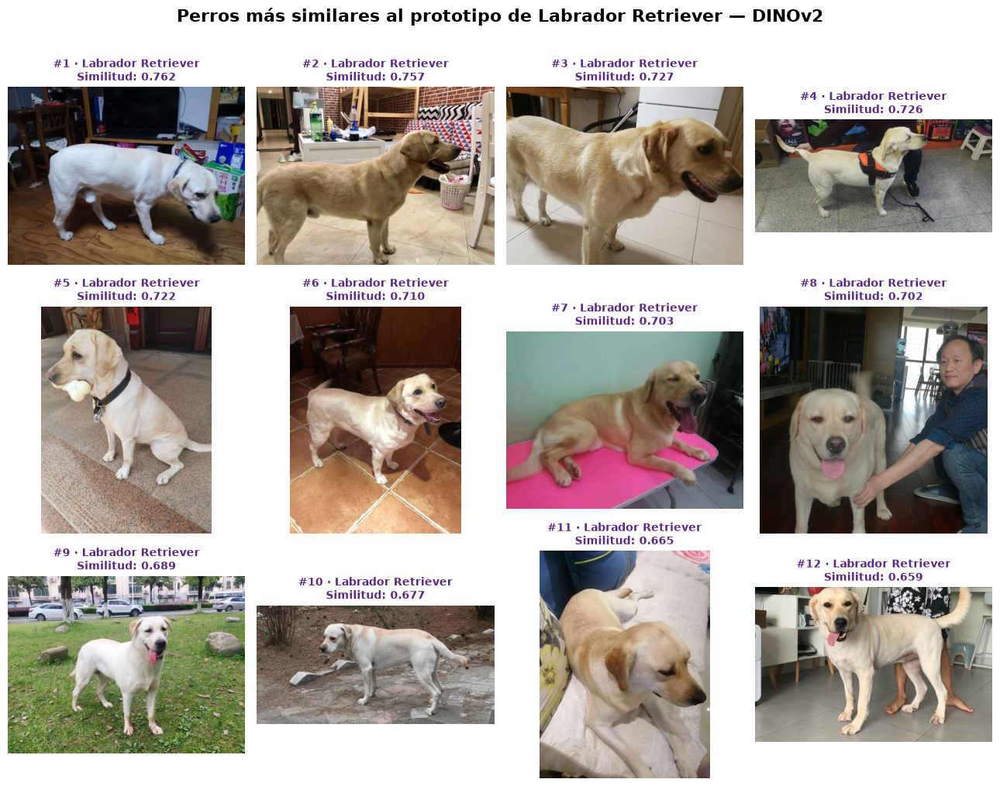

In [66]:
# Visualización del ranking DINOv2

fig, axes = plt.subplots(
    3,
    4,
    figsize=(13, 10)
)

axes = axes.flatten()


for posicion, (
    ax,
    indice
) in enumerate(
    zip(
        axes,
        top_indices_dinov2
    ),
    start=1
):

    imagen = obtener_imagen_tsinghua(
        tabla_valid_tsinghua,
        int(indice)
    )


    label_real = int(
        labels_dinov2_valid[
            indice
        ]
    )


    raza_real = (
        razas_tsinghua_df
        .loc[
            razas_tsinghua_df[
                "label"
            ] == label_real,
            "raza_display"
        ]
        .iloc[0]
    )


    similitud = float(
        similitud_busqueda_dinov2[
            indice
        ]
    )


    ax.imshow(
        imagen
    )


    ax.set_title(
        f"#{posicion} · {raza_real}\n"
        f"Similitud: {similitud:.3f}",
        fontsize=10,
        color="#5B2A86",
        fontweight="bold"
    )


    ax.axis(
        "off"
    )


plt.suptitle(
    f"Perros más similares al prototipo "
    f"de {RAZA_BUSQUEDA} — DINOv2",
    fontsize=16,
    fontweight="bold",
    y=1.01
)


plt.tight_layout()

plt.show()

### 9.2. Selección de la representación visual

La comparación por raza confirma que la ventaja de DINOv2 frente a CLIP no se concentra únicamente en unas pocas categorías. DINOv2 obtiene una Precision@10 superior en **104 de las 130 razas**, mientras que ambos métodos empatan en 17 y CLIP presenta un mejor resultado únicamente en 9 categorías.

La diferencia media de Precision@10 entre ambas representaciones es de **0,2962** a favor de DINOv2. La prueba pareada **bilateral** de Wilcoxon confirma que las distribuciones de rendimiento difieren de forma estadísticamente significativa (`p < 0,001`).

La inspección del ranking generado para Labrador Retriever refuerza además la utilidad práctica de esta representación. Las doce fotografías con mayor similitud respecto al prototipo corresponden a perros etiquetados como Labrador Retriever, mostrando una recuperación altamente coherente con la apariencia seleccionada.

En conjunto, estos resultados justifican la selección de **DINOv2 como representación visual principal** para la funcionalidad de búsqueda por raza y similitud de *Invisible Dogs*. CLIP se mantiene como referencia comparativa, pero no se considera necesario combinar ambas representaciones, dado que DINOv2 presenta una ventaja consistente en todas las métricas globales y en la mayoría de las razas analizadas.

## 10. Transferencia de los prototipos visuales a PetFinder

Una vez seleccionada DINOv2 como representación visual principal, se analiza si los prototipos construidos exclusivamente con fotografías de Tsinghua Dogs pueden utilizarse sobre perros procedentes de un conjunto de datos diferente.

Para ello se reutilizan los embeddings DINOv2 obtenidos previamente para las fotografías de PetFinder. De esta forma, tanto las representaciones de los perros disponibles como los prototipos de raza se encuentran definidos mediante la misma arquitectura visual y pueden compararse mediante similitud coseno.

Este análisis constituye una aproximación directa al comportamiento esperado de la futura aplicación *Invisible Dogs*: el usuario selecciona una raza de referencia y los perros disponibles se ordenan según su similitud visual respecto al prototipo correspondiente.

La transferencia Tsinghua Dogs → PetFinder se utiliza además como **evaluación práctica de robustez ante cambio de dominio**: no pretende caracterizar exhaustivamente todas las diferencias distribucionales entre ambos conjuntos, sino comprobar si una representación construida en una fuente mantiene utilidad de recuperación al aplicarse sobre otra fuente con condiciones fotográficas, composición y distribución distintas.

In [67]:
# Localización de los artefactos visuales de PetFinder
# generados en el Notebook 06

petfinder_visual_outputs_path = (
    outputs_path
    / "petfinder_visual"
)


petfinder_dinov2_path = (
    petfinder_visual_outputs_path
    / "petfinder_dinov2_embeddings.npz"
)


petfinder_visual_dataset_path = (
    petfinder_visual_outputs_path
    / "petfinder_visual_model_dataset.csv"
)


print(
    "Embeddings DINOv2 de PetFinder:"
)

print(
    petfinder_dinov2_path
)

print(
    "¿Existe?:",
    petfinder_dinov2_path.exists()
)


print(
    "\nDataset visual de PetFinder:"
)

print(
    petfinder_visual_dataset_path
)

print(
    "¿Existe?:",
    petfinder_visual_dataset_path.exists()
)


if not petfinder_dinov2_path.exists():

    raise FileNotFoundError(
        "No se ha encontrado el archivo de "
        "embeddings DINOv2 de PetFinder."
    )


if not petfinder_visual_dataset_path.exists():

    raise FileNotFoundError(
        "No se ha encontrado el dataset visual "
        "generado en el Notebook 06."
    )

Embeddings DINOv2 de PetFinder:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\petfinder_visual\petfinder_dinov2_embeddings.npz
¿Existe?: True

Dataset visual de PetFinder:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\petfinder_visual\petfinder_visual_model_dataset.csv
¿Existe?: True


In [68]:
# Carga de representaciones DINOv2 de PetFinder

with np.load(
    petfinder_dinov2_path,
    allow_pickle=False
) as datos_petfinder_dinov2:

    petids_petfinder_dinov2 = (
        datos_petfinder_dinov2[
            "PetID"
        ]
        .astype(str)
    )

    embeddings_petfinder_dinov2 = (
        datos_petfinder_dinov2[
            "embeddings"
        ]
        .astype(np.float32)
    )


petfinder_visual_07_df = pd.read_csv(
    petfinder_visual_dataset_path,
    encoding="utf-8-sig",
    dtype={
        "PetID": str
    }
)


print(
    "Forma de los embeddings:"
)

print(
    embeddings_petfinder_dinov2.shape
)


print(
    "\nPetID disponibles:"
)

print(
    len(
        petids_petfinder_dinov2
    )
)


print(
    "\nFilas del dataset visual:"
)

print(
    len(
        petfinder_visual_07_df
    )
)


print(
    "\nColumnas disponibles:"
)

print(
    petfinder_visual_07_df.columns.tolist()
)

Forma de los embeddings:
(7938, 384)

PetID disponibles:
7938

Filas del dataset visual:
7938

Columnas disponibles:
['PetID', 'target_adopcion_lenta', 'conjunto_petfinder', 'ruta_imagen_principal', 'numero_imagen_principal', 'PhotoAmt', 'VideoAmt', 'image_width', 'image_height', 'image_aspect_ratio']


In [69]:
# Comprobación de correspondencia PetID ↔ embeddings

petids_dataset_visual = (
    petfinder_visual_07_df[
        "PetID"
    ]
    .astype(str)
    .to_numpy()
)


coincidencia_petids = np.array_equal(
    petids_petfinder_dinov2,
    petids_dataset_visual
)


print(
    "¿Coinciden número y orden de PetID?"
)

print(
    coincidencia_petids
)


if not coincidencia_petids:

    raise ValueError(
        "Los PetID de los embeddings DINOv2 "
        "no coinciden con el dataset visual."
    )


print(
    "\nCorrespondencia validada correctamente."
)

¿Coinciden número y orden de PetID?
True

Correspondencia validada correctamente.


### 10.1. Recuperación de perros de PetFinder mediante prototipos externos

Como primera aproximación a la transferencia entre ambos conjuntos de datos, se utiliza el prototipo DINOv2 de Labrador Retriever construido exclusivamente a partir de fotografías de Tsinghua Dogs.

Este prototipo se compara mediante similitud coseno con las representaciones DINOv2 de los 7.938 perros de PetFinder que disponen de fotografía principal válida.

El objetivo de esta prueba no es determinar automáticamente la raza de los animales de PetFinder, sino comprobar si una representación visual construida sobre un conjunto externo permite recuperar perros con una apariencia compatible con la raza seleccionada.

Este procedimiento reproduce directamente una de las funcionalidades planteadas para la futura aplicación *Invisible Dogs*: el usuario selecciona una raza de referencia y los perros disponibles se ordenan según su similitud visual.

In [70]:
# Búsqueda de perros de PetFinder
# similares al prototipo de Labrador Retriever

RAZA_BUSQUEDA_PETFINDER = (
    "Labrador Retriever"
)

N_RESULTADOS_PETFINDER = 12


label_busqueda_petfinder = (
    raza_a_label_tsinghua[
        RAZA_BUSQUEDA_PETFINDER
    ]
)


prototipo_petfinder = (
    prototipos_dinov2[
        label_busqueda_petfinder
    ]
)


# ---------------------------------------------------------
# Comprobación defensiva de normalización
# ---------------------------------------------------------

normas_petfinder_dinov2 = np.linalg.norm(
    embeddings_petfinder_dinov2,
    axis=1,
    keepdims=True
)


embeddings_petfinder_busqueda = (
    embeddings_petfinder_dinov2
    / np.clip(
        normas_petfinder_dinov2,
        1e-12,
        None
    )
)


# ---------------------------------------------------------
# Similitud con el prototipo
# ---------------------------------------------------------

similitud_petfinder = (
    embeddings_petfinder_busqueda
    @ prototipo_petfinder
)


ranking_petfinder = np.argsort(
    similitud_petfinder
)[::-1]


top_indices_petfinder = (
    ranking_petfinder[
        :N_RESULTADOS_PETFINDER
    ]
)


# ---------------------------------------------------------
# Construcción del ranking
# ---------------------------------------------------------

resultados_petfinder_df = (
    petfinder_visual_07_df
    .iloc[
        top_indices_petfinder
    ]
    [
        [
            "PetID",
            "target_adopcion_lenta",
            "conjunto_petfinder",
            "ruta_imagen_principal"
        ]
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


resultados_petfinder_df.insert(
    0,
    "posicion",
    np.arange(
        1,
        N_RESULTADOS_PETFINDER + 1
    )
)


resultados_petfinder_df[
    "similitud_visual"
] = (
    similitud_petfinder[
        top_indices_petfinder
    ]
)


print(
    "Raza utilizada como referencia:"
)

print(
    RAZA_BUSQUEDA_PETFINDER
)


print(
    "\nPerros de PetFinder "
    "con mayor similitud visual:"
)


display(
    resultados_petfinder_df[
        [
            "posicion",
            "PetID",
            "similitud_visual",
            "target_adopcion_lenta",
            "conjunto_petfinder"
        ]
    ]
    .round({
        "similitud_visual": 4
    })
)

Raza utilizada como referencia:
Labrador Retriever

Perros de PetFinder con mayor similitud visual:


,posicion,PetID,similitud_visual,target_adopcion_lenta,conjunto_petfinder
0,1,b677eae2a,0.6975,1,test
1,2,9945962c3,0.6961,1,train
2,3,1d9604897,0.6958,0,train
3,4,f1164babb,0.6931,1,valid
4,5,af2f3a166,0.6917,1,train
5,6,6c121d784,0.6907,0,train
6,7,9a1be07d5,0.6895,1,test
7,8,73ab55e8c,0.6799,1,train
8,9,4a2544358,0.6779,0,valid
9,10,ba2d4e877,0.6691,0,train


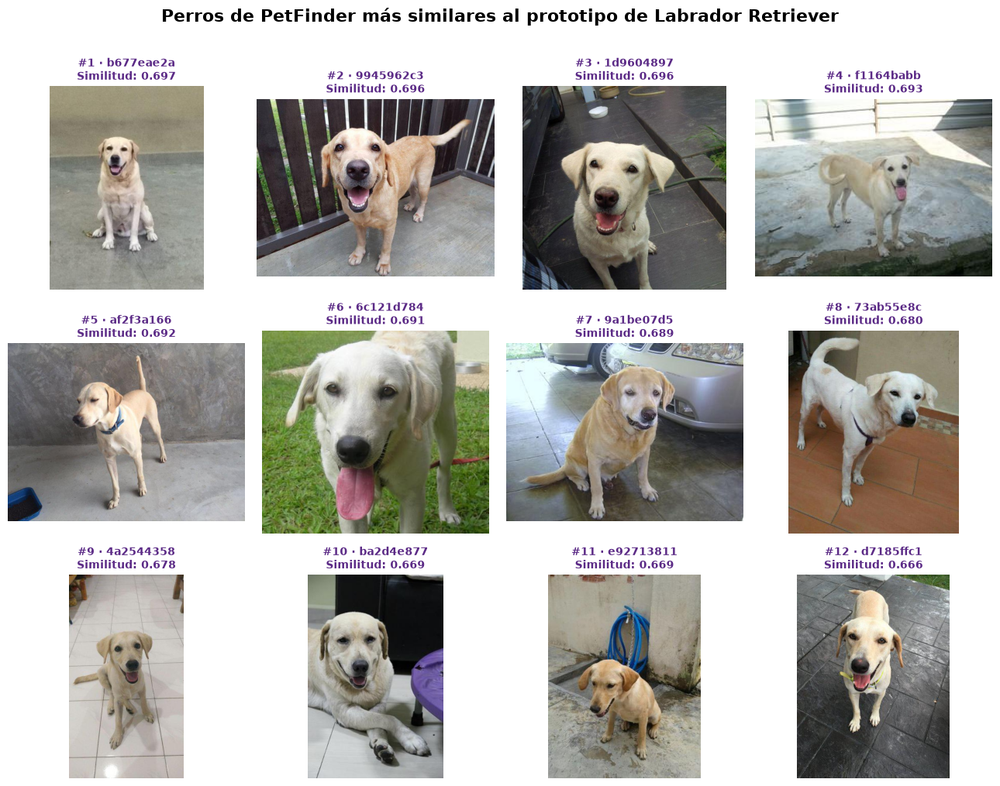

In [71]:
# Visualización del ranking Tsinghua → PetFinder

fig, axes = plt.subplots(
    3,
    4,
    figsize=(13, 10)
)


axes = axes.flatten()


for posicion, (
    ax,
    indice
) in enumerate(
    zip(
        axes,
        top_indices_petfinder
    ),
    start=1
):

    fila = (
        petfinder_visual_07_df
        .iloc[
            int(indice)
        ]
    )


    ruta_imagen = Path(
        fila[
            "ruta_imagen_principal"
        ]
    )


    with Image.open(
        ruta_imagen
    ) as img:

        imagen = (
            img
            .convert("RGB")
            .copy()
        )


    similitud = float(
        similitud_petfinder[
            indice
        ]
    )


    ax.imshow(
        imagen
    )


    ax.set_title(
        f"#{posicion} · {fila['PetID']}\n"
        f"Similitud: {similitud:.3f}",
        fontsize=10,
        color="#5B2A86",
        fontweight="bold"
    )


    ax.axis(
        "off"
    )


plt.suptitle(
    "Perros de PetFinder más similares al "
    f"prototipo de {RAZA_BUSQUEDA_PETFINDER}",
    fontsize=16,
    fontweight="bold",
    y=1.01
)


plt.tight_layout()

plt.show()

### 10.2. Primera evidencia de transferencia entre Tsinghua Dogs y PetFinder

La recuperación obtenida mediante el prototipo de Labrador Retriever muestra una elevada coherencia visual entre los primeros resultados de PetFinder. Aunque el prototipo fue construido exclusivamente con fotografías de Tsinghua Dogs, las imágenes recuperadas presentan características morfológicas compatibles con la apariencia de un Labrador Retriever.

Este resultado aporta una primera evidencia de que las representaciones DINOv2 permiten transferir la búsqueda visual entre conjuntos de datos procedentes de fuentes diferentes.

Debe señalarse que los valores mostrados corresponden a **similitud coseno entre embeddings** y no deben interpretarse como probabilidades de pertenencia a una raza. Asimismo, las similitudes absolutas pueden verse afectadas por las diferencias existentes entre ambos dominios fotográficos.

La utilidad práctica de este procedimiento se evaluará a continuación utilizando las etiquetas de raza disponibles en PetFinder, lo que permitirá comprobar si los perros recuperados corresponden efectivamente a Labrador Retriever o a categorías visualmente relacionadas.

In [72]:
# Localización de los archivos originales de PetFinder

petfinder_raw_path = (
    data_path
    / "raw_petfinder"
)


if not petfinder_raw_path.exists():

    raise FileNotFoundError(
        "No se ha localizado la carpeta "
        "data/raw_petfinder."
    )


# ---------------------------------------------------------
# Localización robusta de train.csv
# ---------------------------------------------------------

train_candidates = list(
    petfinder_raw_path.rglob(
        "train.csv"
    )
)


petfinder_train_path = None


for candidato in train_candidates:

    columnas = pd.read_csv(
        candidato,
        nrows=0
    ).columns

    if {
        "PetID",
        "Breed1",
        "Breed2"
    }.issubset(
        columnas
    ):

        petfinder_train_path = (
            candidato
        )

        break


if petfinder_train_path is None:

    raise FileNotFoundError(
        "No se ha localizado el train.csv "
        "original de PetFinder."
    )


# ---------------------------------------------------------
# Localización de breed_labels.csv
# ---------------------------------------------------------

breed_candidates = list(
    petfinder_raw_path.rglob(
        "breed_labels.csv"
    )
)


if len(breed_candidates) == 0:

    raise FileNotFoundError(
        "No se ha localizado "
        "breed_labels.csv."
    )


petfinder_breed_labels_path = (
    breed_candidates[0]
)


print(
    "Train de PetFinder:"
)

print(
    petfinder_train_path
)


print(
    "\nEtiquetas de raza:"
)

print(
    petfinder_breed_labels_path
)

Train de PetFinder:
G:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_petfinder\train\train.csv

Etiquetas de raza:
G:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_petfinder\breed_labels.csv


In [73]:
# Recuperación de las razas registradas en PetFinder

petfinder_razas_base_df = pd.read_csv(
    petfinder_train_path,
    usecols=[
        "PetID",
        "Breed1",
        "Breed2"
    ],
    dtype={
        "PetID": str
    }
)


breed_labels_petfinder_df = pd.read_csv(
    petfinder_breed_labels_path
)


# ---------------------------------------------------------
# Raza principal
# ---------------------------------------------------------

raza_principal_df = (
    breed_labels_petfinder_df[
        [
            "BreedID",
            "BreedName"
        ]
    ]
    .rename(
        columns={
            "BreedID": "Breed1",
            "BreedName": "raza_principal"
        }
    )
)


# ---------------------------------------------------------
# Raza secundaria
# ---------------------------------------------------------

raza_secundaria_df = (
    breed_labels_petfinder_df[
        [
            "BreedID",
            "BreedName"
        ]
    ]
    .rename(
        columns={
            "BreedID": "Breed2",
            "BreedName": "raza_secundaria"
        }
    )
)


petfinder_razas_base_df = (
    petfinder_razas_base_df
    .merge(
        raza_principal_df,
        on="Breed1",
        how="left",
        validate="many_to_one"
    )
    .merge(
        raza_secundaria_df,
        on="Breed2",
        how="left",
        validate="many_to_one"
    )
)


# Breed2 = 0 representa ausencia de segunda raza
petfinder_razas_base_df.loc[
    petfinder_razas_base_df[
        "Breed2"
    ] == 0,
    "raza_secundaria"
] = np.nan


print(
    "Perros con información de raza:"
)

print(
    len(
        petfinder_razas_base_df
    )
)


print(
    "\nPrimeras filas:"
)

display(
    petfinder_razas_base_df
    .head()
)

Perros con información de raza:
14993

Primeras filas:


,Breed1,Breed2,PetID,raza_principal,raza_secundaria
0,299,0,86e1089a3,Tabby,NaN
1,265,0,6296e909a,Domestic Medium Hair,NaN
2,307,0,3422e4906,Mixed Breed,NaN
3,307,0,5842f1ff5,Mixed Breed,NaN
4,307,0,850a43f90,Mixed Breed,NaN


In [74]:
# Incorporación de las razas al ranking visual

resultados_petfinder_razas_df = (
    resultados_petfinder_df
    .merge(
        petfinder_razas_base_df,
        on="PetID",
        how="left",
        validate="one_to_one"
    )
)


display(
    resultados_petfinder_razas_df[
        [
            "posicion",
            "PetID",
            "similitud_visual",
            "raza_principal",
            "raza_secundaria",
            "target_adopcion_lenta"
        ]
    ]
    .round({
        "similitud_visual": 4
    })
)

,posicion,PetID,similitud_visual,raza_principal,raza_secundaria,target_adopcion_lenta
0,1,b677eae2a,0.6975,Labrador Retriever,Labrador Retriever,1
1,2,9945962c3,0.6961,Labrador Retriever,Labrador Retriever,1
2,3,1d9604897,0.6958,Labrador Retriever,NaN,0
3,4,f1164babb,0.6931,Mixed Breed,NaN,1
4,5,af2f3a166,0.6917,Labrador Retriever,Mixed Breed,1
5,6,6c121d784,0.6907,Labrador Retriever,NaN,0
6,7,9a1be07d5,0.6895,Labrador Retriever,NaN,1
7,8,73ab55e8c,0.6799,Mixed Breed,NaN,1
8,9,4a2544358,0.6779,Labrador Retriever,NaN,0
9,10,ba2d4e877,0.6691,Labrador Retriever,NaN,0


### 10.3. Correspondencia con las razas registradas en PetFinder

La incorporación de las etiquetas originales de PetFinder permite evaluar de forma más objetiva la transferencia del prototipo de Labrador Retriever construido con Tsinghua Dogs.

Entre los doce perros con mayor similitud visual, ocho presentan `Labrador Retriever` como raza principal y un noveno animal lo incluye como raza secundaria. Por tanto, **9 de los 12 primeros resultados (75 %) contienen explícitamente Labrador Retriever entre sus etiquetas registradas**.

Los tres perros restantes están clasificados como `Mixed Breed`. La inspección visual muestra, no obstante, una apariencia compatible con el prototipo utilizado como consulta. Este resultado es relevante porque las etiquetas disponibles en PetFinder no constituyen necesariamente una descripción exhaustiva de la composición racial de los animales mestizos.

En consecuencia, la evaluación mediante coincidencia exacta de etiquetas debe interpretarse de forma conservadora. Para la futura aplicación *Invisible Dogs*, el objetivo no será determinar de manera rígida la raza del perro, sino recuperar animales cuya apariencia sea compatible con las preferencias visuales indicadas por el adoptante.

El resultado obtenido proporciona una primera evidencia de que los prototipos DINOv2 construidos a partir de Tsinghua Dogs pueden transferirse a fotografías de PetFinder y generar rankings visualmente coherentes.

In [75]:
# Evaluación del ranking Labrador Retriever sobre PetFinder

raza_objetivo_normalizada = (
    RAZA_BUSQUEDA_PETFINDER
    .strip()
    .lower()
)


coincide_raza_principal = (
    resultados_petfinder_razas_df[
        "raza_principal"
    ]
    .fillna("")
    .str.strip()
    .str.lower()
    == raza_objetivo_normalizada
)


coincide_raza_secundaria = (
    resultados_petfinder_razas_df[
        "raza_secundaria"
    ]
    .fillna("")
    .str.strip()
    .str.lower()
    == raza_objetivo_normalizada
)


resultados_petfinder_razas_df[
    "coincidencia_labrador"
] = (
    coincide_raza_principal
    | coincide_raza_secundaria
)


n_coincidencias_labrador = int(
    resultados_petfinder_razas_df[
        "coincidencia_labrador"
    ].sum()
)


precision_labrador_top12 = (
    n_coincidencias_labrador
    / len(
        resultados_petfinder_razas_df
    )
)


print(
    "Resultados evaluados:"
)

print(
    len(
        resultados_petfinder_razas_df
    )
)


print(
    "\nCon Labrador Retriever "
    "como raza principal o secundaria:"
)

print(
    n_coincidencias_labrador
)


print(
    "\nPrecision@12 basada en etiquetas:"
)

print(
    f"{precision_labrador_top12:.4f}"
)


print(
    "\nPerros con Mixed Breed "
    "como raza principal:"
)

print(
    (
        resultados_petfinder_razas_df[
            "raza_principal"
        ]
        == "Mixed Breed"
    ).sum()
)

Resultados evaluados:
12

Con Labrador Retriever como raza principal o secundaria:
9

Precision@12 basada en etiquetas:
0.7500

Perros con Mixed Breed como raza principal:
4


In [76]:
# Función para normalizar nombres de raza
# entre Tsinghua Dogs y PetFinder

import unicodedata
import re


def normalizar_nombre_raza(
    nombre
):

    if pd.isna(nombre):
        return ""

    nombre = str(
        nombre
    ).strip().lower()

    nombre = (
        unicodedata.normalize(
            "NFKD",
            nombre
        )
        .encode(
            "ascii",
            "ignore"
        )
        .decode(
            "utf-8"
        )
    )

    nombre = nombre.replace(
        "-",
        " "
    )

    nombre = re.sub(
        r"\s+",
        " ",
        nombre
    )

    return nombre.strip()

In [77]:
# Catálogo de razas disponible en PetFinder

razas_petfinder_catalogo_df = (
    breed_labels_petfinder_df[
        [
            "BreedID",
            "BreedName"
        ]
    ]
    .copy()
)


# ---------------------------------------------------------
# Normalización de los nombres de PetFinder
# ---------------------------------------------------------

razas_petfinder_catalogo_df[
    "raza_normalizada"
] = (
    razas_petfinder_catalogo_df[
        "BreedName"
    ]
    .apply(
        normalizar_nombre_raza
    )
)


# ---------------------------------------------------------
# Catálogo de razas de Tsinghua Dogs
# ---------------------------------------------------------

razas_tsinghua_mapping_df = (
    razas_tsinghua_df[
        [
            "label",
            "raza_display"
        ]
    ]
    .copy()
)


razas_tsinghua_mapping_df[
    "raza_normalizada"
] = (
    razas_tsinghua_mapping_df[
        "raza_display"
    ]
    .apply(
        normalizar_nombre_raza
    )
)


# ---------------------------------------------------------
# Correspondencias directas entre ambos catálogos
# ---------------------------------------------------------

mapeo_directo_razas_df = (
    razas_tsinghua_mapping_df
    .merge(
        razas_petfinder_catalogo_df,
        on="raza_normalizada",
        how="inner",
        validate="one_to_one"
    )
    .sort_values(
        "raza_display"
    )
    .reset_index(
        drop=True
    )
)


# ---------------------------------------------------------
# Comprobaciones
# ---------------------------------------------------------

print(
    "Razas de Tsinghua:"
)

print(
    len(
        razas_tsinghua_mapping_df
    )
)


print(
    "\nRazas disponibles en PetFinder:"
)

print(
    len(
        razas_petfinder_catalogo_df
    )
)


print(
    "\nRazas con correspondencia directa "
    "en PetFinder:"
)

print(
    len(
        mapeo_directo_razas_df
    )
)


print(
    "\nPorcentaje de razas de Tsinghua "
    "con correspondencia directa:"
)

print(
    f"{len(mapeo_directo_razas_df) / len(razas_tsinghua_mapping_df) * 100:.2f}%"
)


print(
    "\nCorrespondencias identificadas:"
)


display(
    mapeo_directo_razas_df[
        [
            "label",
            "raza_display",
            "BreedID",
            "BreedName"
        ]
    ]
)

Razas de Tsinghua:
130

Razas disponibles en PetFinder:
307

Razas con correspondencia directa en PetFinder:
75

Porcentaje de razas de Tsinghua con correspondencia directa:
57.69%

Correspondencias identificadas:


,label,raza_display,BreedID,BreedName
0,7,Affenpinscher,1,Affenpinscher
1,63,Afghan Hound,2,Afghan Hound
2,51,American Staffordshire Terrier,10,American Staffordshire Terrier
3,101,Australian Shepherd,16,Australian Shepherd
4,9,Australian Terrier,17,Australian Terrier
5,100,Basenji,18,Basenji
6,111,Beagle,20,Beagle
7,45,Bedlington Terrier,23,Bedlington Terrier
8,42,Bernese Mountain Dog,28,Bernese Mountain Dog
9,115,Bichon Frise,29,Bichon Frise


### 10.4. Validación externa global de la búsqueda visual

La correspondencia directa entre los catálogos de Tsinghua Dogs y PetFinder permite identificar **75 correspondencias nominales** con una denominación equivalente en ambos conjuntos de datos. Sin embargo, una correspondencia de catálogo no implica necesariamente que exista al menos un perro de esa raza entre las 7.938 fotografías de PetFinder utilizadas en este análisis.

Esta intersección permite ampliar la evaluación más allá del ejemplo individual de Labrador Retriever. Para cada correspondencia se utiliza el prototipo DINOv2 construido exclusivamente con fotografías de Tsinghua Dogs y se ordenan los perros de PetFinder según su similitud visual.

Se considera una coincidencia cuando la raza buscada aparece como raza principal o secundaria en PetFinder.

Dado que el número de perros disponibles varía considerablemente entre razas, las métricas Precision@K se interpretan teniendo en cuenta el soporte de cada categoría. Se distingue entre las correspondencias nominales, las razas con al menos un ejemplo disponible y las razas con soporte suficiente para el valor de K analizado. La comparación principal se realiza sobre las categorías con al menos 20 perros, manteniendo el mismo conjunto de razas para Precision@5, Precision@10 y Precision@20.

In [78]:
# Asociación de las razas originales con los 7.938 perros visuales

petfinder_evaluacion_razas_df = (
    petfinder_visual_07_df[
        [
            "PetID"
        ]
    ]
    .merge(
        petfinder_razas_base_df,
        on="PetID",
        how="left",
        validate="one_to_one"
    )
)


print(
    "Perros disponibles para evaluación:"
)

print(
    len(
        petfinder_evaluacion_razas_df
    )
)


print(
    "\nCon raza principal disponible:"
)

print(
    petfinder_evaluacion_razas_df[
        "raza_principal"
    ]
    .notna()
    .sum()
)

Perros disponibles para evaluación:
7938

Con raza principal disponible:
7935


In [79]:
# Validación externa de los prototipos DINOv2
# sobre las correspondencias entre Tsinghua Dogs y PetFinder

K_EXTERNOS = [
    5,
    10,
    20
]


resultados_transferencia = []


for fila in (
    mapeo_directo_razas_df
    .itertuples(index=False)
):

    label_tsinghua = int(
        fila.label
    )

    breed_id_petfinder = int(
        fila.BreedID
    )

    positivos = (
        (
            petfinder_evaluacion_razas_df[
                "Breed1"
            ] == breed_id_petfinder
        )
        |
        (
            petfinder_evaluacion_razas_df[
                "Breed2"
            ] == breed_id_petfinder
        )
    )

    positivos = (
        positivos
        .fillna(False)
        .to_numpy(dtype=bool)
    )

    soporte = int(
        positivos.sum()
    )

    prototipo = (
        prototipos_dinov2[
            label_tsinghua
        ]
    )

    similitudes = (
        embeddings_petfinder_busqueda
        @ prototipo
    )

    ranking = np.argsort(
        similitudes
    )[::-1]

    resultado = {
        "label_tsinghua": label_tsinghua,
        "raza_tsinghua": fila.raza_display,
        "BreedID": breed_id_petfinder,
        "raza_petfinder": fila.BreedName,
        "soporte_petfinder": soporte
    }

    for k in K_EXTERNOS:

        top_k = ranking[:k]

        n_aciertos = int(
            positivos[top_k].sum()
        )

        resultado[f"aciertos_at_{k}"] = (
            n_aciertos
        )

        resultado[f"precision_at_{k}"] = (
            n_aciertos / k
        )

        resultado[f"hit_at_{k}"] = int(
            n_aciertos > 0
        )

        resultado[f"recall_at_{k}"] = (
            n_aciertos / soporte
            if soporte > 0
            else np.nan
        )

    resultados_transferencia.append(
        resultado
    )


transferencia_tsinghua_petfinder_df = pd.DataFrame(
    resultados_transferencia
)


if not (
    (
        transferencia_tsinghua_petfinder_df[
            "hit_at_5"
        ]
        <= transferencia_tsinghua_petfinder_df[
            "hit_at_10"
        ]
    )
    &
    (
        transferencia_tsinghua_petfinder_df[
            "hit_at_10"
        ]
        <= transferencia_tsinghua_petfinder_df[
            "hit_at_20"
        ]
    )
).all():
    raise ValueError(
        "La propiedad Hit@5 <= Hit@10 <= Hit@20 "
        "no se cumple. Revisar los rankings."
    )


n_correspondencias_nominales = len(
    transferencia_tsinghua_petfinder_df
)

n_razas_con_soporte = int(
    (
        transferencia_tsinghua_petfinder_df[
            "soporte_petfinder"
        ] > 0
    ).sum()
)


print("Correspondencias nominales analizadas:")
print(n_correspondencias_nominales)

print("\nRazas con al menos un perro en PetFinder:")
print(n_razas_con_soporte)

print("\nResumen del soporte en PetFinder:")
display(
    transferencia_tsinghua_petfinder_df[
        "soporte_petfinder"
    ]
    .describe()
    .round(2)
)

print("\nComprobación Hit@5 <= Hit@10 <= Hit@20:")
print(True)

Correspondencias nominales analizadas:
75

Razas con al menos un perro en PetFinder:
40

Resumen del soporte en PetFinder:


count     75.00
mean      17.07
std       46.78
min        0.00
25%        0.00
50%        1.00
75%        6.00
max      274.00
Name: soporte_petfinder, dtype: float64


Comprobación Hit@5 <= Hit@10 <= Hit@20:
True


In [80]:
# Resumen de la validación externa

resumen_transferencia = []


razas_soporte_positivo = (
    transferencia_tsinghua_petfinder_df.loc[
        transferencia_tsinghua_petfinder_df[
            "soporte_petfinder"
        ] > 0
    ]
)


for k in K_EXTERNOS:

    comparables = (
        transferencia_tsinghua_petfinder_df.loc[
            transferencia_tsinghua_petfinder_df[
                "soporte_petfinder"
            ] >= k
        ]
    )

    resumen_transferencia.append({
        "K": k,
        "n_correspondencias": len(
            transferencia_tsinghua_petfinder_df
        ),
        "n_razas_soporte_positivo": len(
            razas_soporte_positivo
        ),
        "precision_soporte_positivo": (
            razas_soporte_positivo[
                f"precision_at_{k}"
            ].mean()
            if len(razas_soporte_positivo) > 0
            else np.nan
        ),
        "hit_rate_soporte_positivo": (
            razas_soporte_positivo[
                f"hit_at_{k}"
            ].mean()
            if len(razas_soporte_positivo) > 0
            else np.nan
        ),
        "n_razas_comparables": len(
            comparables
        ),
        "precision_comparables": (
            comparables[
                f"precision_at_{k}"
            ].mean()
            if len(comparables) > 0
            else np.nan
        )
    })


resumen_transferencia_df = pd.DataFrame(
    resumen_transferencia
)


display(
    resumen_transferencia_df
    .round(4)
)

,K,n_correspondencias,n_razas_soporte_positivo,precision_soporte_positivo,hit_rate_soporte_positivo,n_razas_comparables,precision_comparables
0,5,75,40,0.335,0.575,23,0.5130
1,10,75,40,0.300,0.575,15,0.7200
2,20,75,40,0.255,0.600,13,0.7038


In [81]:
# Comparación homogénea sobre razas
# con al menos 20 perros disponibles

razas_soporte_20 = (
    transferencia_tsinghua_petfinder_df.loc[
        transferencia_tsinghua_petfinder_df[
            "soporte_petfinder"
        ] >= 20
    ]
    .copy()
)


print(
    "Razas con al menos 20 perros:"
)

print(
    len(
        razas_soporte_20
    )
)


print(
    "\nPrecision@5:"
)

print(
    f"{razas_soporte_20['precision_at_5'].mean():.4f}"
)


print(
    "\nPrecision@10:"
)

print(
    f"{razas_soporte_20['precision_at_10'].mean():.4f}"
)


print(
    "\nPrecision@20:"
)

print(
    f"{razas_soporte_20['precision_at_20'].mean():.4f}"
)


print(
    "\nHit Rate@5:"
)

print(
    f"{razas_soporte_20['hit_at_5'].mean():.4f}"
)


print(
    "\nHit Rate@10:"
)

print(
    f"{razas_soporte_20['hit_at_10'].mean():.4f}"
)


print(
    "\nHit Rate@20:"
)

print(
    f"{razas_soporte_20['hit_at_20'].mean():.4f}"
)

Razas con al menos 20 perros:
13

Precision@5:
0.7846

Precision@10:
0.7923

Precision@20:
0.7038

Hit Rate@5:
1.0000

Hit Rate@10:
1.0000

Hit Rate@20:
1.0000


#### 10.4.1. Consideraciones sobre la validación externa

La evaluación externa debe interpretarse teniendo en cuenta la distribución de razas existente en PetFinder. Aunque se identificaron 75 correspondencias nominales entre los catálogos de Tsinghua Dogs y PetFinder, algunas de estas categorías no cuentan con perros disponibles entre las fotografías utilizadas y el soporte de las restantes es muy desigual.

La mediana de soporte es únicamente de un perro por raza, mientras que determinadas categorías disponen de varias decenas o incluso centenares de observaciones. Esta característica impide interpretar de forma equivalente la Precision@K de todas las categorías. Por ejemplo, una raza representada mediante tres perros nunca podría alcanzar una Precision@10 superior a 0,30 aunque los tres animales aparecieran en las primeras posiciones.

Por este motivo, se diferencia explícitamente entre correspondencias de catálogo, razas con soporte positivo y categorías con un número suficiente de ejemplos para el valor de K considerado. Adicionalmente, se realiza una comparación homogénea sobre las razas con al menos veinte perros, utilizando el mismo conjunto de categorías para Precision@5, Precision@10 y Precision@20.

Esta estrategia permite separar las limitaciones derivadas de la disponibilidad de datos de aquellas asociadas al comportamiento real del buscador visual.

### 10.5. Caso representativo de transferencia: Shih Tzu

Como ejemplo principal del funcionamiento de la búsqueda visual se selecciona **Shih Tzu**, una de las razas con mejor comportamiento durante la validación externa.

PetFinder contiene 200 perros etiquetados con esta raza y el prototipo DINOv2 alcanza una **Precision@5, Precision@10 y Precision@20 iguales a 1,00**. Este soporte elevado permite utilizar el caso como ejemplo ilustrativo sin depender de una categoría con muy pocas observaciones.

El ejemplo complementa el análisis previo de Labrador Retriever —utilizado para introducir la transferencia entre fuentes— y permite comprobar visualmente si la elevada precisión cuantitativa se corresponde también con una recuperación coherente desde el punto de vista de la apariencia.

In [82]:
# Caso de alta precisión: Shih Tzu

RAZA_EJEMPLO_EXTERNO = (
    "Shih Tzu"
)

N_RESULTADOS_EJEMPLO = 12


label_ejemplo_externo = (
    raza_a_label_tsinghua[
        RAZA_EJEMPLO_EXTERNO
    ]
)


prototipo_ejemplo_externo = (
    prototipos_dinov2[
        label_ejemplo_externo
    ]
)


similitud_ejemplo_externo = (
    embeddings_petfinder_busqueda
    @ prototipo_ejemplo_externo
)


ranking_ejemplo_externo = np.argsort(
    similitud_ejemplo_externo
)[::-1]


top_indices_ejemplo_externo = (
    ranking_ejemplo_externo[
        :N_RESULTADOS_EJEMPLO
    ]
)


resultados_ejemplo_externo_df = (
    petfinder_evaluacion_razas_df
    .iloc[
        top_indices_ejemplo_externo
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


resultados_ejemplo_externo_df.insert(
    0,
    "posicion",
    np.arange(
        1,
        N_RESULTADOS_EJEMPLO + 1
    )
)


resultados_ejemplo_externo_df[
    "similitud_visual"
] = (
    similitud_ejemplo_externo[
        top_indices_ejemplo_externo
    ]
)


display(
    resultados_ejemplo_externo_df[
        [
            "posicion",
            "PetID",
            "similitud_visual",
            "raza_principal",
            "raza_secundaria"
        ]
    ]
    .round({
        "similitud_visual": 4
    })
)

,posicion,PetID,similitud_visual,raza_principal,raza_secundaria
0,1,daa73505c,0.8067,Shih Tzu,NaN
1,2,cfb8b6b93,0.7848,Shih Tzu,NaN
2,3,ddc628647,0.7836,Shih Tzu,NaN
3,4,4d767b639,0.7762,Shih Tzu,NaN
4,5,7bce76c66,0.7681,Shih Tzu,NaN
5,6,f0ee32b27,0.7659,Shih Tzu,NaN
6,7,a0c15424b,0.7534,Shih Tzu,Shih Tzu
7,8,5943167f1,0.7512,Shih Tzu,NaN
8,9,290c3cd9e,0.7509,Shih Tzu,NaN
9,10,e99c4a55d,0.7495,Shih Tzu,NaN


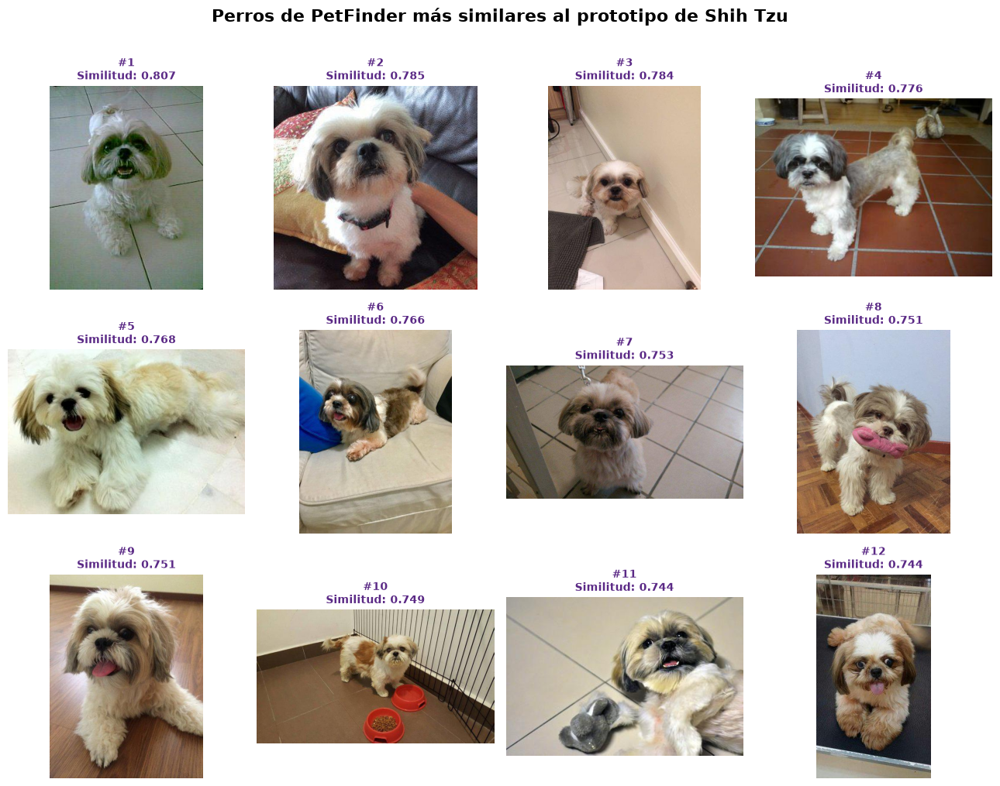

In [83]:
# Visualización del caso Shih Tzu

fig, axes = plt.subplots(
    3,
    4,
    figsize=(13, 10)
)

axes = axes.flatten()


for posicion, (
    ax,
    indice
) in enumerate(
    zip(
        axes,
        top_indices_ejemplo_externo
    ),
    start=1
):

    fila = (
        petfinder_visual_07_df
        .iloc[
            int(indice)
        ]
    )


    with Image.open(
        Path(
            fila[
                "ruta_imagen_principal"
            ]
        )
    ) as img:

        imagen = (
            img
            .convert("RGB")
            .copy()
        )


    similitud = float(
        similitud_ejemplo_externo[
            indice
        ]
    )


    ax.imshow(
        imagen
    )

    ax.set_title(
        f"#{posicion}\n"
        f"Similitud: {similitud:.3f}",
        fontsize=10,
        color="#5B2A86",
        fontweight="bold"
    )

    ax.axis(
        "off"
    )


plt.suptitle(
    "Perros de PetFinder más similares "
    "al prototipo de Shih Tzu",
    fontsize=16,
    fontweight="bold",
    y=1.01
)


plt.tight_layout()

plt.show()

### 10.6. Incorporación del score complementario de riesgo de adopción lenta (PetFinder) al ranking visual

La similitud visual y el riesgo de adopción lenta representan dos dimensiones diferentes dentro de *Invisible Dogs*.

La primera permite recuperar perros cuya apariencia es compatible con las preferencias indicadas por el adoptante. La segunda procede del modelo complementario desarrollado previamente sobre PetFinder y estima el riesgo asociado a una adopción lenta.

En este notebook se reutiliza concretamente la variable `prob_adopcion_lenta_petfinder_final` generada en el Notebook 05. Por claridad metodológica, este valor se interpreta como **score complementario de riesgo de adopción lenta en PetFinder** y como aproximación al componente de riesgo que podría mostrarse en la futura aplicación; no se equipara al score principal del proyecto basado en el conjunto de datos de Austin.

Ambas fuentes de información se presentan conjuntamente, pero **no se combinan en una única puntuación**. El orden del ranking continúa estando determinado exclusivamente por la similitud visual, mientras que el score de riesgo se incorpora como información adicional asociada a cada perro.

Este planteamiento permite que un usuario que busca una determinada apariencia pueda identificar, entre los animales visualmente compatibles, aquellos que presentan un mayor riesgo estimado de permanecer durante más tiempo esperando una adopción.

In [84]:
# Carga del score complementario de riesgo de adopción lenta (PetFinder) generado en el Notebook 05

petfinder_scored_path = (
    processed_data_path
    / "petfinder_dogs_enriched_scored.csv"
)


if not petfinder_scored_path.exists():

    raise FileNotFoundError(
        "No se ha encontrado el archivo "
        "petfinder_dogs_enriched_scored.csv."
    )


petfinder_scored_07_df = pd.read_csv(
    petfinder_scored_path,
    encoding="utf-8-sig",
    dtype={
        "PetID": str
    }
)


columnas_score_necesarias = [
    "PetID",
    "prob_adopcion_lenta_petfinder_final",
    "pred_adopcion_lenta_petfinder_final",
    "origen_score_petfinder_final"
]


columnas_faltantes = [
    columna
    for columna
    in columnas_score_necesarias
    if columna
    not in petfinder_scored_07_df.columns
]


if len(
    columnas_faltantes
) > 0:

    raise ValueError(
        "Faltan columnas necesarias en "
        "el dataset puntuado:\n"
        f"{columnas_faltantes}"
    )


print(
    "Perros con score complementario de riesgo de adopción lenta (PetFinder):"
)

print(
    len(
        petfinder_scored_07_df
    )
)


print(
    "\nPetID únicos:"
)

print(
    petfinder_scored_07_df[
        "PetID"
    ].nunique()
)


print(
    "\nOrigen de los scores:"
)


display(
    petfinder_scored_07_df[
        "origen_score_petfinder_final"
    ]
    .value_counts(
        dropna=False
    )
    .rename(
        "n_perros"
    )
    .to_frame()
)


print(
    "\nResumen del score complementario de riesgo de adopción lenta (PetFinder):"
)


display(
    petfinder_scored_07_df[
        "prob_adopcion_lenta_petfinder_final"
    ]
    .describe()
    .round(4)
)

Perros con score complementario de riesgo de adopción lenta (PetFinder):
8132

PetID únicos:
8132

Origen de los scores:


,n_perros
origen_score_petfinder_final,
OOF desarrollo,6505
Test fuera de muestra,1627



Resumen del score complementario de riesgo de adopción lenta (PetFinder):


count    8132.0000
mean        0.5350
std         0.1465
min         0.1621
25%         0.4231
50%         0.5271
75%         0.6481
max         0.9170
Name: prob_adopcion_lenta_petfinder_final, dtype: float64

In [85]:
# Comprobación de cobertura del score complementario de riesgo de adopción lenta (PetFinder)
# sobre el conjunto visual utilizado en este notebook

petids_visuales = set(
    petfinder_visual_07_df[
        "PetID"
    ]
    .astype(str)
)


petids_con_score = set(
    petfinder_scored_07_df[
        "PetID"
    ]
    .astype(str)
)


petids_sin_score = (
    petids_visuales
    - petids_con_score
)


print(
    "Perros del conjunto visual:"
)

print(
    len(
        petids_visuales
    )
)


print(
    "\nPerros con score disponible:"
)

print(
    len(
        petids_visuales
        .intersection(
            petids_con_score
        )
    )
)


print(
    "\nPerros visuales sin score:"
)

print(
    len(
        petids_sin_score
    )
)


print(
    "\nCobertura:"
)

print(
    f"{len(petids_visuales.intersection(petids_con_score)) / len(petids_visuales) * 100:.2f}%"
)

Perros del conjunto visual:
7938

Perros con score disponible:
7938

Perros visuales sin score:
0

Cobertura:
100.00%


In [86]:
# Incorporación del score complementario de riesgo de adopción lenta (PetFinder)
# a los perros utilizados en la búsqueda visual

columnas_score_07 = [
    "PetID",
    "prob_adopcion_lenta_petfinder_final",
    "pred_adopcion_lenta_petfinder_final",
    "origen_score_petfinder_final"
]


petfinder_busqueda_final_df = (
    petfinder_visual_07_df
    .merge(
        petfinder_scored_07_df[
            columnas_score_07
        ],
        on="PetID",
        how="left",
        validate="one_to_one"
    )
)


print(
    "Dimensiones del dataset enriquecido:"
)

print(
    petfinder_busqueda_final_df.shape
)


print(
    "\nScores ausentes:"
)

print(
    petfinder_busqueda_final_df[
        "prob_adopcion_lenta_petfinder_final"
    ]
    .isna()
    .sum()
)


print(
    "\nPredicciones ausentes:"
)

print(
    petfinder_busqueda_final_df[
        "pred_adopcion_lenta_petfinder_final"
    ]
    .isna()
    .sum()
)

Dimensiones del dataset enriquecido:
(7938, 13)

Scores ausentes:
0

Predicciones ausentes:
0


#### 10.6.1. Estratificación descriptiva del riesgo

Para facilitar la interpretación del score en una futura interfaz se define adicionalmente una clasificación descriptiva en tres niveles: bajo, medio y alto.

Los puntos de corte se obtienen a partir de los terciles de la distribución de scores generados fuera de muestra sobre el conjunto de desarrollo (`OOF desarrollo`). De esta forma, el conjunto de test no interviene en la definición de los niveles.

Esta clasificación se utiliza exclusivamente como recurso de presentación. El valor continuo del *score complementario de riesgo de adopción lenta (PetFinder)* se conserva como referencia principal y los niveles no deben interpretarse como categorías absolutas de probabilidad.

In [87]:
# Definición de niveles relativos de riesgo
# utilizando únicamente scores OOF de desarrollo

scores_desarrollo_oof = (
    petfinder_scored_07_df.loc[
        petfinder_scored_07_df[
            "origen_score_petfinder_final"
        ] == "OOF desarrollo",
        "prob_adopcion_lenta_petfinder_final"
    ]
    .dropna()
)


if len(
    scores_desarrollo_oof
) == 0:

    raise ValueError(
        "No se han encontrado scores "
        "correspondientes a 'OOF desarrollo'."
    )


umbral_riesgo_bajo = float(
    scores_desarrollo_oof.quantile(
        1 / 3
    )
)


umbral_riesgo_alto = float(
    scores_desarrollo_oof.quantile(
        2 / 3
    )
)


print(
    "Umbral Bajo → Medio:"
)

print(
    f"{umbral_riesgo_bajo:.4f}"
)


print(
    "\nUmbral Medio → Alto:"
)

print(
    f"{umbral_riesgo_alto:.4f}"
)

Umbral Bajo → Medio:
0.4583

Umbral Medio → Alto:
0.6051


In [88]:
# Asignación del nivel relativo de riesgo

def clasificar_riesgo_relativo(
    score
):

    if pd.isna(
        score
    ):
        return np.nan

    if score < umbral_riesgo_bajo:
        return "Bajo"

    if score < umbral_riesgo_alto:
        return "Medio"

    return "Alto"


petfinder_busqueda_final_df[
    "nivel_riesgo_relativo"
] = (
    petfinder_busqueda_final_df[
        "prob_adopcion_lenta_petfinder_final"
    ]
    .apply(
        clasificar_riesgo_relativo
    )
)


print(
    "Distribución de niveles:"
)


display(
    petfinder_busqueda_final_df[
        "nivel_riesgo_relativo"
    ]
    .value_counts()
    .reindex(
        [
            "Bajo",
            "Medio",
            "Alto"
        ]
    )
    .rename(
        "n_perros"
    )
    .to_frame()
)

Distribución de niveles:


,n_perros
nivel_riesgo_relativo,
Bajo,2689
Medio,2651
Alto,2598


#### 10.6.2. Ranking visual enriquecido con el score complementario de riesgo (PetFinder)

Una vez definidos los niveles descriptivos de riesgo, se incorpora el *score complementario de riesgo de adopción lenta (PetFinder)* al ejemplo de búsqueda visual de Shih Tzu.

El orden de los resultados continúa determinado exclusivamente por la **similitud visual DINOv2** respecto al prototipo de la raza. El score complementario de riesgo se incorpora como información adicional y no modifica el ranking.

De esta forma, la búsqueda responde primero a la preferencia visual del adoptante y, simultáneamente, permite identificar cuáles de los perros recuperados presentan un mayor riesgo estimado de adopción lenta.

In [89]:
# Incorporación del score complementario de riesgo de adopción lenta (PetFinder)
# al ranking visual de Shih Tzu

ranking_shih_tzu_invisible_df = (
    resultados_ejemplo_externo_df[
        [
            "posicion",
            "PetID",
            "similitud_visual",
            "raza_principal",
            "raza_secundaria"
        ]
    ]
    .merge(
        petfinder_busqueda_final_df[
            [
                "PetID",
                "prob_adopcion_lenta_petfinder_final",
                "pred_adopcion_lenta_petfinder_final",
                "nivel_riesgo_relativo",
                "origen_score_petfinder_final",
                "ruta_imagen_principal"
            ]
        ],
        on="PetID",
        how="left",
        validate="one_to_one"
    )
    .sort_values(
        "posicion"
    )
    .reset_index(
        drop=True
    )
)


# Nombre más interpretable para el notebook

ranking_shih_tzu_invisible_df[
    "score_riesgo_petfinder"
] = (
    ranking_shih_tzu_invisible_df[
        "prob_adopcion_lenta_petfinder_final"
    ]
)


# ---------------------------------------------------------
# Comprobaciones
# ---------------------------------------------------------

print(
    "Búsqueda visual:"
)

print(
    "Shih Tzu"
)


print(
    "\nNúmero de resultados:"
)

print(
    len(
        ranking_shih_tzu_invisible_df
    )
)


print(
    "\nScores ausentes:"
)

print(
    ranking_shih_tzu_invisible_df[
        "score_riesgo_petfinder"
    ]
    .isna()
    .sum()
)


print(
    "\nRanking enriquecido:"
)


display(
    ranking_shih_tzu_invisible_df[
        [
            "posicion",
            "PetID",
            "similitud_visual",
            "score_riesgo_petfinder",
            "nivel_riesgo_relativo",
            "raza_principal",
            "raza_secundaria"
        ]
    ]
    .round({
        "similitud_visual": 4,
        "score_riesgo_petfinder": 4
    })
)

Búsqueda visual:
Shih Tzu

Número de resultados:
12

Scores ausentes:
0

Ranking enriquecido:


,posicion,PetID,similitud_visual,score_riesgo_petfinder,nivel_riesgo_relativo,raza_principal,raza_secundaria
0,1,daa73505c,0.8067,0.6108,Alto,Shih Tzu,NaN
1,2,cfb8b6b93,0.7848,0.4414,Bajo,Shih Tzu,NaN
2,3,ddc628647,0.7836,0.4291,Bajo,Shih Tzu,NaN
3,4,4d767b639,0.7762,0.2382,Bajo,Shih Tzu,NaN
4,5,7bce76c66,0.7681,0.2886,Bajo,Shih Tzu,NaN
5,6,f0ee32b27,0.7659,0.3658,Bajo,Shih Tzu,NaN
6,7,a0c15424b,0.7534,0.3987,Bajo,Shih Tzu,Shih Tzu
7,8,5943167f1,0.7512,0.4590,Medio,Shih Tzu,NaN
8,9,290c3cd9e,0.7509,0.4148,Bajo,Shih Tzu,NaN
9,10,e99c4a55d,0.7495,0.3193,Bajo,Shih Tzu,NaN


La incorporación del *score complementario de riesgo de adopción lenta (PetFinder)* muestra que la similitud visual y el riesgo estimado de adopción lenta aportan información diferente.

Los doce perros recuperados presentan una elevada similitud con el prototipo visual de Shih Tzu. Sin embargo, sus scores de adopción lenta muestran una variabilidad considerable. Diez de los animales se sitúan en el nivel relativo de riesgo bajo, uno en el nivel medio y uno en el nivel alto.

Resulta especialmente ilustrativo que el perro situado en la primera posición del ranking visual presente también el mayor *score complementario de riesgo de adopción lenta (PetFinder)* del conjunto recuperado. Este animal constituye, por tanto, un ejemplo de perro altamente compatible con la preferencia visual indicada por el adoptante y que, simultáneamente, presenta un mayor riesgo estimado de adopción lenta.

Este resultado refuerza la decisión de mantener ambas dimensiones separadas. La similitud visual determina qué perros se ajustan mejor a la preferencia del usuario, mientras que el *score complementario de riesgo de adopción lenta (PetFinder)* permite identificar, dentro de esos candidatos, aquellos que podrían beneficiarse de una mayor visibilidad.

In [90]:
# Resumen del riesgo entre los perros
# visualmente similares a Shih Tzu

distribucion_riesgo_shih_tzu = (
    ranking_shih_tzu_invisible_df[
        "nivel_riesgo_relativo"
    ]
    .value_counts()
    .reindex(
        [
            "Bajo",
            "Medio",
            "Alto"
        ],
        fill_value=0
    )
    .rename(
        "n_perros"
    )
    .to_frame()
)


print(
    "Distribución del nivel de riesgo:"
)

display(
    distribucion_riesgo_shih_tzu
)


print(
    "\nScore complementario de riesgo (PetFinder) medio:"
)

print(
    f"{ranking_shih_tzu_invisible_df['score_riesgo_petfinder'].mean():.4f}"
)


print(
    "\nScore complementario de riesgo (PetFinder) mínimo:"
)

print(
    f"{ranking_shih_tzu_invisible_df['score_riesgo_petfinder'].min():.4f}"
)


print(
    "\nScore complementario de riesgo (PetFinder) máximo:"
)

print(
    f"{ranking_shih_tzu_invisible_df['score_riesgo_petfinder'].max():.4f}"
)


print(
    "\nPerro con mayor riesgo estimado:"
)


display(
    ranking_shih_tzu_invisible_df
    .sort_values(
        "score_riesgo_petfinder",
        ascending=False
    )
    .head(1)[
        [
            "posicion",
            "PetID",
            "similitud_visual",
            "score_riesgo_petfinder",
            "nivel_riesgo_relativo",
            "raza_principal",
            "raza_secundaria"
        ]
    ]
    .round({
        "similitud_visual": 4,
        "score_riesgo_petfinder": 4
    })
)

Distribución del nivel de riesgo:


,n_perros
nivel_riesgo_relativo,
Bajo,10
Medio,1
Alto,1



Score complementario de riesgo (PetFinder) medio:
0.3874

Score complementario de riesgo (PetFinder) mínimo:
0.2382

Score complementario de riesgo (PetFinder) máximo:
0.6108

Perro con mayor riesgo estimado:


,posicion,PetID,similitud_visual,score_riesgo_petfinder,nivel_riesgo_relativo,raza_principal,raza_secundaria
0,1,daa73505c,0.8067,0.6108,Alto,Shih Tzu,NaN


#### 10.6.3. Aproximación visual a la futura aplicación

La siguiente representación aproxima la forma en que ambas fuentes de información podrían presentarse conjuntamente en la futura aplicación *Invisible Dogs*.

El orden de los animales continúa determinado exclusivamente por la similitud visual respecto al prototipo de Shih Tzu. Para cada resultado se incorpora adicionalmente el *score complementario de riesgo de adopción lenta (PetFinder)* y su nivel relativo de riesgo.

De este modo, la aplicación podría responder primero a las preferencias visuales del adoptante y, al mismo tiempo, aportar información que favorezca la visibilidad de aquellos animales con mayor riesgo estimado de adopción lenta.

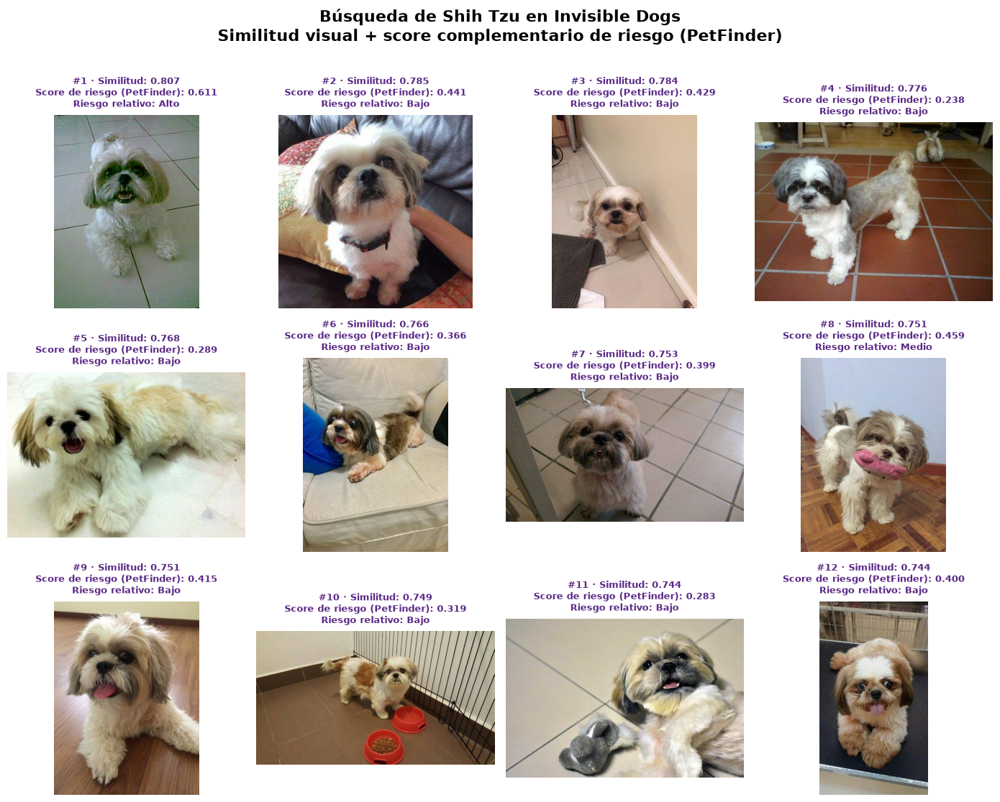

In [91]:
# Aproximación visual al buscador de Invisible Dogs

fig, axes = plt.subplots(
    3,
    4,
    figsize=(14, 11)
)


axes = axes.flatten()


for ax, fila in zip(
    axes,
    ranking_shih_tzu_invisible_df.itertuples(
        index=False
    )
):

    ruta_imagen = Path(
        fila.ruta_imagen_principal
    )


    with Image.open(
        ruta_imagen
    ) as img:

        imagen = (
            img
            .convert("RGB")
            .copy()
        )


    ax.imshow(
        imagen
    )


    ax.set_title(
        f"#{int(fila.posicion)} · "
        f"Similitud: {fila.similitud_visual:.3f}\n"
        f"Score de riesgo (PetFinder): "
        f"{fila.score_riesgo_petfinder:.3f}\n"
        f"Riesgo relativo: "
        f"{fila.nivel_riesgo_relativo}",
        fontsize=9.5,
        color="#5B2A86",
        fontweight="bold",
        pad=8
    )


    ax.axis(
        "off"
    )


plt.suptitle(
    "Búsqueda de Shih Tzu en Invisible Dogs\n"
    "Similitud visual + score complementario de riesgo (PetFinder)",
    fontsize=16,
    fontweight="bold",
    y=1.01
)


plt.tight_layout()

plt.show()

#### 10.6.4. Relación entre similitud visual y riesgo de adopción lenta

La representación anterior sugiere que la similitud respecto a la raza seleccionada y el riesgo estimado de adopción lenta constituyen dimensiones diferentes.

Para comprobarlo de forma exploratoria, se analiza la asociación entre la similitud visual DINOv2 y el *score complementario de riesgo de adopción lenta (PetFinder)* dentro de los perros recuperados.

Este análisis no pretende establecer una relación causal ni extraer conclusiones poblacionales a partir de un número reducido de animales. Su finalidad es comprobar que ambas puntuaciones no representan esencialmente la misma información y justificar su presentación separada dentro de la futura aplicación.

In [92]:
# Relación entre similitud visual
# y score complementario de riesgo de adopción lenta (PetFinder)

from scipy.stats import (
    pearsonr,
    spearmanr
)


similitud_ejemplo = (
    ranking_shih_tzu_invisible_df[
        "similitud_visual"
    ]
    .to_numpy()
)


score_ejemplo = (
    ranking_shih_tzu_invisible_df[
        "score_riesgo_petfinder"
    ]
    .to_numpy()
)


pearson_r, pearson_p = pearsonr(
    similitud_ejemplo,
    score_ejemplo
)


spearman_rho, spearman_p = spearmanr(
    similitud_ejemplo,
    score_ejemplo
)


print(
    "Correlación de Pearson:"
)

print(
    f"r = {pearson_r:.4f}"
)

print(
    f"p-value = {pearson_p:.4f}"
)


print(
    "\nCorrelación de Spearman:"
)

print(
    f"rho = {spearman_rho:.4f}"
)

print(
    f"p-value = {spearman_p:.4f}"
)

Correlación de Pearson:
r = 0.4949
p-value = 0.1019

Correlación de Spearman:
rho = 0.3566
p-value = 0.2551


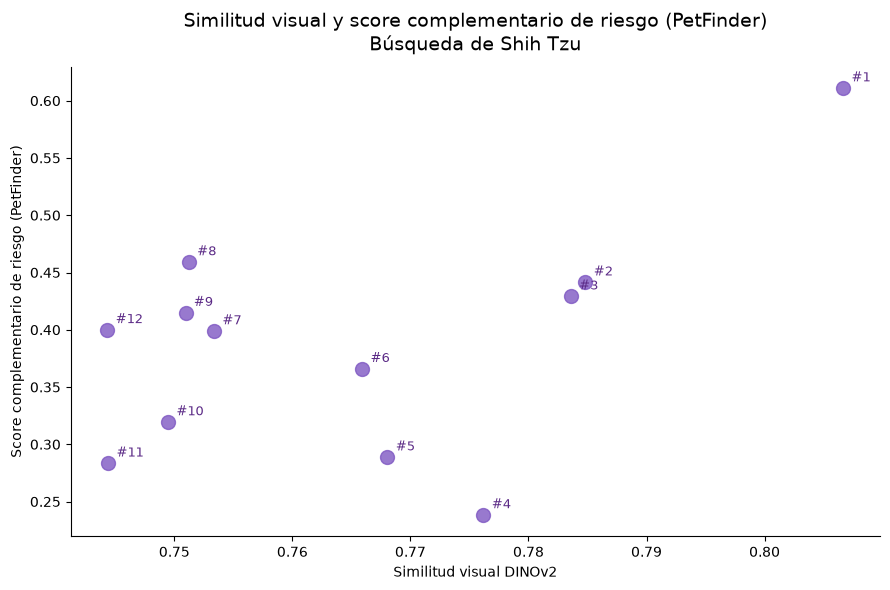

In [93]:
# Representación de similitud visual
# frente al score complementario de riesgo de adopción lenta (PetFinder)

fig, ax = plt.subplots(
    figsize=(9, 6)
)


ax.scatter(
    ranking_shih_tzu_invisible_df[
        "similitud_visual"
    ],
    ranking_shih_tzu_invisible_df[
        "score_riesgo_petfinder"
    ],
    s=100,
    alpha=0.8,
    color="#7E57C2"
)


for fila in (
    ranking_shih_tzu_invisible_df
    .itertuples(index=False)
):

    ax.annotate(
        f"#{int(fila.posicion)}",
        (
            fila.similitud_visual,
            fila.score_riesgo_petfinder
        ),
        xytext=(6, 5),
        textcoords="offset points",
        fontsize=9,
        color="#5B2A86"
    )


ax.set_title(
    "Similitud visual y score complementario de riesgo (PetFinder)\n"
    "Búsqueda de Shih Tzu",
    fontsize=14,
    pad=12
)


ax.set_xlabel(
    "Similitud visual DINOv2"
)


ax.set_ylabel(
    "Score complementario de riesgo (PetFinder)"
)


ax.spines[
    "top"
].set_visible(
    False
)

ax.spines[
    "right"
].set_visible(
    False
)


plt.tight_layout()

plt.show()

#### 10.6.5. Interpretación de la relación entre ambas puntuaciones

La relación entre la similitud visual DINOv2 y el score complementario de riesgo de adopción lenta (PetFinder) muestra una tendencia positiva moderada mediante la correlación de Pearson (`r = 0,4949`), aunque esta asociación no alcanza significación estadística (`p = 0,1019`). La correlación de Spearman presenta una magnitud inferior (`ρ = 0,3566`) y tampoco resulta estadísticamente significativa (`p = 0,2551`).

Estos resultados deben interpretarse únicamente de forma exploratoria, dado que el análisis se realiza sobre los doce primeros perros recuperados para una única raza y, por tanto, no constituye una evaluación poblacional de la relación entre ambas variables.

La ausencia de una asociación estadísticamente significativa **es compatible con la interpretación de que ambas dimensiones aportan información diferente**, pero no permite demostrar su independencia a partir de esta muestra reducida. En el ejemplo analizado, perros con una apariencia muy similar a la raza seleccionada presentan niveles de riesgo distintos.

Este comportamiento respalda el planteamiento adoptado para *Invisible Dogs*: la similitud visual responde a las preferencias del adoptante, mientras que el score complementario de riesgo de adopción lenta de PetFinder aporta una segunda dimensión orientada a identificar animales que podrían requerir una mayor visibilidad. Por este motivo, ambas puntuaciones se mantienen separadas y no se fusionan en un único indicador.

## 11. Preparación de artefactos para la futura aplicación

Los análisis realizados permiten definir los elementos necesarios para trasladar la búsqueda visual a una futura aplicación de *Invisible Dogs*.

DINOv2 se conserva como representación visual principal y los prototipos construidos a partir de Tsinghua Dogs actuarán como referencias de las diferentes razas disponibles. Por otra parte, los embeddings de PetFinder permiten comparar cada perro con dichos prototipos, mientras que el score complementario de riesgo de PetFinder proporciona información adicional sobre la adopción lenta.

En este apartado se preparan y validan los artefactos necesarios para reutilizar estas representaciones sin volver a ejecutar los procesos computacionalmente costosos realizados durante el análisis.

La selección de una **fotografía representativa por raza** a partir de la proximidad al prototipo se reserva para el Notebook 08, donde se utilizará directamente en el diseño del MVP y podrá almacenarse en un formato apropiado para la interfaz.

In [94]:
# Catálogo de razas disponible para la búsqueda visual

catalogo_razas_app_df = (
    razas_tsinghua_df[
        [
            "label",
            "raza_display"
        ]
    ]
    .copy()
    .sort_values(
        "raza_display"
    )
    .reset_index(
        drop=True
    )
)


catalogo_razas_app_path = (
    tsinghua_outputs_path
    / "invisible_dogs_breed_catalog.csv"
)


catalogo_razas_app_df.to_csv(
    catalogo_razas_app_path,
    index=False,
    encoding="utf-8-sig"
)


print(
    "Razas disponibles:"
)

print(
    len(
        catalogo_razas_app_df
    )
)


print(
    "\nCatálogo guardado en:"
)

print(
    catalogo_razas_app_path
)


display(
    catalogo_razas_app_df
    .head(15)
)

Razas disponibles:
130

Catálogo guardado en:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\tsinghua_visual\invisible_dogs_breed_catalog.csv


,label,raza_display
0,7,Affenpinscher
1,63,Afghan Hound
2,38,African Hunting Dog
3,5,Airedale
4,51,American Staffordshire Terrier
5,90,Appenzeller
6,101,Australian Shepherd
7,9,Australian Terrier
8,100,Basenji
9,99,Basset


In [95]:
# Construcción del índice de perros para la futura aplicación

petfinder_app_index_df = (
    petfinder_busqueda_final_df
    .merge(
        petfinder_razas_base_df[
            [
                "PetID",
                "raza_principal",
                "raza_secundaria"
            ]
        ],
        on="PetID",
        how="left",
        validate="one_to_one"
    )
)


columnas_app = [
    "PetID",
    "ruta_imagen_principal",
    "conjunto_petfinder",
    "raza_principal",
    "raza_secundaria",
    "prob_adopcion_lenta_petfinder_final",
    "pred_adopcion_lenta_petfinder_final",
    "nivel_riesgo_relativo",
    "origen_score_petfinder_final"
]


petfinder_app_index_df = (
    petfinder_app_index_df[
        columnas_app
    ]
    .copy()
)


print(
    "Perros disponibles:"
)

print(
    len(
        petfinder_app_index_df
    )
)


print(
    "\nPetID únicos:"
)

print(
    petfinder_app_index_df[
        "PetID"
    ].nunique()
)


print(
    "\nScores ausentes:"
)

print(
    petfinder_app_index_df[
        "prob_adopcion_lenta_petfinder_final"
    ]
    .isna()
    .sum()
)


display(
    petfinder_app_index_df
    .head()
)

Perros disponibles:
7938

PetID únicos:
7938

Scores ausentes:
0


,PetID,ruta_imagen_principal,conjunto_petfinder,raza_principal,raza_secundaria,prob_adopcion_lenta_petfinder_final,pred_adopcion_lenta_petfinder_final,nivel_riesgo_relativo,origen_score_petfinder_final
0,3422e4906,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...,train,Mixed Breed,NaN,0.607967,1,Alto,OOF desarrollo
1,5842f1ff5,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...,train,Mixed Breed,NaN,0.655106,1,Alto,OOF desarrollo
2,850a43f90,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...,test,Mixed Breed,NaN,0.444940,1,Bajo,Test fuera de muestra
3,97aa9eeac,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...,valid,Mixed Breed,NaN,0.525963,1,Medio,OOF desarrollo
4,8b693ca84,g:\Mi unidad\TFM\invisible-dogs-tfm\data\raw_p...,train,Mixed Breed,NaN,0.331724,0,Bajo,OOF desarrollo


In [96]:
# Comprobación de correspondencia entre
# el índice de la aplicación y los embeddings DINOv2

petfinder_app_index_df = (
    pd.DataFrame({
        "PetID": (
            petids_petfinder_dinov2
            .astype(str)
        )
    })
    .merge(
        petfinder_app_index_df,
        on="PetID",
        how="left",
        validate="one_to_one"
    )
)


orden_correcto_app = np.array_equal(
    petfinder_app_index_df[
        "PetID"
    ]
    .astype(str)
    .to_numpy(),
    petids_petfinder_dinov2
    .astype(str)
)


print(
    "¿Coincide el orden con los embeddings?"
)

print(
    orden_correcto_app
)


print(
    "\nNúmero de perros:"
)

print(
    len(
        petfinder_app_index_df
    )
)


print(
    "\nMetadatos ausentes:"
)

print(
    petfinder_app_index_df[
        "ruta_imagen_principal"
    ]
    .isna()
    .sum()
)


if not orden_correcto_app:

    raise ValueError(
        "El orden del índice de la aplicación "
        "no coincide con los embeddings DINOv2."
    )

¿Coincide el orden con los embeddings?
True

Número de perros:
7938

Metadatos ausentes:
0


In [97]:
# Guardado del índice definitivo para la aplicación

petfinder_app_index_path = (
    tsinghua_outputs_path
    / "invisible_dogs_petfinder_search_index.csv"
)


petfinder_app_index_df.to_csv(
    petfinder_app_index_path,
    index=False,
    encoding="utf-8-sig"
)


print(
    "Índice guardado en:"
)

print(
    petfinder_app_index_path
)


print(
    "\nTamaño:"
)

print(
    f"{petfinder_app_index_path.stat().st_size / 1024**2:.2f} MB"
)

Índice guardado en:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\tsinghua_visual\invisible_dogs_petfinder_search_index.csv

Tamaño:
1.21 MB


In [98]:
# Comprobación de artefactos necesarios
# para la búsqueda visual

artefactos_app_df = pd.DataFrame({
    "artefacto": [
        "Prototipos DINOv2 de raza",
        "Embeddings DINOv2 de PetFinder",
        "Catálogo de razas",
        "Índice de perros y scores"
    ],

    "ruta": [
        str(
            dinov2_prototipos_path
        ),

        str(
            petfinder_dinov2_path
        ),

        str(
            catalogo_razas_app_path
        ),

        str(
            petfinder_app_index_path
        )
    ]
})


artefactos_app_df[
    "existe"
] = (
    artefactos_app_df[
        "ruta"
    ]
    .apply(
        lambda ruta:
        Path(ruta).exists()
    )
)


print(
    "Artefactos preparados para "
    "la futura aplicación:"
)


display(
    artefactos_app_df
)


print(
    "\n¿Todos disponibles?"
)

print(
    artefactos_app_df[
        "existe"
    ].all()
)

Artefactos preparados para la futura aplicación:


,artefacto,ruta,existe
0,Prototipos DINOv2 de raza,G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\ts...,True
1,Embeddings DINOv2 de PetFinder,G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\pe...,True
2,Catálogo de razas,G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\ts...,True
3,Índice de perros y scores,G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\ts...,True



¿Todos disponibles?
True


### 11.1. Configuración reproducible del buscador

Además de los artefactos visuales y los metadatos de los perros, se almacena la configuración utilizada para construir el buscador.

Este archivo permite recuperar posteriormente la representación visual seleccionada, el modelo preentrenado empleado y los puntos de corte utilizados para interpretar el *score complementario de riesgo de adopción lenta de PetFinder*, evitando depender del estado de ejecución del presente notebook.

In [99]:
# Guardado de la configuración del buscador

import json


configuracion_busqueda_app = {
    "modelo_visual": "facebook/dinov2-small",
    "dimension_embedding": int(
        DIMENSION_DINOV2
    ),
    "metrica_similitud": "cosine_similarity",
    "n_razas": int(
        len(
            catalogo_razas_app_df
        )
    ),
    "n_perros_petfinder": int(
        len(
            petfinder_app_index_df
        )
    ),
    "umbral_riesgo_bajo_medio": float(
        umbral_riesgo_bajo
    ),
    "umbral_riesgo_medio_alto": float(
        umbral_riesgo_alto
    ),
    "orden_ranking_principal": (
        "similitud_visual_descendente"
    ),
    "score_riesgo_fuente": (
        "prob_adopcion_lenta_petfinder_final - Notebook 05"
    ),
    "niveles_riesgo": (
        "terciles definidos sobre scores OOF de desarrollo"
    )
}


configuracion_busqueda_app_path = (
    tsinghua_outputs_path
    / "invisible_dogs_search_config.json"
)


with open(
    configuracion_busqueda_app_path,
    "w",
    encoding="utf-8"
) as archivo:

    json.dump(
        configuracion_busqueda_app,
        archivo,
        indent=4,
        ensure_ascii=False
    )


print(
    "Configuración guardada en:"
)

print(
    configuracion_busqueda_app_path
)


print(
    "\nConfiguración:"
)

print(
    json.dumps(
        configuracion_busqueda_app,
        indent=4,
        ensure_ascii=False
    )
)

Configuración guardada en:
G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\tsinghua_visual\invisible_dogs_search_config.json

Configuración:
{
    "modelo_visual": "facebook/dinov2-small",
    "dimension_embedding": 384,
    "metrica_similitud": "cosine_similarity",
    "n_razas": 130,
    "n_perros_petfinder": 7938,
    "umbral_riesgo_bajo_medio": 0.4582939392795886,
    "umbral_riesgo_medio_alto": 0.6051373469810215,
    "orden_ranking_principal": "similitud_visual_descendente",
    "score_riesgo_fuente": "prob_adopcion_lenta_petfinder_final - Notebook 05",
    "niveles_riesgo": "terciles definidos sobre scores OOF de desarrollo"
}


In [100]:
# Comprobación final de artefactos
# preparados para la futura aplicación

artefactos_app_df = pd.DataFrame({
    "artefacto": [
        "Prototipos DINOv2 de raza",
        "Embeddings DINOv2 de PetFinder",
        "Catálogo de razas",
        "Índice de perros y scores",
        "Configuración del buscador"
    ],

    "ruta": [
        str(
            dinov2_prototipos_path
        ),

        str(
            petfinder_dinov2_path
        ),

        str(
            catalogo_razas_app_path
        ),

        str(
            petfinder_app_index_path
        ),

        str(
            configuracion_busqueda_app_path
        )
    ]
})


artefactos_app_df[
    "existe"
] = (
    artefactos_app_df[
        "ruta"
    ]
    .apply(
        lambda ruta:
        Path(ruta).exists()
    )
)


display(
    artefactos_app_df
)


print(
    "\n¿Todos los artefactos están disponibles?"
)

print(
    artefactos_app_df[
        "existe"
    ].all()
)

,artefacto,ruta,existe
0,Prototipos DINOv2 de raza,G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\ts...,True
1,Embeddings DINOv2 de PetFinder,G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\pe...,True
2,Catálogo de razas,G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\ts...,True
3,Índice de perros y scores,G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\ts...,True
4,Configuración del buscador,G:\Mi unidad\TFM\invisible-dogs-tfm\outputs\ts...,True



¿Todos los artefactos están disponibles?
True


## 12. Conclusiones

El presente notebook ha ampliado el planteamiento de *Invisible Dogs* incorporando una funcionalidad de **búsqueda por similitud visual** basada en representaciones preentrenadas y evaluada mediante un conjunto de datos externo.

Tsinghua Dogs permitió construir representaciones visuales de **130 razas caninas** a partir de un conjunto de entrenamiento equilibrado de 20.800 fotografías, manteniendo 5.200 imágenes independientes —40 por raza— para la evaluación.

Se compararon dos arquitecturas preentrenadas, CLIP y DINOv2, utilizando exactamente las mismas fotografías y el mismo procedimiento de construcción de prototipos. Los resultados mostraron una ventaja consistente de DINOv2.

Sobre el conjunto independiente de validación de Tsinghua Dogs, DINOv2 alcanzó:

- **Top-1: 77,73 %**
- **Top-5: 97,10 %**
- **Top-10: 99,04 %**
- **MRR: 0,8622**
- **Precision@5: 88,46 %**
- **Precision@10: 85,62 %**
- **Precision@20: 79,15 %**
- **Precision@40: 64,02 %**

La comparación pareada por raza mostró que DINOv2 obtuvo una Precision@10 superior en 104 de las 130 categorías, con una diferencia media de 0,2962. La prueba bilateral de Wilcoxon confirmó una diferencia estadísticamente significativa entre ambas representaciones (`p < 0,001`).

A partir de estos resultados, **DINOv2 fue seleccionado como representación visual principal** para la futura funcionalidad de búsqueda de *Invisible Dogs*.

Posteriormente se estudió la transferencia de los prototipos construidos con Tsinghua Dogs hacia PetFinder. Se identificaron **75 correspondencias nominales** entre ambos catálogos, aunque no todas disponían de perros con fotografía dentro del subconjunto analizado. La evaluación puso de manifiesto la importancia de considerar el soporte disponible por categoría, debido al fuerte desequilibrio existente en PetFinder.

Al restringir el análisis a las 13 razas con al menos 20 perros disponibles, la transferencia externa alcanzó:

- **Precision@5: 78,46 %**
- **Precision@10: 79,23 %**
- **Precision@20: 70,38 %**
- **Hit Rate@5: 100 %**
- **Hit Rate@10: 100 %**
- **Hit Rate@20: 100 %**

Estos resultados aportan evidencia de que los prototipos visuales construidos a partir de Tsinghua Dogs mantienen utilidad de recuperación cuando se aplican sobre fotografías procedentes de PetFinder, a pesar del cambio de fuente y de las diferencias existentes entre ambos dominios visuales.

El ejemplo de Shih Tzu permitió ilustrar especialmente este comportamiento. La raza dispone de 200 perros en PetFinder y alcanzó una Precision@5, Precision@10 y Precision@20 iguales a 1, mostrando una elevada coherencia tanto cuantitativa como visual.

Finalmente, la búsqueda visual se presentó junto con el **score complementario de riesgo de adopción lenta de PetFinder** generado en el Notebook 05. Ambas puntuaciones se mantuvieron deliberadamente separadas: la similitud DINOv2 determina qué animales presentan una apariencia más próxima a las preferencias del adoptante, mientras que el score predictivo aporta información adicional sobre el riesgo estimado de adopción lenta. Este score se utiliza como aproximación funcional para el flujo PetFinder y no sustituye al score principal del proyecto basado en Austin.

El ejemplo final mostró que perros altamente similares visualmente pueden presentar niveles de riesgo diferentes, apoyando el uso complementario de ambas fuentes de información en lugar de su fusión en una única puntuación.

Como resultado, el proyecto dispone ahora de los elementos necesarios para construir una futura aplicación interactiva:

1. un catálogo de 130 razas;
2. prototipos visuales DINOv2 para cada raza;
3. embeddings DINOv2 de 7.938 perros de PetFinder;
4. metadatos y score complementario de riesgo asociados a cada animal;
5. una estrategia evaluada de recuperación mediante similitud visual;
6. índices y configuración reproducibles para reutilizar los artefactos sin recalcular los embeddings.

Estos elementos constituirán la base del siguiente desarrollo, orientado a construir un prototipo funcional de *Invisible Dogs* en el que el usuario pueda seleccionar una raza o apariencia de referencia, recuperar perros visualmente similares y consultar simultáneamente información de riesgo de adopción lenta.

## 13. Referencias principales

### Artículo y conjunto de datos

- Zou, D.-N., Zhang, S.-H., Mu, T.-J., & Zhang, M. (2020). *A new dataset of dog breed images and a benchmark for fine-grained classification*. **Computational Visual Media, 6**, 477–487. https://doi.org/10.1007/s41095-020-0184-6
- Tsinghua Dogs — versión de datos utilizada en este proyecto: `giacomov/tsinghua_dogs`, Hugging Face. https://huggingface.co/datasets/giacomov/tsinghua_dogs

### Modelos preentrenados

- Radford, A., Kim, J. W., Hallacy, C., Ramesh, A., Goh, G., Agarwal, S., Sastry, G., Askell, A., Mishkin, P., Clark, J., Krueger, G., & Sutskever, I. (2021). *Learning Transferable Visual Models From Natural Language Supervision*. **Proceedings of the 38th International Conference on Machine Learning, 139**, 8748–8763. https://proceedings.mlr.press/v139/radford21a.html
- CLIP ViT-B/32 — checkpoint utilizado: `openai/clip-vit-base-patch32`, Hugging Face. https://huggingface.co/openai/clip-vit-base-patch32
- Oquab, M., Darcet, T., Moutakanni, T., Vo, H., Szafraniec, M., Khalidov, V., Fernandez, P., Haziza, D., Massa, F., El-Nouby, A., Assran, M., Ballas, N., Galuba, W., Howes, R., Huang, P.-Y., Li, S.-W., Misra, I., Rabbat, M., Sharma, V., Synnaeve, G., Xu, H., Jégou, H., Mairal, J., Labatut, P., Joulin, A., & Bojanowski, P. (2023). *DINOv2: Learning Robust Visual Features without Supervision*. arXiv:2304.07193. https://arxiv.org/abs/2304.07193
- DINOv2-small — checkpoint utilizado: `facebook/dinov2-small`, Hugging Face. https://huggingface.co/facebook/dinov2-small

Las referencias anteriores documentan las fuentes externas, el conjunto de datos y los modelos preentrenados utilizados. Los resultados numéricos del notebook proceden de las ejecuciones realizadas sobre las particiones y artefactos del proyecto *Invisible Dogs*.
